In [1]:
suppressMessages(library(RSkittleBrewer))
suppressMessages(library(genefilter))
suppressMessages(library(devtools))
suppressMessages(library(limma))
suppressMessages(library(edgeR))
suppressMessages(library(ggplot2))
suppressMessages(library(DESeq2))
suppressMessages(library(calibrate))
suppressMessages(library(stringr))
suppressMessages(library(ggrepel))
suppressMessages(library(cluster))
suppressMessages(library(Biobase))
suppressMessages(library(qvalue))
suppressMessages(library(EBSeq))
suppressMessages(library(Rsamtools))
suppressMessages(library(GenomicFeatures))
suppressMessages(library(GenomicAlignments))
suppressMessages(library(tximport))
suppressMessages(library(readr))
suppressMessages(library(tximportData))
suppressMessages(library(apeglm))
suppressMessages(library(knitr))
suppressMessages(library(IHW))
suppressMessages(library(ashr))
suppressMessages(library(org.Hs.eg.db))
suppressMessages(library(AnnotationDbi))
suppressMessages(library(ReportingTools))
suppressMessages(library(regionReport))
suppressMessages(library(Glimma))
suppressMessages(library(pcaExplorer))
suppressMessages(library(DEVis))
suppressMessages(library(vsn))
suppressMessages(library(repr))
suppressMessages(library(pheatmap))
suppressMessages(library(RColorBrewer))
suppressMessages(library(glmpca))
suppressMessages(library(Gviz))
suppressMessages(library(TxDb.Hsapiens.UCSC.hg38.knownGene))
suppressMessages(library(ensembldb))
suppressMessages(library(EnsDb.Hsapiens.v86))
suppressMessages(library(tximeta))
suppressMessages(library(GenomicRanges))
suppressMessages(library(biovizBase))
suppressMessages(library(ggbio))
suppressMessages(library(karyoploteR))
suppressMessages(library(gplots))
suppressMessages(library(dplyr))
suppressMessages(library(SummarizedExperiment))
suppressMessages(library(PCAtools))
suppressMessages(library(sva))
suppressMessages(library(DRIMSeq))
suppressMessages(library(biomaRt))
suppressMessages(library(grid))
suppressMessages(library(PoiClaClu))
suppressMessages(library(rnaseqDTU))
suppressMessages(library(BiocParallel))
suppressMessages(library(stageR))
suppressMessages(library(DEXSeq))
suppressMessages(library(DEGreport))
suppressMessages(library(DOSE))
suppressMessages(library(pathview))
suppressMessages(library(clusterProfiler))
suppressMessages(library(AnnotationHub))

In [2]:
register(MulticoreParam(35))

In [3]:
# suppress warning messages
options(warn=-1)

In [4]:
# disable scientific notation
options(scipen=999)

# SALMON

In [5]:
getwd()

[1] "/mnt/nfs/shared/999993-Bioda/projects/kaja_transposons/RNA_SEQ/KPSP_MIX1+2"

In [6]:
# function to store heatmaps as png
save_pheatmap_png <- function(x, filename, width=580, height=480) {
   stopifnot(!missing(x))
   stopifnot(!missing(filename))
   png(filename, width=width, height=height)
   grid::grid.newpage()
   grid::grid.draw(x$gtable)
   invisible(dev.off())
}

## Salmon -> DESeq2

### Import A) tximeta - transcripts with metadata

In [102]:
salmon_samples <- read.table(file.path("SALMON_IN", "salmon_samples.txt"), header = FALSE)
files <- file.path("SALMON_IN", 
                   paste0(salmon_samples$V1, 
                          "/",  
                          "quant.sf"))
condition = factor(rep(c('C','T'), each = 8))
coldata <- data.frame(files, 
                      names=paste0(c(as.vector(salmon_samples$V1))), 
                      condition=condition, 
                      stringsAsFactors=FALSE)
indexDir <- file.path("REF", "SALMON_INDEX")
fastaFile = file.path("REF", "gencode.v32.transcripts.fa")
gtfPath = file.path("REF", "gencode.v32.annotation.gtf")
suppressMessages(makeLinkedTxome(indexDir=indexDir, 
                source="Gencode", 
                organism="Homo Sapiens",
                release="32", 
                genome="GRCh38", 
                fasta=fastaFile, 
                gtf=gtfPath, 
                write=FALSE))
suppressMessages(se <- tximeta(coldata, 
                               countsFromAbundance = "lengthScaledTPM"))
se

class: RangedSummarizedExperiment 
dim: 226608 16 
metadata(6): tximetaInfo quantInfo ... txomeInfo txdbInfo
assays(33): counts abundance ... infRep29 infRep30
rownames(226608): ENST00000456328.2 ENST00000450305.2 ...
  ENST00000387460.2 ENST00000387461.2
rowData names(3): tx_id gene_id tx_name
colnames(16): RNA01 RNA02 ... RNA15 RNA16
colData names(2): names condition

In [103]:
cols = c('0286', '1567', '0842', '1208',
           '0271', '1215', '1152', '0462',
           '0384', '0627', '0871', '0414',
           '0820', '0208', '1335', '1727')

In [105]:
colnames(se) <- cols

In [106]:
# transform SummarizedExperiment into a DESeqDataSet
suppressMessages(ddsS <- DESeqDataSet(se, design = ~condition))
# Pre-filtering
keep <- rowSums(counts(ddsS) >= 5 ) >= 8 # at least x counts in y samples
# keep <- rowSums(counts(ddsS)) > 1
ddsSE <- ddsS[keep,]
ddsSE

class: DESeqDataSet 
dim: 67111 16 
metadata(7): tximetaInfo quantInfo ... txdbInfo version
assays(33): counts abundance ... infRep29 infRep30
rownames(67111): ENST00000488147.1 ENST00000466430.5 ...
  ENST00000361681.2 ENST00000361789.2
rowData names(3): tx_id gene_id tx_name
colnames(16): 0286 1567 ... 1335 1727
colData names(2): names condition

In [109]:
# Run DESeq2 on DESeqDataSet
# --> performs default analysis:
# 1) estimation of size factors: estimateSizeFactors
# 2) estimation of dispersion: estimateDispersions
# 3) Negative Binomial GLM fitting and Wald statistics: nbinomWaldTest
# --------
# Instead of using variance as the measure of variation 
# in the data (since variance correlates with gene expression level)
# it uses dispersion as measure of variation, 
# which accounts for a gene’s variance and mean expression level
# --------
# count data generated by RNA-seq exhibits overdispersion 
# (variance > mean) and the statistical distribution used 
# to model the counts needs to account for this overdispersion
# --> negative binomial distribution to model the RNA-seq counts
# --------
# Null Hypothesis: no DE across the two sample groups (LFC == 0)
# --> Wald test
suppressMessages(ddsSE <- DESeq(ddsSE))
ddsSE

class: DESeqDataSet 
dim: 67111 16 
metadata(7): tximetaInfo quantInfo ... txdbInfo version
assays(38): counts abundance ... replaceCounts replaceCooks
rownames(67111): ENST00000488147.1 ENST00000466430.5 ...
  ENST00000361681.2 ENST00000361789.2
rowData names(26): tx_id gene_id ... maxCooks replace
colnames(16): 0286 1567 ... 1335 1727
colData names(4): names condition sizeFactor replaceable

### Add genes symbols to ddsSE dataset --> Python

In [110]:
# number of transcripts
length(rownames(ddsSE))

[1] 67111

In [111]:
# Get transcripts IDs list
tx_list <- rownames(ddsSE)
head(tx_list)

[1] "ENST00000488147.1" "ENST00000466430.5" "ENST00000471248.1"
[4] "ENST00000484859.1" "ENST00000466557.6" "ENST00000662089.1"

In [112]:
# Get genes IDs list
ga_list <- as.character(mcols(ddsSE)$gene_id)
head(ga_list)

[1] "ENSG00000227232.5" "ENSG00000238009.6" "ENSG00000238009.6"
[4] "ENSG00000241860.7" "ENSG00000241860.7" "ENSG00000241860.7"

In [113]:
# create a dataframe from both lists and export for Python processing with Pyensembl
tx_df = data.frame("TX_ID" = tx_list, "GENE_ID" = ga_list, stringsAsFactors = FALSE)
write.table(tx_df, 
            file = "SALMON_TEMP/TXIMETA_salmon_txIdList_ddsSE.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [114]:
# back from Python
# structurue: ['TX_ID', 'TX_NAME', 'GENE_ID', 'GENE_NAME']
tx_df <- read.table(file="SALMON_TEMP/TXIMETA_salmon_txIdList_ddsSE_OK.txt", 
                        sep="\t", 
                        header=T, 
                        stringsAsFactors=F)

In [115]:
# check if rownames and processed dataframe length match
length(tx_df$TX_ID) == length(rownames(ddsSE))

[1] TRUE

In [116]:
# original order of dataset columns
colnames(mcols(ddsSE))

[1] "tx_id"                          "gene_id"                       
 [3] "tx_name"                        "baseMean"                      
 [5] "baseVar"                        "allZero"                       
 [7] "dispGeneEst"                    "dispGeneIter"                  
 [9] "dispFit"                        "dispersion"                    
[11] "dispIter"                       "dispOutlier"                   
[13] "dispMAP"                        "Intercept"                     
[15] "condition_T_vs_C"               "SE_Intercept"                  
[17] "SE_condition_T_vs_C"            "WaldStatistic_Intercept"       
[19] "WaldStatistic_condition_T_vs_C" "WaldPvalue_Intercept"          
[21] "WaldPvalue_condition_T_vs_C"    "betaConv"                      
[23] "betaIter"                       "deviance"                      
[25] "maxCooks"                       "replace"

In [117]:
# replace ddsSE rownames by TX_NAME, tx_id by TX_ID, gene_id by GENE_ID, create new column gene_name, reorder columns
rownames(ddsSE) <- tx_df$TX_NAME
mcols(ddsSE)$tx_id <- tx_df$TX_ID
mcols(ddsSE)$tx_name <- tx_df$TX_NAME
mcols(ddsSE)$gene_id <- tx_df$GENE_ID
mcols(ddsSE)$gene_name <- tx_df$GENE_NAME
col_order <- c('tx_id','tx_name','gene_id','gene_name', 'baseMean', 'baseVar', 'allZero', 'dispGeneEst',
               'dispGeneIter', 'dispFit', 'dispersion', 'dispIter', 'dispOutlier', 'dispMAP', 'Intercept',
               'condition_T_vs_C', 'SE_Intercept','SE_condition_T_vs_C', 'WaldStatistic_Intercept', 
               'WaldStatistic_condition_T_vs_C','WaldPvalue_Intercept', 'WaldPvalue_condition_T_vs_C', 
               'betaConv', 'betaIter', 'deviance', 'maxCooks', 'replace')
invisible(mcols(ddsSE) <- mcols(ddsSE)[, col_order])
colnames(mcols(ddsSE)[, col_order])

[1] "tx_id"                          "tx_name"                       
 [3] "gene_id"                        "gene_name"                     
 [5] "baseMean"                       "baseVar"                       
 [7] "allZero"                        "dispGeneEst"                   
 [9] "dispGeneIter"                   "dispFit"                       
[11] "dispersion"                     "dispIter"                      
[13] "dispOutlier"                    "dispMAP"                       
[15] "Intercept"                      "condition_T_vs_C"              
[17] "SE_Intercept"                   "SE_condition_T_vs_C"           
[19] "WaldStatistic_Intercept"        "WaldStatistic_condition_T_vs_C"
[21] "WaldPvalue_Intercept"           "WaldPvalue_condition_T_vs_C"   
[23] "betaConv"                       "betaIter"                      
[25] "deviance"                       "maxCooks"                      
[27] "replace"

In [118]:
# lists the coefficients
resultsNames(ddsSE)

[1] "Intercept"        "condition_T_vs_C"

In [119]:
head(rownames(mcols(ddsSE)))

[1] "WASH7P-201"     "AL627309.1-201" "AL627309.1-203" "AL627309.5-201"
[5] "AL627309.5-203" "AL627309.5-205"

#### DESeq2 results

In [120]:
# produce results dataset
res_se <- DESeq2::results(ddsSE, name="condition_T_vs_C")
length(rownames(res_se))

[1] 67111

In [121]:
colnames(res_se)

[1] "baseMean"       "log2FoldChange" "lfcSE"          "stat"          
[5] "pvalue"         "padj"

In [122]:
# rename tx_id and tx_name columns, add gene_id and gene_name column, reorder columns
res_se$tx_id = mcols(ddsSE)$tx_id
res_se$tx_name = mcols(ddsSE)$tx_name
res_se$gene_name = mcols(ddsSE)$gene_name
res_se$gene_id = mcols(ddsSE)$gene_id
col_order <- c('tx_id','tx_name', 'gene_id','gene_name','baseMean', 
               'log2FoldChange', 'lfcSE', 'stat', 'pvalue', 'padj')
invisible(res_se <- res_se[, col_order])

In [123]:
colnames(res_se)

[1] "tx_id"          "tx_name"        "gene_id"        "gene_name"     
 [5] "baseMean"       "log2FoldChange" "lfcSE"          "stat"          
 [9] "pvalue"         "padj"

In [124]:
# subset results to chosen adjusted p-value threshold, reorder by increasing padj
res_sub <- subset(res_se, padj < 0.5)
res_sub <- res_sub[ order(res_sub$padj, decreasing = FALSE), ]
length(rownames(res_sub))

[1] 236

In [125]:
head(rownames(res_sub))

[1] "HGSNAT-204" "TSHZ2-202"  "GNAZ-203"   "IGHG4-201"  "PNMA2-204" 
[6] "OTUD7B-202"

In [126]:
# save results
write.table(res_sub, 
            file = "DESEQ2_RES/DESEQ2_salmon_TXIMETA_results.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [27]:
# check which variables and tests were used in results
mcols(res_sub)$description

[1] NA                                         
 [2] NA                                         
 [3] NA                                         
 [4] NA                                         
 [5] "mean of normalized counts for all samples"
 [6] "log2 fold change (MLE): condition T vs C" 
 [7] "standard error: condition T vs C"         
 [8] "Wald statistic: condition T vs C"         
 [9] "Wald test p-value: condition T vs C"      
[10] "BH adjusted p-values"

#### APEGLM results

In [127]:
# shrink log fold changes association with condition for transcripts
# APEGLM = Approximate Posterior Estimation for GLM coefficients
# GLM = General Linear Model
resApeglm_se <- lfcShrink(ddsSE, coef="condition_T_vs_C", type="apeglm")

using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



In [128]:
# original order of APEGLM dataset columns
colnames(resApeglm_se)

[1] "baseMean"       "log2FoldChange" "lfcSE"          "pvalue"        
[5] "padj"

In [129]:
length(rownames(resApeglm_se))

[1] 67111

In [130]:
head(rownames(resApeglm_se))

[1] "WASH7P-201"     "AL627309.1-201" "AL627309.1-203" "AL627309.5-201"
[5] "AL627309.5-203" "AL627309.5-205"

In [131]:
# add tx_id and tx_name columns, add gene_id and gene_name columns, reorder columns
resApeglm_se$tx_id = mcols(ddsSE)$tx_id
resApeglm_se$tx_name = mcols(ddsSE)$tx_name
resApeglm_se$gene_name = mcols(ddsSE)$gene_name
resApeglm_se$gene_id = mcols(ddsSE)$gene_id
col_order <- c('tx_id','tx_name', 'gene_id','gene_name','baseMean', 
               'log2FoldChange', 'lfcSE', 'pvalue', 'padj')
invisible(resApeglm_se <- resApeglm_se[, col_order])

In [132]:
# subset results to chosen adjusted p-value threshold, reorder by increasing padj
resApeglm_sub <- subset(resApeglm_se, padj < 0.05)
resApeglm_sub <- resApeglm_sub[ order(resApeglm_sub$padj, decreasing = FALSE), ]
length(rownames(resApeglm_sub))

[1] 20

In [34]:
# save results
write.table(resApeglm_sub, 
            file = "DESEQ2_RES/DESEQ2_salmon_TXIMETA_results_ddsSE_APEGLM.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

### VST and RLOG transformations

In [133]:
# variance stabilizing transformation (VST) 
# for negative binomial data with a dispersion-mean trend
vsd_se <- vst(ddsSE, blind = FALSE)

In [134]:
head(assay(vsd_se), 2)

,0286,1567,0842,1208,0271,1215,1152,0462,0384,0627,0871,0414,0820,0208,1335,1727
WASH7P-201,8.426925,8.065597,8.224489,7.828022,8.358664,8.318845,8.632728,8.482912,8.580170,8.548058,8.618477,7.545809,7.871261,8.638905,8.297789,6.592262
AL627309.1-201,5.707253,5.577645,5.518184,5.417913,5.615650,5.751486,5.654141,6.122662,5.278262,5.724946,5.972459,5.136302,5.187223,6.299917,6.077531,5.612497


In [135]:
# RLOG = regularized-logarithm transformation
# with high counts, rlog transformation is similar to log2
# with low counts, values are shrunken towards the transcripts' averages across all samples
# --> avoids low counts to dominate due to strong Poisson noise
# --> rlog-transformed data are approximately homoskedastic
# --> for exploratory analysis, not differential analysis
rld_se <- rlog(ddsSE, blind = FALSE)

In [136]:
head(assay(rld_se), 2)

,0286,1567,0842,1208,0271,1215,1152,0462,0384,0627,0871,0414,0820,0208,1335,1727
WASH7P-201,8.349402,8.053992,8.183702,7.860513,8.293464,8.260867,8.518437,8.395239,8.475170,8.448799,8.506258,7.631682,7.895752,8.523372,8.243629,6.870718
AL627309.1-201,5.495198,5.381424,5.329138,5.240101,5.414848,5.533840,5.448613,5.855761,5.115703,5.510714,5.724436,4.989565,5.035168,6.009098,5.816969,5.412223


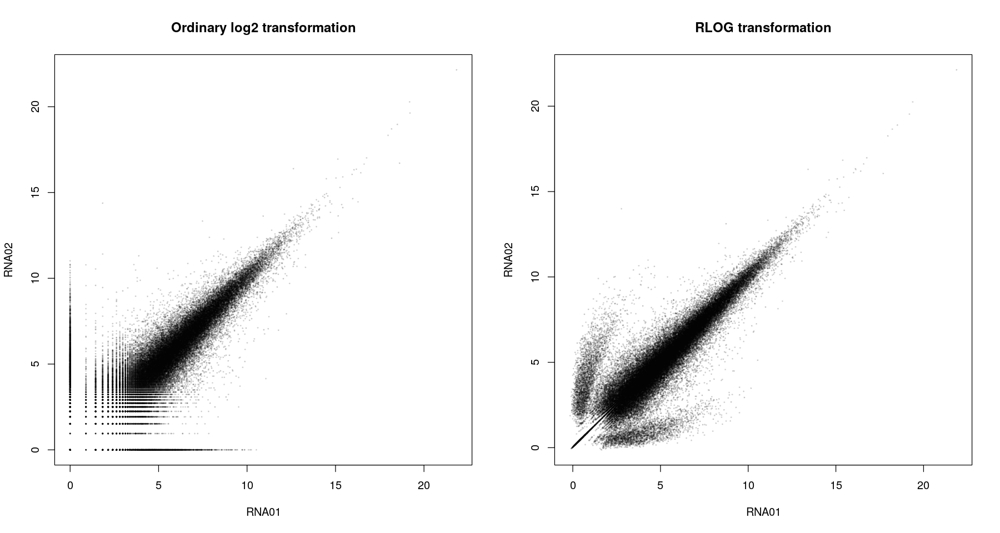

In [39]:
# shows the effect of the RLOG transformation
# plot 1st samples against 2nd
# LEFT: ordinary log2 transformation
# -->  genes with low counts seem to be excessively variable
# RIGHT:  rlog transformation
# -->  difference for tx for which data cannot provide good information is compressed
options(repr.plot.width=15, repr.plot.height=8)
par( mfrow = c( 1, 2 ) )
plot(log2(1+counts(ddsSE, normalized=TRUE)[,1:2]), 
     col="#00000020", 
     pch=20, 
     cex=0.3 )
title(main="Ordinary log2 transformation")
plot(assay(rld_se)[,1:2], 
     col="#00000020", 
     pch=20, 
     cex=0.3)
title(main="RLOG transformation")
invisible(dev.print(png, 
                    "DESEQ2_RES/DESEQ2_salmon_TXIMETA_rlog.png", \
                    width=720, 
                    height=480))

In [137]:
# Samples distance before RLOG
# --> calculate the Euclidean distance between samples
# using rlog-transofrmed data to avoid that the distance measure
# is dominated by a few highly variable genes
# --> function t to transpose the data matrix
sampleDists <- dist(t(assay(ddsSE)))

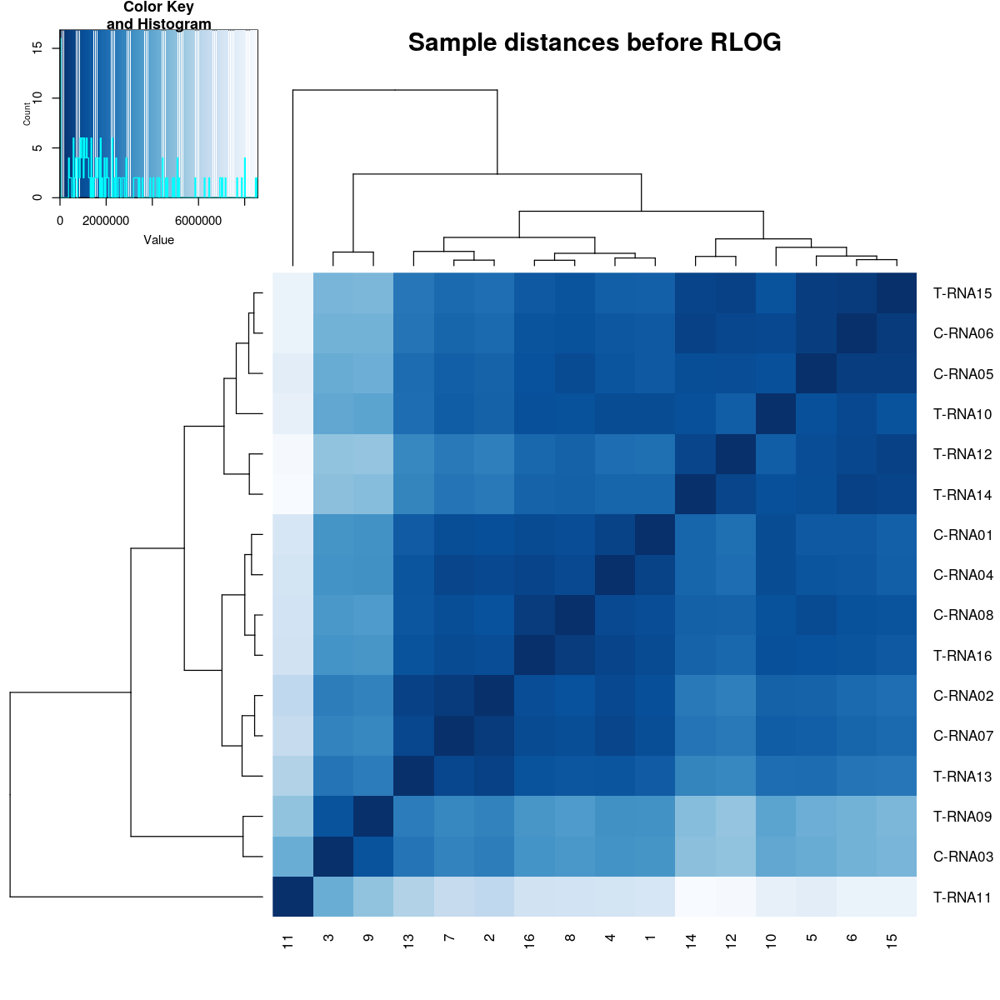

In [41]:
# Log2 sample distance matrix
options(repr.plot.width=10, repr.plot.height=10)
sampleDistMatrix <- as.matrix( sampleDists )
rownames(sampleDistMatrix) <- paste(rld_se$condition, 
                                    rld_se$names, 
                                    sep="-" )
colnames(sampleDistMatrix) <- NULL
colours = colorRampPalette(rev(brewer.pal(9, "Blues")))(255)
heatmap.2(sampleDistMatrix, 
          trace="none", 
          col=colours, 
          main="Sample distances before RLOG")
invisible(dev.print(png, 
                    "DESEQ2_RES/DESEQ2_salmon_TXIMETA_heatmap_euclid_distance_LOG2.png", 
                    width=480, 
                    height=480))

In [42]:
# Samples distance after RLOG
# --> calculate the Euclidean distance between samples
# using rlog-transofrmed data to avoid that the distance measure
# is dominated by a few highly variable genes
# --> function t to transpose the data matrix
sampleDists <- dist(t(assay(rld_se)))

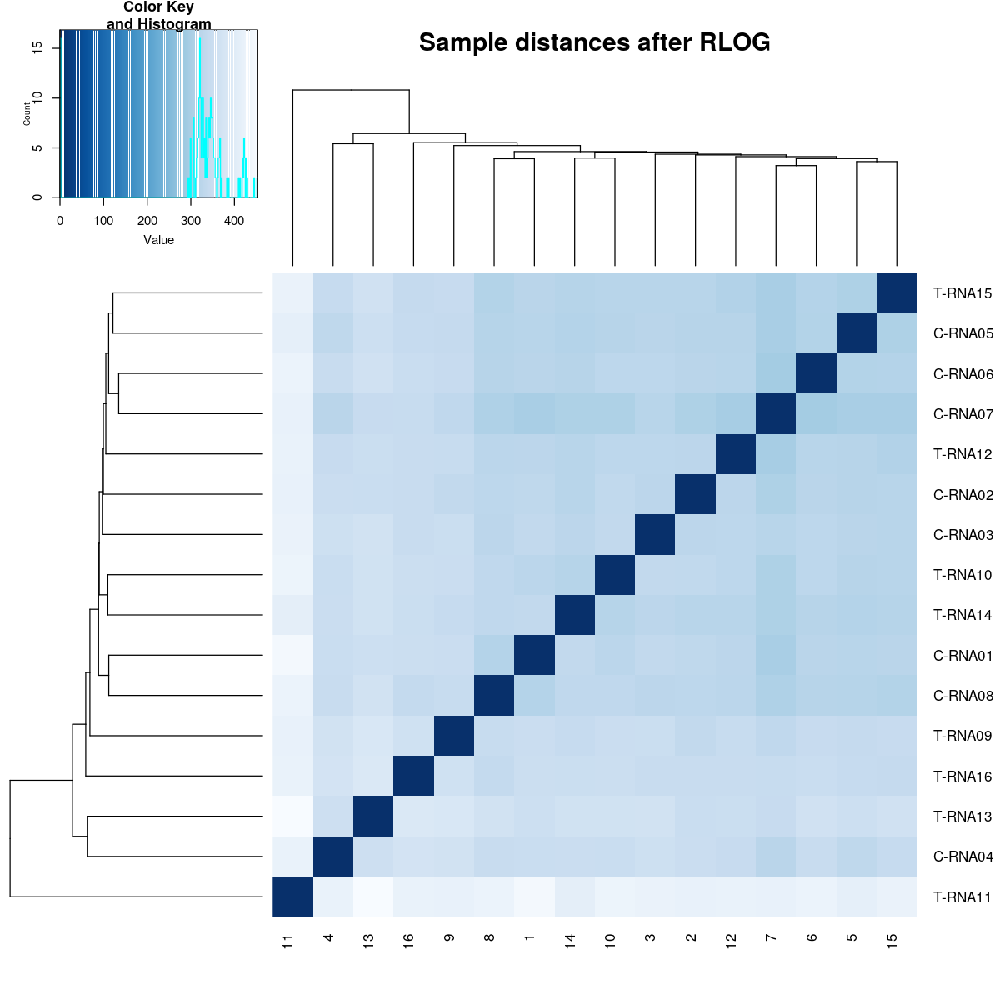

In [43]:
# RLOG sample distance matrix
options(repr.plot.width=10, 
        repr.plot.height=10)
sampleDistMatrix <- as.matrix(sampleDists)
rownames(sampleDistMatrix) <- paste(rld_se$condition, 
                                    rld_se$names, 
                                    sep="-" )
colnames(sampleDistMatrix) <- NULL
colours = colorRampPalette(rev(brewer.pal(9, "Blues")))(255)
heatmap.2( sampleDistMatrix, 
          trace="none", 
          col=colours, 
          main="Sample distances after RLOG")
invisible(dev.print(png, 
                    "DESEQ2_RES/DESEQ2_salmon_TXIMETA_heatmap_euclid_distance_RLOG.png", 
                    width=480, 
                    height=480))

### PCA plots

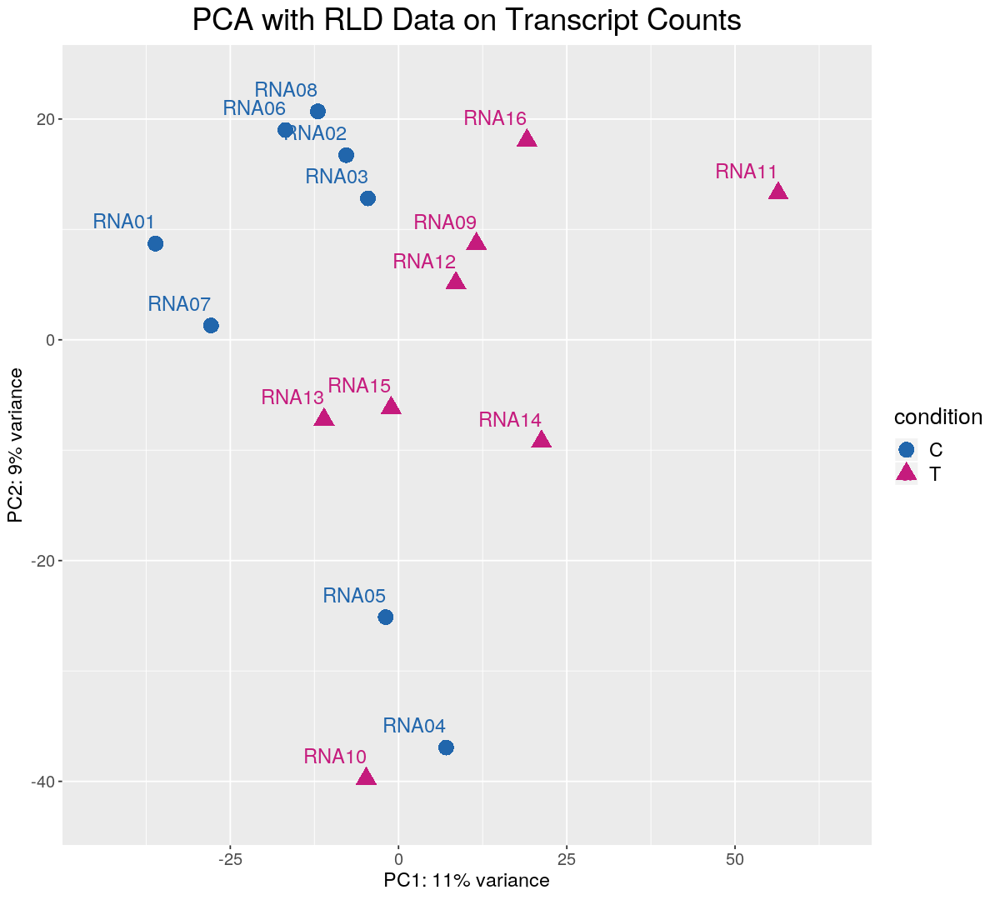

In [44]:
# RLOG PCA
pcaData <- DESeq2::plotPCA(rld_se, 
                           intgroup = c( "names", "condition"), 
                           returnData = TRUE)
percentVar <- round(100 * attr(pcaData, "percentVar"))
options(repr.plot.width=10, repr.plot.height=9)
ggplot(pcaData, aes(x = PC1, y = PC2, color=condition, shape=condition)) +
geom_point(size =5) +
geom_text(aes(label=name),hjust=1, vjust=-1, cex=5) +
xlab(paste0("PC1: ", percentVar[1], "% variance")) +
ylab(paste0("PC2: ", percentVar[2], "% variance")) +
scale_x_continuous(expand = c(0.15, 0)) + 
scale_y_continuous(expand = c(0.1, 0)) + 
ggtitle("PCA with RLD Data on Transcript Counts") + 
theme(plot.title = element_text(hjust = 0.5, size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      legend.text=element_text(size=14),
      legend.title=element_text(size=16),
      legend.position="right") + 
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]))
ggsave("DESEQ2_RES/DESEQ2_salmon_TXIMETA_PCA_RLD_transcripts.png", width=10, height=9)

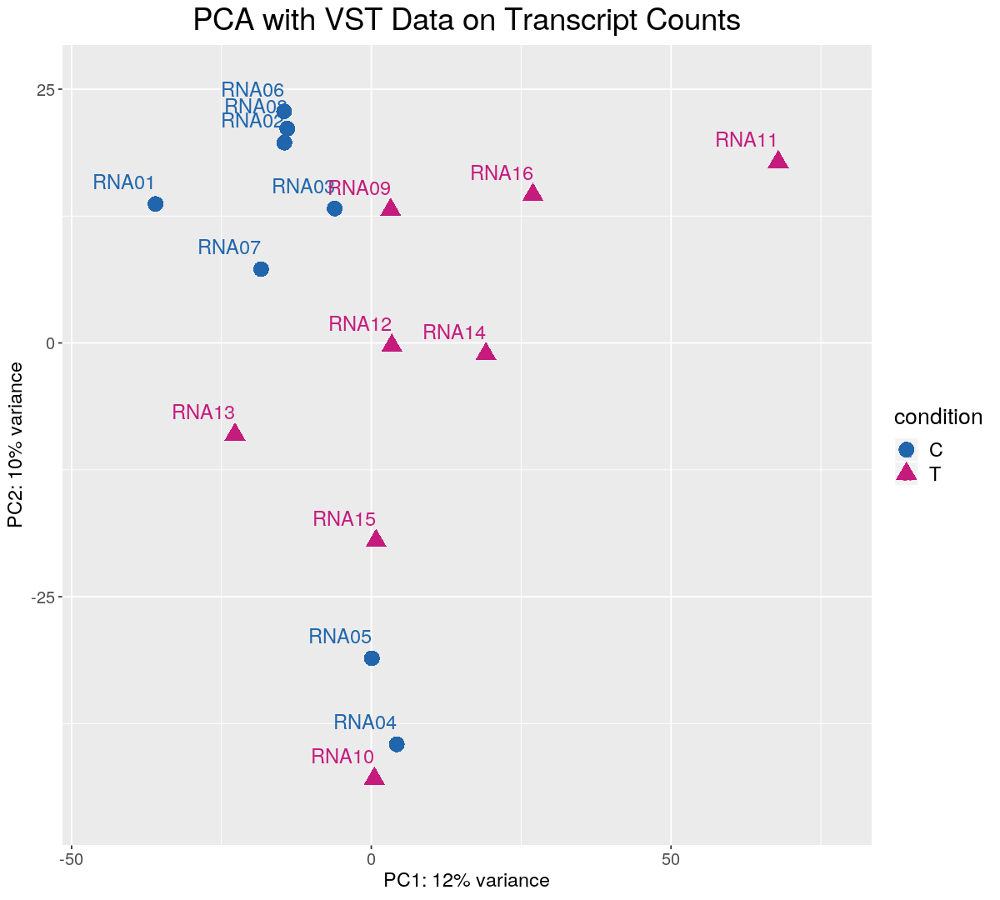

In [45]:
# VST PCA
pcaData <- DESeq2::plotPCA(vsd_se, 
                           intgroup = c( "names", "condition"), 
                           returnData = TRUE)
percentVar <- round(100 * attr(pcaData, "percentVar"))
options(repr.plot.width=10, 
        repr.plot.height=9)
ggplot(pcaData, aes(x = PC1, 
                    y = PC2, 
                    color=condition, 
                    shape=condition)) +
geom_point(size =5) +
geom_text(aes(label=name), 
          hjust=1, 
          vjust=-1, 
          cex=5) +
xlab(paste0("PC1: ", 
            percentVar[1], 
            "% variance")) +
ylab(paste0("PC2: ", 
            percentVar[2], 
            "% variance")) +
scale_x_continuous(expand = c(0.15, 0)) + 
scale_y_continuous(expand = c(0.1, 0)) + 
ggtitle("PCA with VST Data on Transcript Counts") + 
theme(plot.title = element_text(hjust = 0.5, 
                                size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      legend.text=element_text(size=14),
      legend.title=element_text(size=16),
      legend.position="right") + 
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], 
                               brewer.pal(8, "PiYG")[1]))
ggsave("DESEQ2_RES/DESEQ2_salmon_TXIMETA_PCA_VST_transcripts.png", 
       width=10, 
       height=9)

### Top DE transcripts 

In [46]:
# subset of the 20 most highly variable genes from VST data
# topVarTx <- head(which(res_se$padj < 0.05),decreasing = FALSE, 20)
topVarTx <- head(order(rowVars(assay(vsd_se)), decreasing = FALSE), 20)
mat  <- assay(vsd_se)[topVarTx,]
#mat  <- mat - rowMeans(mat)
mat

,RNA01,RNA02,RNA03,RNA04,RNA05,RNA06,RNA07,RNA08,RNA09,RNA10,RNA11,RNA12,RNA13,RNA14,RNA15,RNA16
UBQLN2-201,9.300896,9.302400,9.135586,9.132797,9.113036,9.237953,9.220113,9.167161,9.284487,9.261233,9.218468,9.125501,9.357153,9.133127,9.125623,9.024864
ZNF808-201,8.988805,8.842279,8.961952,9.028066,8.838900,8.838328,8.679709,8.980686,8.879736,8.753390,8.952258,8.958773,8.895553,8.955792,8.965684,9.021209
EXOSC2-205,9.367999,9.457704,9.348610,9.452403,9.445977,9.528188,9.633099,9.397276,9.472322,9.571234,9.558410,9.667425,9.630687,9.472419,9.455285,9.290763
ZNF674-207,6.238097,6.208338,6.120580,6.271890,6.200464,6.354411,6.119652,6.382332,6.049556,6.202188,6.393553,6.222678,6.396536,6.061156,6.206115,6.184404
EXOSC6-201,10.821463,10.718114,10.676280,10.857363,10.703814,10.606520,10.907131,10.614615,10.675297,10.789281,10.859613,10.801335,10.556557,10.795576,10.634416,10.536729
LINC00294-201,9.036730,8.896894,9.054175,9.111596,9.016890,8.929309,9.104354,9.181428,8.979490,9.285332,9.204375,9.107614,8.925300,8.878267,9.047869,9.078597
DNTTIP2-202,10.591315,10.543543,10.516274,10.690820,10.422041,10.645128,10.443382,10.858755,10.732242,10.640572,10.716346,10.742113,10.462310,10.602351,10.703055,10.615182
ROCK1-201,10.852589,11.059150,11.088412,10.873195,10.792832,10.833191,11.060223,10.900749,10.869206,10.821965,10.994031,11.149863,11.099069,11.134434,10.884140,10.922906
UBR2-202,11.159017,11.168920,11.214920,11.148715,10.941512,10.865506,11.038679,10.977157,10.807852,11.039751,10.956686,10.949269,10.946417,10.818904,11.014677,11.105687
DGKE-203,4.936917,5.032448,5.061141,4.711092,4.999502,4.982205,5.040482,4.821975,5.050200,5.038810,4.895239,5.136302,5.105612,4.886200,4.724137,5.043996


In [55]:
df <- as.data.frame(colData(ddsSE)['condition'])

In [ ]:
options(repr.plot.width=11, repr.plot.height=10)
pm = pheatmap(mat, 
              main="Top 20 DE transcripts: VST-transformed values across samples",
              cluster_rows=FALSE,
              cluster_cols=FALSE,
              annotation_col=df)
#save_pheatmap_png(pm, "DESEQ2_RES/DESEQ2_salmon_TXIMETA_heatmap_topDEtx_VST.png")

In [125]:
# check the real variations at raw count level
topVarTx <- head(which(res_se$padj < 0.05),decreasing = FALSE, 20)
# topVarTx <- head(order(rowVars(assay(vsd_se)), decreasing = FALSE), 20)
counts(ddsSE[topVarTx])

,RNA01,RNA02,RNA03,RNA04,RNA05,RNA06,RNA07,RNA08,RNA09,RNA10,RNA11,RNA12,RNA13,RNA14,RNA15,RNA16
OTUD7B-202,74,56,47,85,77,58,79,101,192,119,102,169,158,105,149,71
CEP170-215,73,48,49,110,62,67,94,67,46,35,22,35,11,15,28,27
ANKRD36BP2-207,28,36,18,39,18,25,57,661,3071,22,151,15,14,19,1803,22
IGKV1D-39-201,2,137,0,4,4,5,0,181,15,11,0,21478,2,22918,16832,3
LRRFIP1P1-201,59,75,70,107,99,44,31,96,298,258,54,292,429,118,189,97
ZNF876P-201,44,52,46,49,29,98,437,250,8,23,7,13,27,20,31,18
ZNF141-202,83,55,58,62,53,63,205,42,47,28,10,35,29,39,33,21
TMEM173-201,0,0,6,0,2,4,0,0,18,13,50,9,62,18,3,27
ADAM28-210,1202,886,812,1165,610,1057,2660,673,366,433,159,490,443,644,688,260
PNMA2-204,168,156,136,115,179,192,233,88,1749,134,828,736,330,189,788,273


## DTE: Differential Transcript Expression

In [126]:
# Genes with adjusted p-values less than 0.1
# padj: Benjamini-Hochberg (BH) adjustment
# if we consider a fraction of 10% false positives acceptable
# we can consider all genes with an adjusted p value below 10% (= 0.1) as significant
table(res_se$padj < 0.5)


FALSE  TRUE 
57767   236 

In [127]:
# subset the results table to these genes and then sort it by the log2 fold change estimate 
resSig <- subset(res_se, padj < 0.5)

In [128]:
# top DE genes
rownames(head(resSig[ order(resSig$pvalue), decreasing = FALSE]))

[1] "HGSNAT-204" "GNAZ-203"   "TSHZ2-202"  "IGHG4-201"  "PNMA2-204" 
[6] "HGSNAT-205"

In [129]:
# most strongly up-regulated in C group
rownames(head(resSig[ order(resSig$log2FoldChange), ]))

[1] "TSHZ2-202"    "DNAH10-201"   "TAZ-215"      "JAML-202"     "IGLV1-47-201"
[6] "SPNS1-203"

In [130]:
# most strongly up-regulated in T group
rownames(head(resSig[ order(resSig$log2FoldChange, decreasing = TRUE), ]))

[1] "IGKV1D-39-201" "IGHG4-201"     "TRPM4-204"     "NEDD1-202"    
[5] "TRPM4-208"     "TMEM173-201"

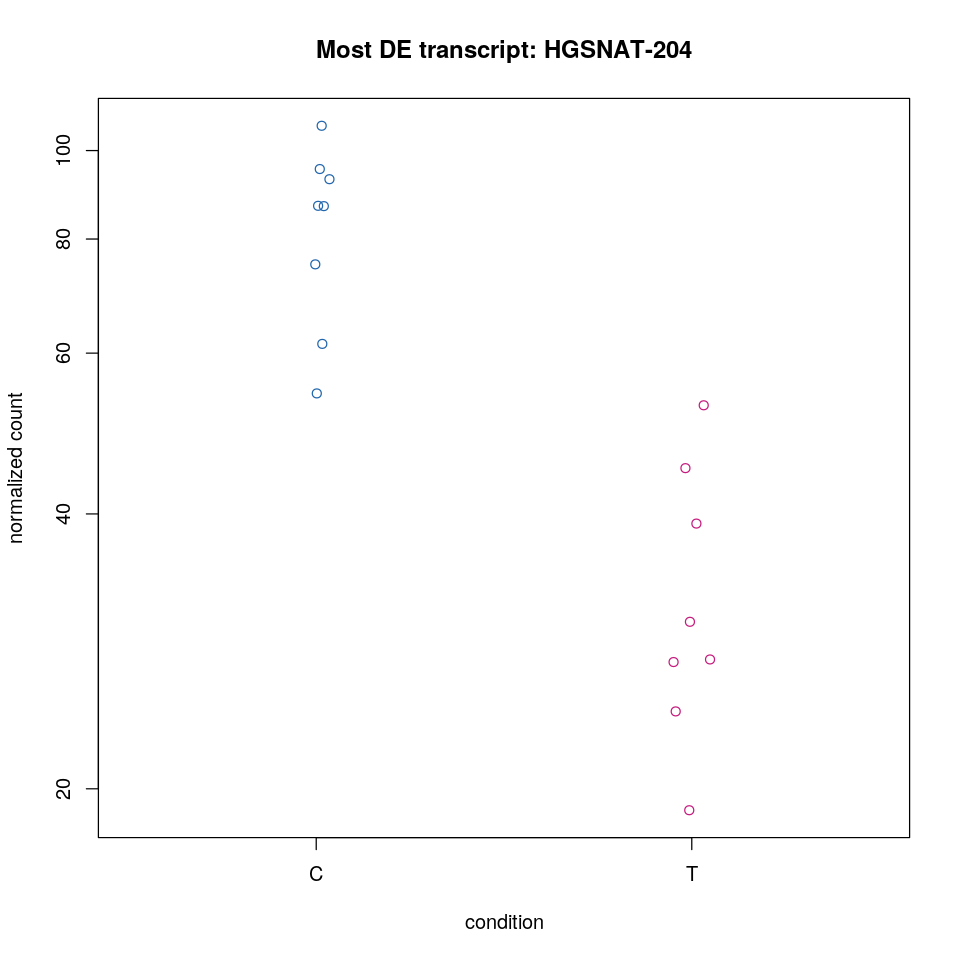

In [131]:
# retrieve the gene that has the lowest adjusted p value (= max differential expression)
# examine the counts of reads for this gene across the groups
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
options(repr.plot.width=8, repr.plot.height=8)
topGene <- rownames(ddsSE)[which.min(res_se$padj)]
plotCounts(ddsSE, 
           gene = topGene, 
           intgroup=c("condition"), 
           col=col,
           main=paste0("Most DE transcript: ", topGene),
           xlab="condition")
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_topDEtx_counts_TvsC.png", width=480, height=480))

In [132]:
# check raw counts of most DE tx
counts(ddsSE[which(rownames(ddsSE)==topGene)])

,RNA01,RNA02,RNA03,RNA04,RNA05,RNA06,RNA07,RNA08,RNA09,RNA10,RNA11,RNA12,RNA13,RNA14,RNA15,RNA16
HGSNAT-204,71,80,103,113,92,90,159,47,48,34,23,53,24,30,26,14


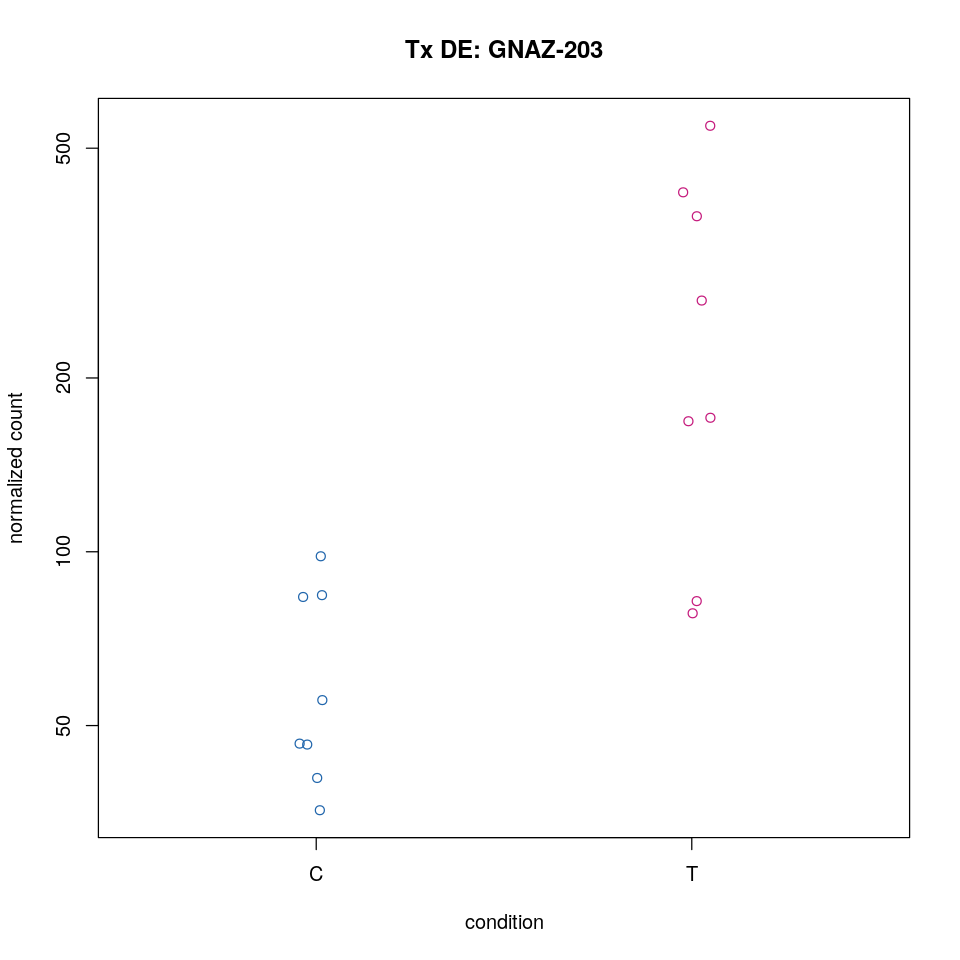

In [134]:
# examine the counts of reads for TP53 across the groups
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
options(repr.plot.width=8, repr.plot.height=8)
plotCounts(ddsSE, 
           gene = "GNAZ-203", 
           intgroup=c("condition"), 
           col=col,
           main=paste0("Tx DE: ", "GNAZ-203"),
           xlab="condition")
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_GNAZ-203_counts_CvsT.png", width=480, height=480))

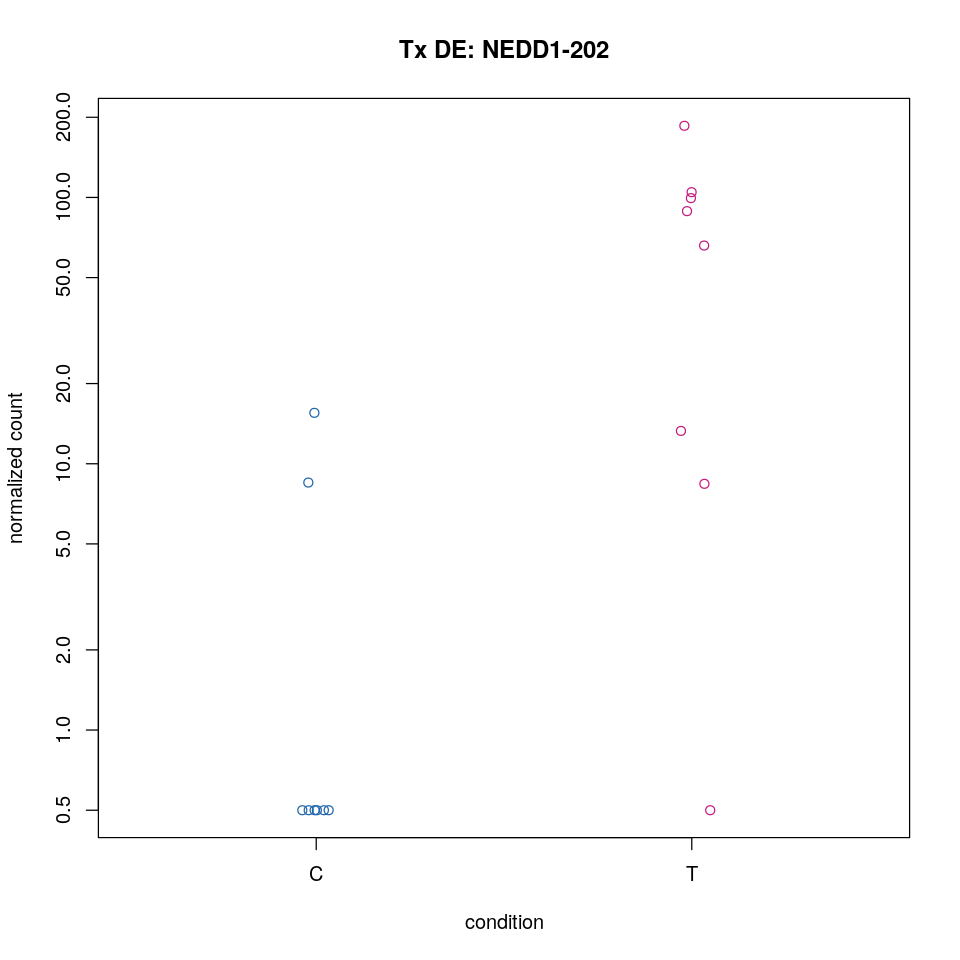

In [135]:
# examine the counts of reads for FLT3 across the groups
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
options(repr.plot.width=8, repr.plot.height=8)
plotCounts(ddsSE, 
           gene = "NEDD1-202", 
           intgroup=c("condition"), 
           col=col,
           main=paste0("Tx DE: ", "NEDD1-202"),
           xlab="condition")
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_NEDD1-2029_counts_TvsC.png", width=480, height=480))

## Plot fold change in genomic space

In [136]:
head(rownames(ddsSE))

[1] "WASH7P-201"     "AL627309.1-201" "AL627309.1-203" "AL627309.5-201"
[5] "AL627309.5-203" "AL627309.5-205"

In [137]:
# differential expression results with GRanges data using APEGLM shrinkage
resGR <- lfcShrink(ddsSE, coef="condition_T_vs_C", type="apeglm", format="GRanges")

using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



In [138]:
# add tx_id, tx_name, gene_id and gene_name columns, and reorder columns
resGR$tx_id = mcols(ddsSE)$tx_id
resGR$tx_name = mcols(ddsSE)$tx_name
resGR$gene_id = mcols(ddsSE)$gene_id
resGR$gene_name = mcols(ddsSE)$gene_name
    col_order <- c('tx_id', 'tx_name', 'gene_id', 'gene_name', 'baseMean', 'log2FoldChange', 'lfcSE', 'pvalue', 'padj')
invisible(resGR <- resGR[, col_order])
colnames(mcols(resGR))

[1] "tx_id"          "tx_name"        "gene_id"        "gene_name"     
[5] "baseMean"       "log2FoldChange" "lfcSE"          "pvalue"        
[9] "padj"

In [148]:
# retreive transcripts with lowest p-value (accession number)
topTx <- resGR$tx_name[which.min(resGR$padj)]
topTx

[1] "HGSNAT-204"

In [150]:
# 1) specifies a window of 1 million base pairs upstream and downstream 
# from the gene with the smallest p value
# 2) subset dataset with genes within this window
# 3) add the gene symbol as a name if exists
window <- resGR[topTx] + 1e6
strand(window) <- "*"
resGRsub <- resGR[resGR %over% window]
naOrDup <- is.na(resGRsub$tx_name) | duplicated(resGRsub$tx_name)
resGRsub$group <- ifelse(naOrDup, names(resGRsub), resGRsub$tx_name)
status <- factor(ifelse(resGRsub$padj < 0.1 & !is.na(resGRsub$padj), "sig", "notsig"))

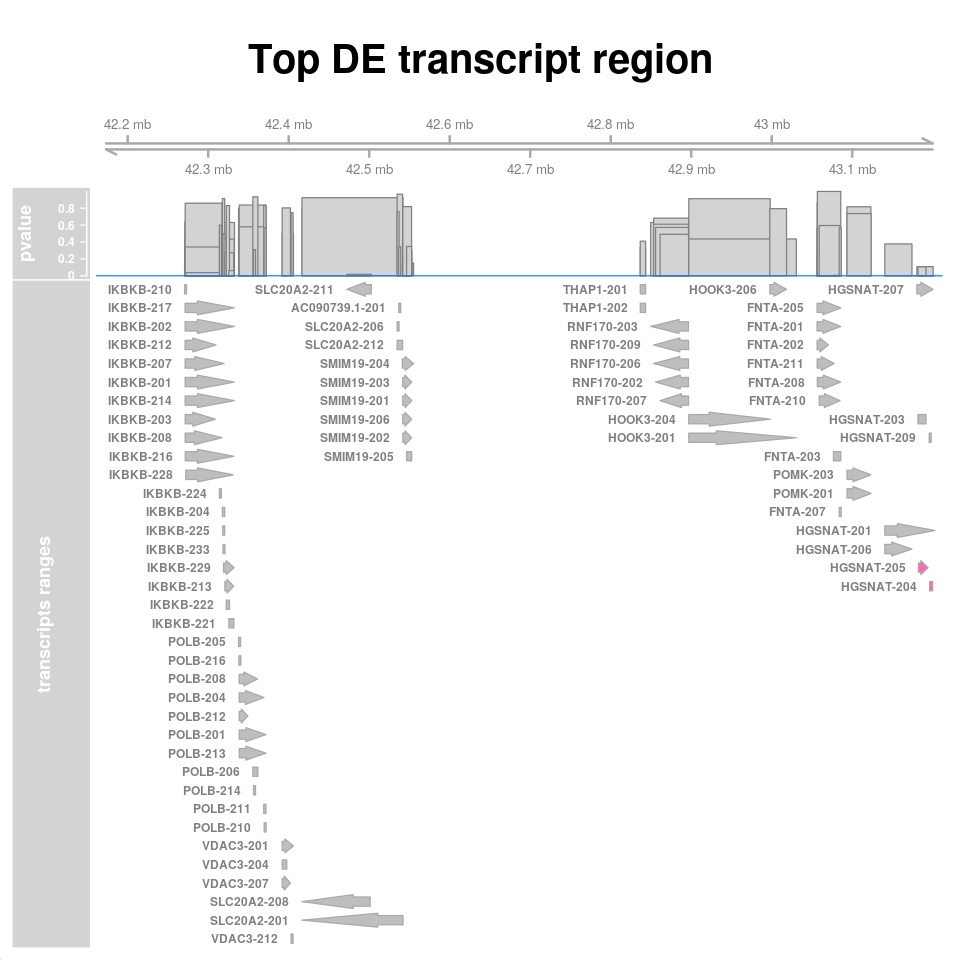

In [151]:
# log2 fold changes in genomic region surrounding the gene with smallest adjusted p value
# Genes highlighted in pink have adjusted p value less than 0.1
options(ucscChromosomeNames = FALSE)
g <- GenomeAxisTrack()
a <- AnnotationTrack(resGRsub, 
                     name = "transcripts ranges", 
                     feature = status)
d <- DataTrack(resGRsub, 
               data = "pvalue", 
               baseline = 0, 
               type = "histogram", 
               name = "pvalue", 
               strand = "+")
res <- plotTracks(list(g, d, a), 
           groupAnnotation = "group", 
           notsig = "grey", 
           sig = "hotpink", 
           # main="Genomic region around top DE transcript",
           #extend.left=250000, 
           #extend.right=100000, 
           main="Top DE transcript region", 
           col.main="black")
invisible(dev.print(png, 
                    "DESEQ2_RES/DESEQ2_salmon_TXIMETA_GRanges_topTx_region.png", 
                    width=920, 
                    height=780))

# B) DTU: Differential Transcript Usage

### B-1) Import Data

In [138]:
salmon_samples <- read.table(file.path("SALMON_IN", "salmon_samples.txt"), 
                             header = FALSE)
files <- file.path("SALMON_IN", 
                   paste0(salmon_samples$V1, 
                          "/",  
                          "quant.sf"))
condition = factor(rep(c('C','T'), each = 8))
samples <- data.frame(row.names=as.vector(salmon_samples$V1), 
                      condition=condition)
samples$sample_id <- rownames(samples)
samples

,condition,sample_id
,<fct>,<chr>
RNA01,C,RNA01
RNA02,C,RNA02
RNA03,C,RNA03
RNA04,C,RNA04
RNA05,C,RNA05
RNA06,C,RNA06
RNA07,C,RNA07
RNA08,C,RNA08
RNA09,T,RNA09


In [139]:
# create database of transcripts from gtf
gtf_file = "REF/gencode.v32.annotation.gtf"
suppressMessages(txdb <- makeTxDbFromGFF(file=gtf_file))

In [140]:
# Transcript-to-gene mapping
# this input requires to leave the dots in IDs - don't process to remove them
k <- keys(txdb, keytype = "TXNAME")
tx2gene <- AnnotationDbi::select(txdb, 
                                 keys = k, 
                                 keytype = "TXNAME", 
                                 columns = "GENEID")
# rename columns
colnames(tx2gene) <- c('TX_NAME', 'GENE_ID')
head(tx2gene)

'select()' returned 1:1 mapping between keys and columns



TX_NAME,GENE_ID
<chr>,<chr>
ENST00000456328.2,ENSG00000223972.5
ENST00000450305.2,ENSG00000223972.5
ENST00000473358.1,ENSG00000243485.5
ENST00000469289.1,ENSG00000243485.5
ENST00000607096.1,ENSG00000284332.1
ENST00000606857.1,ENSG00000268020.3


In [141]:
# import transcript-level counts
# --> use scaledTPM for testing DTU using DRIMSeq and DEXSeq
# --> count-scale data do not scale with transcript length within a gene
txiDTU = tximport::tximport(files,
                         type = "salmon",
                         txOut = TRUE, 
                         countsFromAbundance = "dtuScaledTPM",
                         tx2gene = tx2gene)

reading in files with read_tsv

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 




In [142]:
cols = c('0286', '1567', '0842', '1208',
           '0271', '1215', '1152', '0462',
           '0384', '0627', '0871', '0414',
           '0820', '0208', '1335', '1727')

In [143]:
# Rename columns with sample names
colnames(txiDTU$counts) <- cols
colnames(txiDTU$abundance) <- cols
colnames(txiDTU$length) <- cols

In [162]:
# Rename columns with sample names
colnames(txiDTU$counts) = as.vector(salmon_samples$V1)
colnames(txiDTU$abundance) = as.vector(salmon_samples$V1)
colnames(txiDTU$length) = as.vector(salmon_samples$V1)

In [163]:
length(rownames(txiDTU$counts))

[1] 226608

In [164]:
# extract counts matrix, prefilter
# count-scale data, generated from abundance using scaledTPM
cts <- txiDTU$counts
#cts <- cts[rowSums(cts) > 16,]
keep <- rowSums(cts >= 5) >= 8
cts <- cts[keep,]
length(rownames(cts))

[1] 70781

In [165]:
length(rownames(cts))

[1] 70781

In [166]:
# between x and y million paired-end reads were mapped to the transcriptome
range(colSums(cts)/1e6)

[1] 17.88979 29.76963

In [167]:
tx_list <- rownames(cts)

In [155]:
# create a dataframe from both lists and export for Python processing with Pyensembl
tx_df = data.frame("TX_ID" = tx_list, stringsAsFactors = FALSE)
write.table(tx_df, 
            file = "SALMON_TEMP/TXIMPORT_salmon_txID_dtu.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [156]:
# back from Python
# structurue: ['GENE_ID', 'GENE_NAME']
tx_df <- read.table(file="SALMON_TEMP/TXIMPORT_salmon_txID_dtu_OK.txt", 
                        sep="\t", 
                        header=T, 
                        stringsAsFactors=F)

In [168]:
head(tx_df)

TX_ID,TX_NAME,GENE_NAME,GENE_ID
<chr>,<chr>,<chr>,<chr>
ENST00000488147.1,WASH7P-201,WASH7P,ENSG00000227232
ENST00000466430.5,AL627309.1-201,AL627309.1,ENSG00000238009
ENST00000471248.1,AL627309.1-203,AL627309.1,ENSG00000238009
ENST00000484859.1,AL627309.5-201,AL627309.5,ENSG00000241860
ENST00000466557.6,AL627309.5-203,AL627309.5,ENSG00000241860
ENST00000662089.1,AL627309.5-205,AL627309.5,ENSG00000241860


In [170]:
# create counts dtaframe using cts; with either GENE_ID or GENE_NAME as gene_id
counts <- data.frame(gene_id=tx_df$GENE_NAME,
                     feature_id=tx_df$TX_NAME,
                     cts)

In [171]:
head(counts)

,gene_id,feature_id,RNA01,RNA02,RNA03,RNA04,RNA05,RNA06,RNA07,RNA08,RNA09,RNA10,RNA11,RNA12,RNA13,RNA14,RNA15,RNA16
,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENST00000488147.1,WASH7P,WASH7P-201,534.92261,379.659632,367.176063,384.52072,487.29607,465.27135,944.89624,417.92474,629.51157,668.191640,236.095469,263.971589,286.857528,581.876593,420.70179,90.512135
ENST00000466430.5,AL627309.1,AL627309.1-201,12.67169,10.367753,8.621597,10.96084,11.24290,12.35410,18.50424,13.20857,9.42773,14.703177,6.108669,7.457247,6.581935,18.824279,14.48938,7.605243
ENST00000471248.1,AL627309.1,AL627309.1-203,15.72169,7.237251,4.355516,12.78555,10.18972,23.29666,17.97087,10.23744,11.66807,13.635670,4.674739,2.076448,6.725678,8.164449,16.54854,4.025195
ENST00000484859.1,AL627309.5,AL627309.5-201,241.18185,193.386120,148.595858,187.21958,213.35488,254.90708,333.19772,234.98605,165.54466,207.334047,82.945556,215.229716,183.930461,168.848798,195.21572,140.938931
ENST00000466557.6,AL627309.5,AL627309.5-203,40.23144,54.555610,21.192337,12.05165,35.27402,23.46959,47.62697,48.77096,34.42437,7.521909,43.646407,24.821676,111.495901,24.264661,16.30415,0.000000
ENST00000662089.1,AL627309.5,AL627309.5-205,27.97836,15.812067,8.106733,28.00572,14.53491,39.09449,55.84224,13.76753,38.94098,37.327076,5.361044,15.969016,32.939044,42.871338,17.35946,1.862810


In [191]:
# create dmDSdata object from counts
dms <- dmDSdata(counts=counts, samples=samples)
dms

An object of class dmDSdata 
with 18578 genes and 16 samples
* data accessors: counts(), samples()

In [192]:
# pulling out the first row corresponds to all transcripts of first gene
counts(dms[1,])[,1:16]

gene_id,feature_id,RNA01,RNA02,RNA03,RNA04,RNA05,RNA06,RNA07,RNA08,RNA09,RNA10,RNA11,RNA12,RNA13,RNA14
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
7SK,7SK.1-201,4850.77,8936.158,2666.081,3149.224,2828.549,2739.167,2892.934,1162.697,2122.971,2687.556,3448.917,1103.971,7554.722,3168.231


In [173]:
# filter
# n = total samples size
# n.small = smallest samples size group
# min_samps_feature_expr = min reads in at least x samples (n_group)
# min_samps_feature_prop = relative abundance proportion in at least x samples
# min_samps_gene_expr/min_gene_expr = total count of the corresponding gene is at least x in all n samples
n <- 16
n_group <- 8
dms <- dmFilter(dms,
              min_samps_feature_expr=n_group, min_feature_expr=5,
              min_samps_feature_prop=n_group, min_feature_prop=0.1,
              min_samps_gene_expr=n_group, min_gene_expr=5)
dms

An object of class dmDSdata 
with 9864 genes and 16 samples
* data accessors: counts(), samples()

In [193]:
# how many of the remaining genes have N isoforms
table(table(counts(dms)$gene_id))


   1    2    3    4    5    6    7    8    9   10   11   12   13   14   15   16 
7735 2041 1602 1386 1202 1031  828  652  517  409  285  219  169  129   87   65 
  17   18   19   20   21   22   23   24   25   26   27   28   29   31   32   34 
  57   47   25   16   18   13    7    7    4    7    3    1    4    3    2    1 
  35   37   40   42   44   53 
   1    1    1    1    1    1 

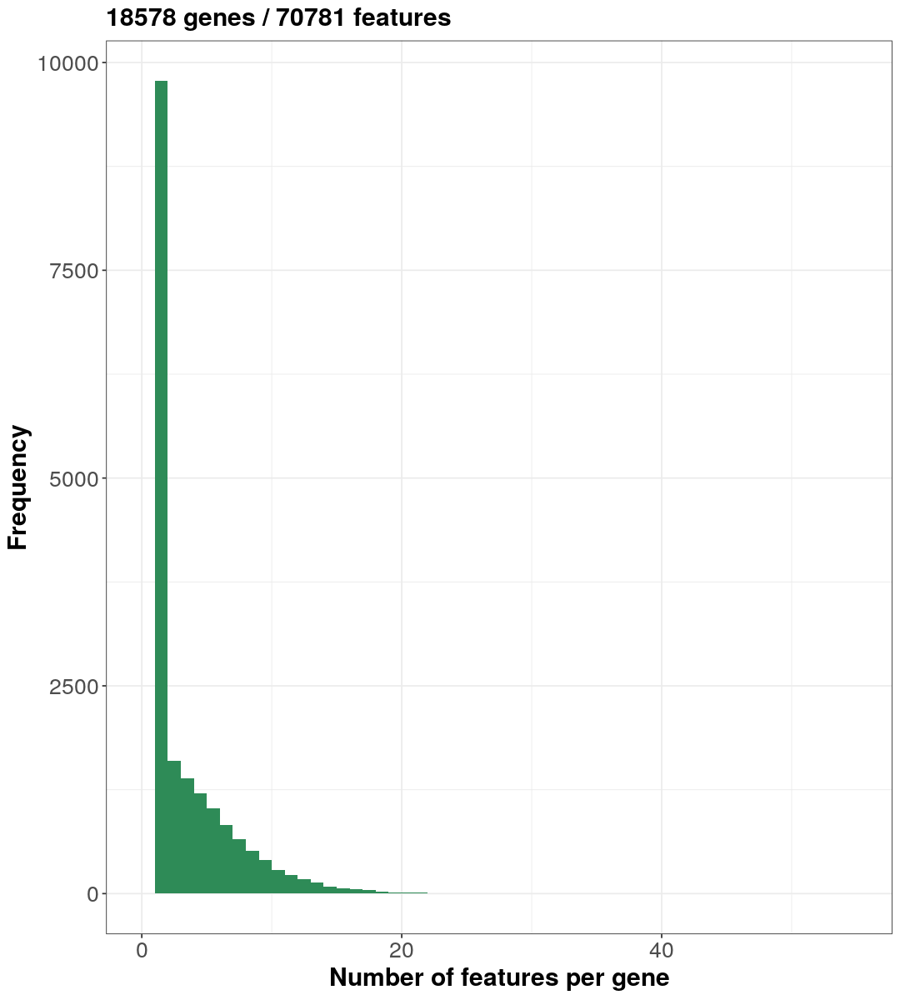

In [194]:
options(repr.plot.width=9, repr.plot.height=10)
plotData(dms)
invisible(dev.print(png, 
                    "DESEQ2_RES/DRIMSEQ_salmon_feats_per_genes.png", 
                    width=480, 
                    height=480))

### B-2) Statistical analysis of differential transcript usage

In [195]:
condition = factor(rep(c('C','T'), each = 8))
design <- model.matrix(~0+condition)
colnames(design) <- c('C','T')
contrast <- makeContrasts(T-C, levels = design)

In [196]:
# 1) estimate precision (~15min)
# --> Dirichlet Multinomial model
# --> dispersion = 1 / (1 + precision)
# dispersion = counts are more variable around their expected value
dms <- dmPrecision(dms, 
                   design=design, 
                   BPPARAM = BiocParallel::MulticoreParam())

! Using a subset of 0.1 genes to estimate common precision !


! Using common_precision = 24.8075 as prec_init !


! Using 1.120078 as a shrinkage factor !




In [197]:
# 2) fit regression coefficients 
dmf <- dmFit(dms, 
             design=design, 
             BPPARAM = BiocParallel::MulticoreParam())

In [198]:
# 3) perform null hypothesis testing on the coefficient of interest (contrast)
dmt <- dmTest(dmf, 
              #coef=2,
              contrast = contrast, 
              BPPARAM = BiocParallel::MulticoreParam())

In [199]:
dmt

An object of class dmDStest 
with 18578 genes and 16 samples
* data accessors: counts(), samples()
  design()
  mean_expression(), common_precision(), genewise_precision()
  proportions(), coefficients()
  results()

In [200]:
# results for single p-value per gene
# tests whether there is any differential transcript usage within the gene
res_drim <- DRIMSeq::results(dmt)
head(res_drim)

gene_id,lr,df,pvalue,adj_pvalue
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
7SK,NA,0,NA,NA
A1BG,0.0159767,1,0.8994161,0.9999840
A1BG-AS1,6.9545770,4,0.1383082,0.6705102
A2M-AS1,NA,0,NA,NA
A4GALT,NA,0,NA,NA
AAAS,8.4959975,9,0.4850343,0.9954964


In [201]:
# results single p-value per transcript
# tests whether the proportions for this transcript changed within the gene
res_txp <- DRIMSeq::results(dmt, level="feature")
head(res_txp)

gene_id,feature_id,lr,df,pvalue,adj_pvalue
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
7SK,7SK.1-201,NA,1,NA,NA
A1BG,A1BG-203,0.0159767,1,0.8994161,1.0000000
A1BG,A1BG-204,0.0159767,1,0.8994161,1.0000000
A1BG-AS1,A1BG-AS1-209,0.4943632,1,0.4819874,1.0000000
A1BG-AS1,A1BG-AS1-203,2.3184347,1,0.1278486,0.9609471
A1BG-AS1,A1BG-AS1-202,4.8552139,1,0.0275627,0.5559287


In [203]:
# turn any N/A into 1
no_na <- function(x) ifelse(is.na(x), 1, x)
res_drim$pvalue <- no_na(res_drim$pvalue)
res_txp$pvalue <- no_na(res_txp$pvalue)

#### Plot the estimated proportions

In [204]:
# select the most significant gene
idx <- which.min(res_drim$adj_pvalue < 0.05)
gname <- res_drim[idx,]$gene_id
res_drim[idx,]

,gene_id,lr,df,pvalue,adj_pvalue
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
2,A1BG,0.0159767,1,0.8994161,0.999984


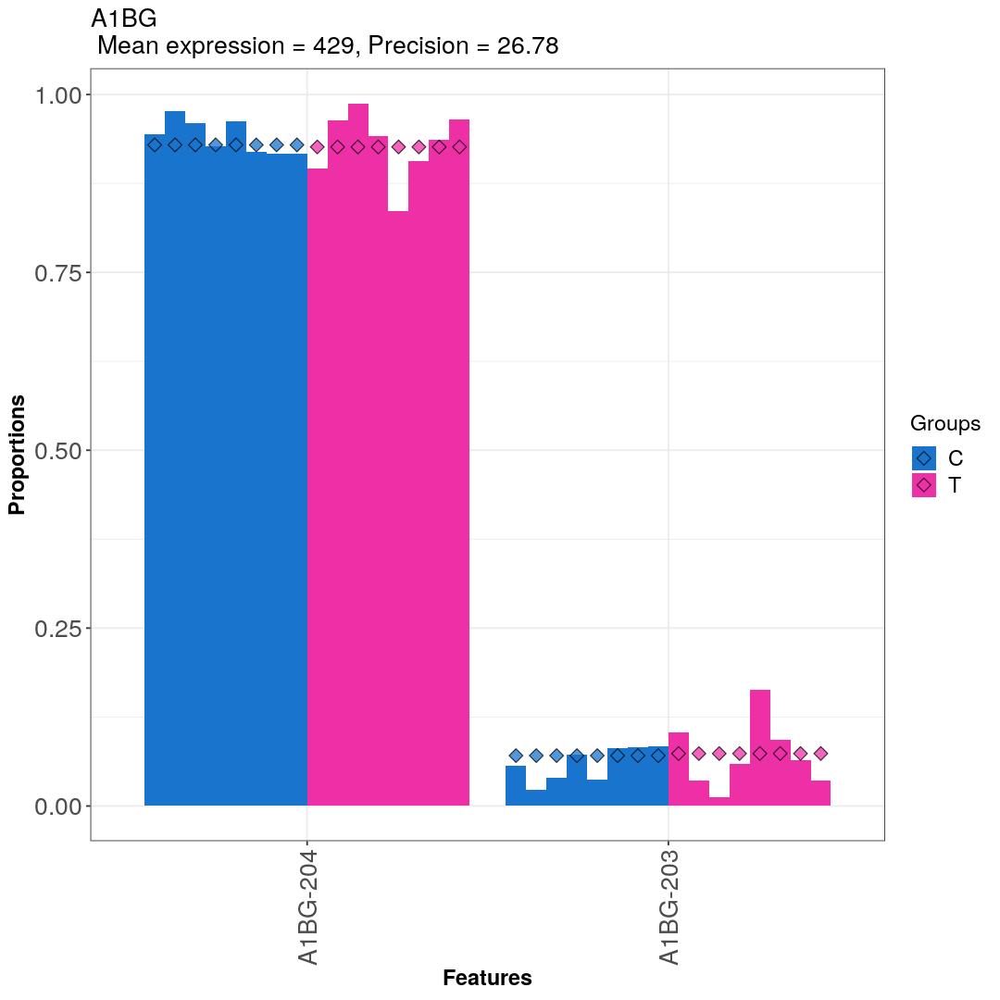

In [205]:
options(repr.plot.width=9, repr.plot.height=9)
plotProportions(dmt, res_drim$gene_id[idx], "condition")
invisible(dev.print(png, 
                    "DESEQ2_RES/DRIMSEQ_salmon_transcript_proportions_mostDEgene.png", 
                    width=480, 
                    height=480))

In [206]:
# subset most significant genes and order results by p-values
res_drim_sub <- subset(res_drim, adj_pvalue < 0.05)
res_drim_sub <- res_drim_sub[ order(res_drim_sub$adj_pvalue, decreasing = FALSE), ]

In [208]:
head(res_drim_sub, 50)

,gene_id,lr,df,pvalue,adj_pvalue
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
16077,TAF5L,83.94413,4,0.00000000000000002540686,0.0000000000002754104
8482,GMEB1,76.69696,3,0.00000000000000015680233,0.0000000000008498686
16957,TRPM4,69.91226,2,0.00000000000000065878908,0.0000000000023804245
15521,SNORD3B-1,60.37625,1,0.00000000000000783525305,0.0000000000212335358
11095,MFSD5,57.36709,1,0.00000000000003616084266,0.0000000000783967069
15691,SPN,64.01691,3,0.00000000000008139970879,0.0000000001470621406
16894,TRIM32,54.43092,2,0.00000000000151522308680,0.0000000023464311801
13478,PSPC1,64.86940,6,0.00000000000458714220018,0.0000000062155776812
6646,CSNK2A1,105.24272,28,0.00000000007039253504886,0.0000000847838977700


In [209]:
'GNAZ' %in% res_drim$gene_id

[1] TRUE

In [230]:
# for any other gene of interest
options(repr.plot.width=9, repr.plot.height=9)
plotProportions(dmt, 'FHL1', "condition")
invisible(dev.print(png, 
                    "DESEQ2_RES/DRIMSEQ_salmon_transcript_proportions_FHL1.png", 
                    width=480, 
                    height=480))

ERROR: Error in .local(x, ...): gene_id %in% names(x@counts) is not TRUE


## DEXSeq

In [41]:
dmt

An object of class dmDStest 
with 9864 genes and 16 samples
* data accessors: counts(), samples()
  design()
  mean_expression(), common_precision(), genewise_precision()
  proportions(), coefficients()
  results()

In [42]:
# create DEXSeqDataSet from dmDStest
sample_data <- DRIMSeq::samples(dmt)
count_data <- round(as.matrix(counts(dmt)[,-c(1:2)]))
dxd <- DEXSeqDataSet(countData=count_data,
                     sampleData=sample_data,
                     design=~sample + exon + condition:exon,
                     featureID=counts(dmt)$feature_id,
                     groupID=counts(dmt)$gene_id)

converting counts to integer mode



In [43]:
dxd

class: DEXSeqDataSet 
dim: 29919 32 
metadata(1): version
assays(1): counts
rownames(29919): A1BG-AS1:A1BG-AS1-209 A1BG-AS1:A1BG-AS1-203 ...
  ZZEF1:ZZEF1-205 ZZEF1:ZZEF1-210
rowData names(4): featureID groupID exonBaseMean exonBaseVar
colnames: NULL
colData names(4): sample condition sample_id exon

In [44]:
# run DEXSeq analysis ~ 10min
dxd <- DEXSeq::estimateSizeFactors(dxd)
dxd <- DEXSeq::estimateDispersions(dxd, quiet=TRUE)
dxd <- DEXSeq::testForDEU(dxd, reducedModel=~sample + exon)

In [45]:
# 1) extract results
# 2) compute a per-gene adjusted p-value
# 3) build a simple results table with the per-gene adjusted p-values
dxr <- DEXSeqResults(dxd, 
                     independentFiltering=FALSE)
qval <- perGeneQValue(dxr)
dxr_g <- data.frame(gene=names(qval),qval)

In [177]:
head(dxr_g)

,gene,qval
,<fct>,<dbl>
A1BG-AS1,A1BG-AS1,1
AAAS,AAAS,1
AACS,AACS,1
AAGAB,AAGAB,1
AAK1,AAK1,1
AAMDC,AAMDC,1


In [47]:
# reduce the transcript-level results table to a dataframe
columns <- c("featureID", "groupID", "pvalue")
dxr <- as.data.frame(dxr[,columns])
head(dxr)

,featureID,groupID,pvalue
,<chr>,<chr>,<dbl>
A1BG-AS1:A1BG-AS1-209,A1BG-AS1-209,A1BG-AS1,0.2854963
A1BG-AS1:A1BG-AS1-203,A1BG-AS1-203,A1BG-AS1,0.3022490
A1BG-AS1:A1BG-AS1-202,A1BG-AS1-202,A1BG-AS1,0.1513238
A1BG-AS1:A1BG-AS1-204,A1BG-AS1-204,A1BG-AS1,0.5439811
A1BG-AS1:A1BG-AS1-208,A1BG-AS1-208,A1BG-AS1,0.7839460
AAAS:AAAS-201,AAAS-201,AAAS,0.4585674


In [48]:
head(dxr_g$gene)

[1] A1BG-AS1 AAAS     AACS     AAGAB    AAK1     AAMDC   
9864 Levels: A1BG-AS1 AAAS AACS AAGAB AAK1 AAMDC AAMP AAR2 AARS AARS2 ... ZZEF1

In [244]:
## this step is doable after import and DESeq2 processing below with TXIMPORT
# must be done with GENE_ID without dots

In [67]:
colnames(rowData(dds_salmon))

[1] "baseMean"                       "baseVar"                       
 [3] "allZero"                        "dispGeneEst"                   
 [5] "dispGeneIter"                   "dispFit"                       
 [7] "dispersion"                     "dispIter"                      
 [9] "dispOutlier"                    "dispMAP"                       
[11] "Intercept"                      "condition_T_vs_C"              
[13] "SE_Intercept"                   "SE_condition_T_vs_C"           
[15] "WaldStatistic_Intercept"        "WaldStatistic_condition_T_vs_C"
[17] "WaldPvalue_Intercept"           "WaldPvalue_condition_T_vs_C"   
[19] "betaConv"                       "betaIter"                      
[21] "deviance"                       "maxCooks"                      
[23] "replace"

In [75]:
head(rownames(dds_salmon_names))

[1] "TSPAN6"   "DPM1"     "SCYL3"    "C1orf112" "FGR"      "CFH"

In [91]:
dres <- DESeq2::results(dds_salmon_names)

In [92]:
head(dxr_g$gene)

[1] A1BG-AS1 AAAS     AACS     AAGAB    AAK1     AAMDC   
9864 Levels: A1BG-AS1 AAAS AACS AAGAB AAK1 AAMDC AAMP AAR2 AARS AARS2 ... ZZEF1

In [154]:
# check if all genes in dxr are in dres
all(dxr_g$gene %in% rownames(dres))

[1] TRUE

In [155]:
# subset to gens in dxr only
dres <- dres[dxr_g$gene,]

In [156]:
nrow(dres)

[1] 9864

In [130]:
# remove the decimal - dge.genes
id_list = dge.genes
for (i in 1:length(id_list)) {
  id_list[i] <- vapply(strsplit(id_list[i], ".", fixed = TRUE), "[", "", 1)
}
dge.genes <- id_list
head(dge.genes)

[1] "RAB3D"       "NUP42"       "ANKRD20A19P" "TRMT9B"      "DYRK1B"     
[6] "HACL1"

In [104]:
# create a dataframe from both lists and export for Python processing with Pyensembl
tx_df = data.frame("GENE_ID" = id_list, stringsAsFactors = FALSE)
write.table(tx_df, 
            file = "SALMON_TEMP/DEXSeq_geneID_DGE.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [105]:
# back from Python
# structurue: ['GENE_ID', 'GENE_NAME']
ga_df <- read.table(file="SALMON_TEMP/DEXSeq_geneID_DGE_OK.txt", 
                        sep="\t", 
                        header=T, 
                        stringsAsFactors=F)

In [108]:
dge.genes <- ga_df$GENE_NAME
head(dge.genes)

[1] "RAB3D"       "NUP42"       "ANKRD20A19P" "TRMT9B"      "DYRK1B"     
[6] "HACL1"

In [144]:
length(dge.genes)

[1] 1499

In [109]:
# remove the decimal - dte.genes
id_list = dte.genes
for (i in 1:length(id_list)) {
  id_list[i] <- vapply(strsplit(id_list[i], ".", fixed = TRUE), "[", "", 1)
}
dte.genes <- id_list
head(dte.genes)

[1] "ENSG00000250312" "ENSG00000112167" "ENSG00000165449" "ENSG00000099290"
[5] "ENSG00000140807" "ENSG00000198734"

In [110]:
# create a dataframe from both lists and export for Python processing with Pyensembl
tx_df = data.frame("GENE_ID" = id_list, stringsAsFactors = FALSE)
write.table(tx_df, 
            file = "SALMON_TEMP/DEXSeq_geneID_DTE.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [111]:
# back from Python
# structurue: ['GENE_ID', 'GENE_NAME']
ga_df <- read.table(file="SALMON_TEMP/DEXSeq_geneID_DTE_OK.txt", 
                        sep="\t", 
                        header=T, 
                        stringsAsFactors=F)

In [112]:
dte.genes <- ga_df$GENE_NAME
head(dte.genes)

[1] "ZNF718"  "SAYSD1"  "SLC16A9" "WASHC2A" "NKD1"    "F5"

In [153]:
length(dte.genes)

[1] 1499

In [139]:
'GNAZ' %in% dte.genes

[1] TRUE

In [137]:
dte.genes <- append(dte.genes, 'GNAZ')

In [113]:
# remove the decimal - dtu.genes
id_list = dtu.genes
for (i in 1:length(id_list)) {
  id_list[i] <- vapply(strsplit(id_list[i], ".", fixed = TRUE), "[", "", 1)
}
dtu.genes <- id_list
head(dtu.genes)

[1] "ENSG00000105514" "ENSG00000136243" "ENSG00000196593" "ENSG00000250305"
[5] "ENSG00000105204" "ENSG00000131373"

In [114]:
# create a dataframe from both lists and export for Python processing with Pyensembl
tx_df = data.frame("GENE_ID" = id_list, stringsAsFactors = FALSE)
write.table(tx_df, 
            file = "SALMON_TEMP/DEXSeq_geneID_DTU.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [115]:
# back from Python
# structurue: ['GENE_ID', 'GENE_NAME']
ga_df <- read.table(file="SALMON_TEMP/DEXSeq_geneID_DTU_OK.txt", 
                        sep="\t", 
                        header=T, 
                        stringsAsFactors=F)

In [116]:
dtu.genes <- ga_df$GENE_NAME
head(dtu.genes)

[1] "RAB3D"       "NUP42"       "ANKRD20A19P" "TRMT9B"      "DYRK1B"     
[6] "HACL1"

In [160]:
col <- rep(16, nrow(dres))
col[rownames(dres) %in% dge.genes] <- 1
col[rownames(dres) %in% dte.genes] <- 2
col[rownames(dres) %in% dtu.genes] <- 3

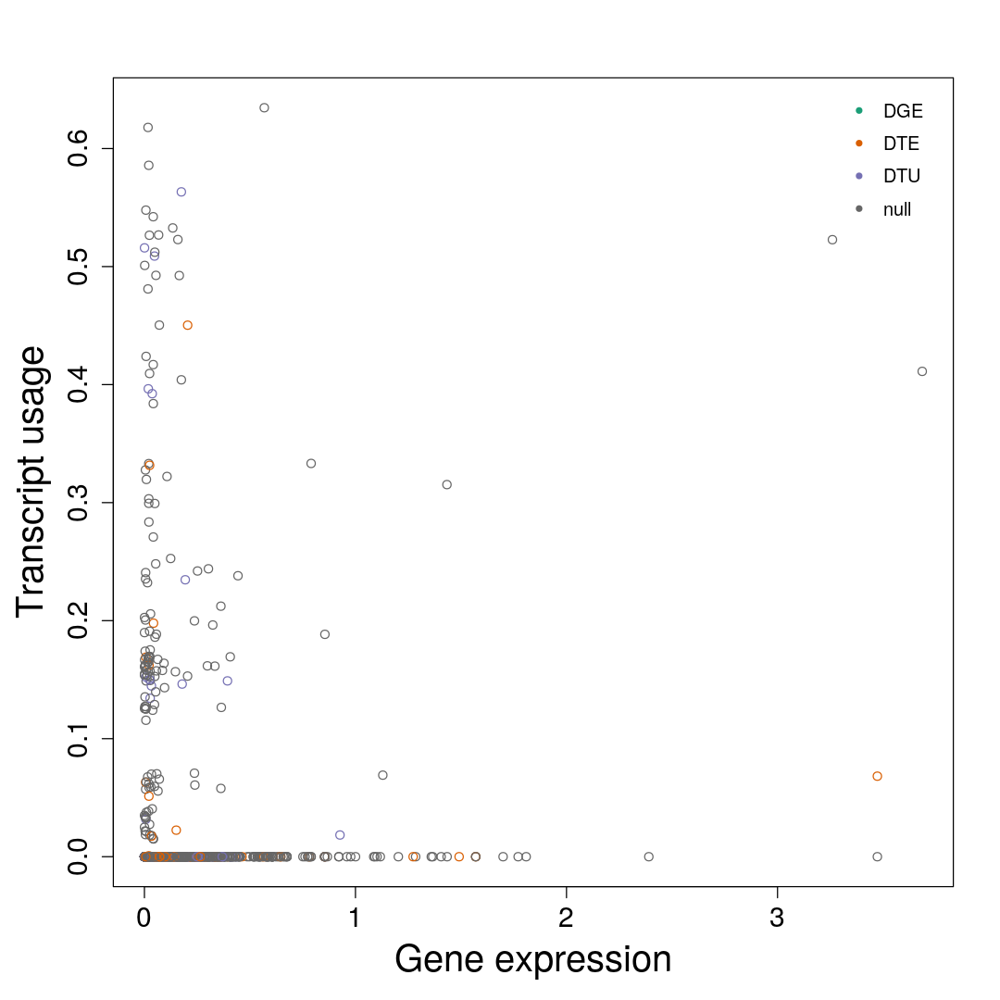

In [184]:
bigpar()
# here cap the smallest DESeq2 adj p-value
cap.padj <- pmin(-log10(dres$padj), 100)
# this vector only used for plotting
jitter.padj <- -log10(dxr_g$qval + 1e-20)
jp.idx <- jitter.padj == 20
jitter.padj[jp.idx] <- rnorm(sum(jp.idx),20,.25)
plot(cap.padj, jitter.padj, col=col,
     xlab="Gene expression",
     ylab="Transcript usage")
legend("topright",
       c("DGE","DTE","DTU","null"),
       col=c(1:3,16), pch=20, bty="n")

# Import option 2: TXIMPORT - genes level counts

In [5]:
salmon_samples <- read.table(file.path("SALMON_IN", "salmon_samples.txt"), header = FALSE)
files <- file.path("SALMON_IN", paste0(salmon_samples$V1, "/",  "quant.sf"))
condition = factor(rep(c('C','T'), each = 8))
as.vector(salmon_samples$V1)

[1] "RNA01" "RNA02" "RNA03" "RNA04" "RNA05" "RNA06" "RNA07" "RNA08" "RNA09"
[10] "RNA10" "RNA11" "RNA12" "RNA13" "RNA14" "RNA15" "RNA16"

#### Transcripts 2 Genes mapping: tx2gene

In [6]:
# create database of transcripts from gtf
gtf_file = "REF/gencode.v32.annotation.gtf"
suppressMessages(txdb <- makeTxDbFromGFF(file=gtf_file))

In [7]:
# this input requires to leave the dots in IDs - don't process to remove them
k <- keys(txdb, keytype = "TXNAME")
tx2gene <- AnnotationDbi::select(txdb, keys = k, keytype = "TXNAME", columns = "GENEID")
# rename columns
colnames(tx2gene) <- c('TX_NAME', 'GENE_ID')
head(tx2gene)

'select()' returned 1:1 mapping between keys and columns



TX_NAME,GENE_ID
<chr>,<chr>
ENST00000456328.2,ENSG00000223972.5
ENST00000450305.2,ENSG00000223972.5
ENST00000473358.1,ENSG00000243485.5
ENST00000469289.1,ENSG00000243485.5
ENST00000607096.1,ENSG00000284332.1
ENST00000606857.1,ENSG00000268020.3


In [8]:
txi = tximport::tximport(files,
                         type = "salmon",
                         txIn = TRUE, 
                         countsFromAbundance = "lengthScaledTPM",
                         tx2gene = tx2gene,
                         dropInfReps = TRUE)

reading in files with read_tsv

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 


summarizing abundance

summarizing counts

summarizing length



In [9]:
cols = c('0286', '1567', '0842', '1208',
           '0271', '1215', '1152', '0462',
           '0384', '0627', '0871', '0414',
           '0820', '0208', '1335', '1727')

In [10]:
# Rename columns with sample names
colnames(txi$counts) <- cols
colnames(txi$abundance) <- cols
colnames(txi$length) <- cols

In [56]:
# Rename columns with sample names
colnames(txi$counts) = as.vector(salmon_samples$V1)
colnames(txi$abundance) = as.vector(salmon_samples$V1)
colnames(txi$length) = as.vector(salmon_samples$V1)

In [11]:
head(txi$counts,2)

,0286,1567,0842,1208,0271,1215,1152,0462,0384,0627,0871,0414,0820,0208,1335,1727
ENSG00000000003.15,5.285883,1.068945,1.06216,6.205759,2.050466,1.010748,7.074189,0,3.089825,2.543507,0,1.848967,2.928855,3.94182,2.872112,2.82013
ENSG00000000005.6,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0,0.000000,0.000000,0,0.000000,0.000000,0.00000,0.000000,0.00000


In [14]:
head(rownames(txi$counts))

[1] "ENSG00000000003.15" "ENSG00000000005.6"  "ENSG00000000419.12"
[4] "ENSG00000000457.14" "ENSG00000000460.17" "ENSG00000000938.13"

In [261]:
#rownames(txi$counts) = as.vector(rownames(dds_salmon_names))
#rownames(txi$abundance) = as.vector(rownames(dds_salmon_names))
#rownames(txi$length) = as.vector(rownames(dds_salmon_names))

In [12]:
# design = table of samples corresponding to conditions
condition = factor(rep(c('C','T'), each = 8))
samples <- data.frame(row.names=as.vector(cols), condition=condition)
# importing salmon count data into DESeq
suppressMessages(dds_salmon <- DESeqDataSetFromTximport(txi, samples, ~condition))
# Filter null or ultra-low abundance genes
keep <- rowSums(counts(dds_salmon)) > 16
dds_salmon <- dds_salmon[keep,]
dds_salmon

class: DESeqDataSet 
dim: 25134 16 
metadata(1): version
assays(1): counts
rownames(25134): ENSG00000000003.15 ENSG00000000419.12 ...
  ENSG00000288398.1 ENSG00000288473.1
rowData names(0):
colnames(16): 0286 1567 ... 1335 1727
colData names(1): condition

### Add genes symbols to dds_salmon dataset --> Python

In [13]:
# number of transcripts
length(rownames(dds_salmon))

[1] 25134

In [14]:
# store list of rownames (GENE_ID)
ga_list <- rownames(dds_salmon)
head(ga_list)

[1] "ENSG00000000003.15" "ENSG00000000419.12" "ENSG00000000457.14"
[4] "ENSG00000000460.17" "ENSG00000000938.13" "ENSG00000000971.15"

In [18]:
# create a dataframe from both lists and export for Python processing with Pyensembl
tx_df = data.frame("GENE_ID" = ga_list, stringsAsFactors = FALSE)
write.table(tx_df, 
            file = "SALMON_TEMP/TXIMPORT_salmon_geneID_dds.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [15]:
# back from Python
# structurue: ['GENE_ID', 'GENE_NAME']
ga_df <- read.table(file="SALMON_TEMP/TXIMPORT_salmon_geneID_dds_OK.txt", 
                        sep="\t", 
                        header=T, 
                        stringsAsFactors=F)

In [16]:
# check if rownames and processed dataframe length match
length(ga_df$GENE_ID) == length(rownames(dds_salmon))

[1] TRUE

In [17]:
# change rownames(dds_salmon) to GENE_ID (without dots)
rownames(dds_salmon) <- ga_df$GENE_ID
head(rownames(dds_salmon))

[1] "ENSG00000000003" "ENSG00000000419" "ENSG00000000457" "ENSG00000000460"
[5] "ENSG00000000938" "ENSG00000000971"

In [18]:
# duplicate dataset and rename rownames with GENE_NAME
dds_salmon_names <- dds_salmon
rownames(dds_salmon_names) <- ga_df$GENE_NAME
dds_salmon_names

class: DESeqDataSet 
dim: 25134 16 
metadata(1): version
assays(1): counts
rownames(25134): TSPAN6 DPM1 ... AL109627.1 AL669830.1
rowData names(0):
colnames(16): 0286 1567 ... 1335 1727
colData names(1): condition

In [19]:
class(dds_salmon_names)

[1] "DESeqDataSet"
attr(,"package")
[1] "DESeq2"

In [20]:
# run DSEq2 on dataset with GENE_ID as rownames
suppressMessages(dds_salmon <- DESeq(dds_salmon))

In [21]:
# run DSEq2 on dataset with GENE_NAME as rownames
suppressMessages(dds_salmon_names <- DESeq(dds_salmon_names))

In [22]:
colnames(mcols(dds_salmon_names))

[1] "baseMean"                       "baseVar"                       
 [3] "allZero"                        "dispGeneEst"                   
 [5] "dispGeneIter"                   "dispFit"                       
 [7] "dispersion"                     "dispIter"                      
 [9] "dispOutlier"                    "dispMAP"                       
[11] "Intercept"                      "condition_T_vs_C"              
[13] "SE_Intercept"                   "SE_condition_T_vs_C"           
[15] "WaldStatistic_Intercept"        "WaldStatistic_condition_T_vs_C"
[17] "WaldPvalue_Intercept"           "WaldPvalue_condition_T_vs_C"   
[19] "betaConv"                       "betaIter"                      
[21] "deviance"                       "maxCooks"                      
[23] "replace"

In [23]:
# add gene_id and gene_name columns ta dataset with rownames as GENE_NAME, 
# reorder column names
mcols(dds_salmon_names)$gene_id <- ga_df$GENE_ID
mcols(dds_salmon_names)$gene_name <- ga_df$GENE_NAME
orderCol <- c('gene_id', 'gene_name', 'baseMean', 'baseVar', 'allZero', 'dispGeneEst', 'dispGeneIter', 
              'dispFit', 'dispersion', 'dispIter', 'dispOutlier', 'dispMAP', 'Intercept', 
              'condition_T_vs_C', 'SE_Intercept', 'SE_condition_T_vs_C', 'WaldStatistic_Intercept', 
              'WaldStatistic_condition_T_vs_C', 'WaldPvalue_Intercept', 'WaldPvalue_condition_T_vs_C', 
              'betaConv', 'betaIter', 'deviance', 'maxCooks', 'replace')
invisible(mcols(dds_salmon_names) <- mcols(dds_salmon_names)[, orderCol])
colnames(mcols(dds_salmon_names))

[1] "gene_id"                        "gene_name"                     
 [3] "baseMean"                       "baseVar"                       
 [5] "allZero"                        "dispGeneEst"                   
 [7] "dispGeneIter"                   "dispFit"                       
 [9] "dispersion"                     "dispIter"                      
[11] "dispOutlier"                    "dispMAP"                       
[13] "Intercept"                      "condition_T_vs_C"              
[15] "SE_Intercept"                   "SE_condition_T_vs_C"           
[17] "WaldStatistic_Intercept"        "WaldStatistic_condition_T_vs_C"
[19] "WaldPvalue_Intercept"           "WaldPvalue_condition_T_vs_C"   
[21] "betaConv"                       "betaIter"                      
[23] "deviance"                       "maxCooks"                      
[25] "replace"

## Exploratory analysis and visualization

In [24]:
# Normalized Counts Transformation (NCT)
ntd <- normTransform(dds_salmon_names)

In [25]:
# variance stabilizing transformation (VST) 
# for negative binomial data with a dispersion-mean trend
vsd <- vst(dds_salmon_names, blind = FALSE)

In [26]:
# regularized-logarithm transformation (RLOG)
rld <- rlog(dds_salmon_names, blind = FALSE)

#### Plot standard deviation of the transformed data, across samples, against the mean

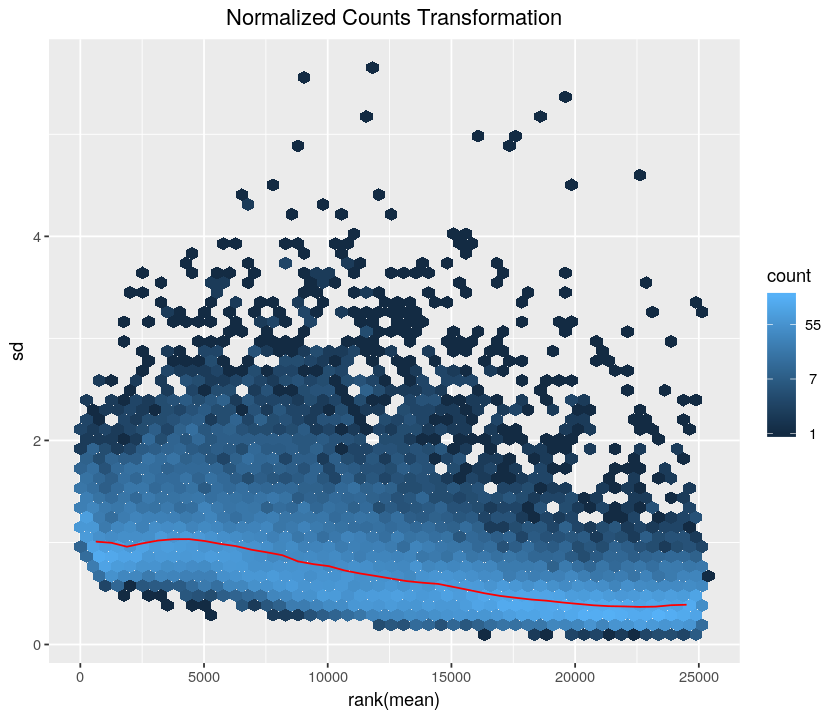

In [724]:
# shifted logarithm transformation (NTD)
options(repr.plot.width=7, repr.plot.height=6)
msd <- meanSdPlot(assay(ntd), plot=FALSE)
msd$gg +
ggtitle("Normalized Counts Transformation") +
theme(plot.title = element_text(hjust = 0.5))
ggsave("DESEQ2_RES/DESEQ2_salmon_varTrans_NCT.png", width=7, height=6)
invisible(dev.off())

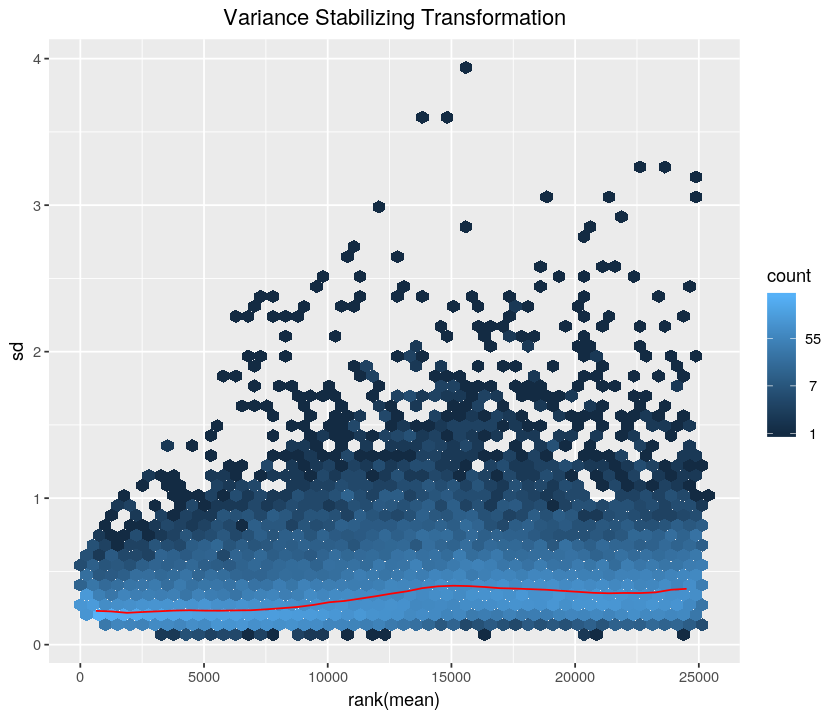

In [725]:
# variance stabilizing transformation (VSD)
options(repr.plot.width=7, repr.plot.height=6)
msd <- meanSdPlot(assay(vsd), plot=FALSE)
msd$gg +
ggtitle("Variance Stabilizing Transformation") +
theme(plot.title = element_text(hjust = 0.5))
ggsave("DESEQ2_RES/DESEQ2_salmon_varTrans_VSD.png", width=7, height=6)
invisible(dev.off())

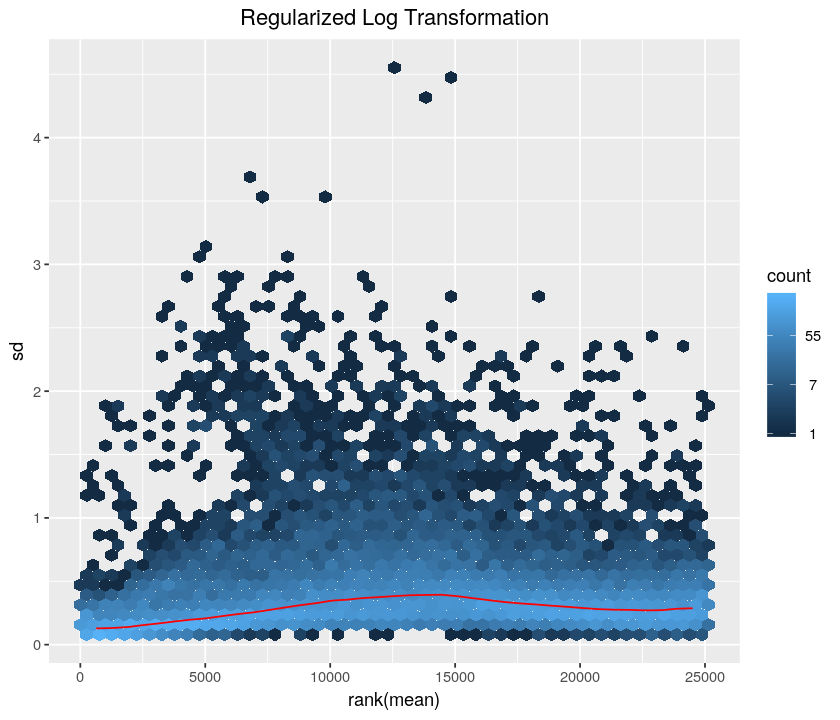

In [726]:
# regularized log transformation (RLD)
options(repr.plot.width=7, repr.plot.height=6)
msd <- meanSdPlot(assay(rld), plot=FALSE)
msd$gg +
ggtitle("Regularized Log Transformation") +
theme(plot.title = element_text(hjust = 0.5))
ggsave("DESEQ2_RES/DESEQ2_salmon_varTrans_RLD.png", width=7, height=6)
invisible(dev.off())

In [475]:
# estimate size factors to account for sequencing depth
#dds_salmon_names <- estimateSizeFactors(dds_salmon_names)
#dds_salmon_names <- estimateDispersions(dds_salmon_names)
#dds_salmon <- nbinomWaldTest(dds_salmon)

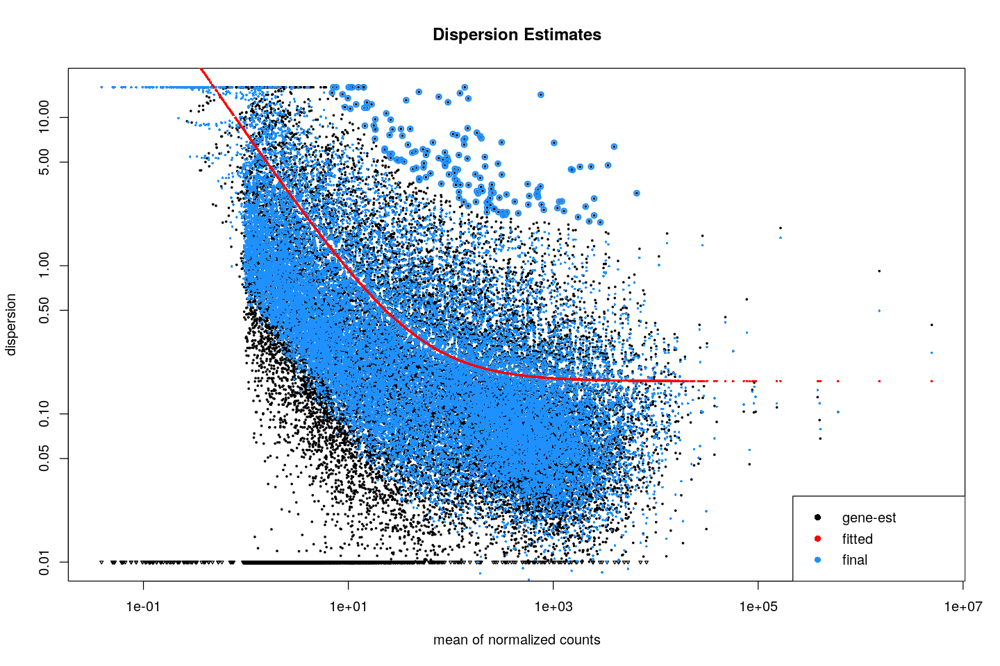

In [727]:
# gene-wise MLEs are obtained using only the respective gene’s data (black dots)
# MLE = Maximum Likelihood Estimation
# red curve is fit to the MLEs to capture the overall trend of dispersion-mean dependence
# shrinkage of the noisy gene-wise estimates toward the consensus (red curve)
# black dots circled in blue are detected as dispersion outliers
# https://genomebiology.biomedcentral.com/articles/10.1186/s13059-014-0550-8
options(repr.plot.width=12, repr.plot.height=8)
plotDispEsts(dds_salmon_names, ymin=0.01, cex=0.4, main="Dispersion Estimates")
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_dispersion_outliers.png", width=720, height=480))

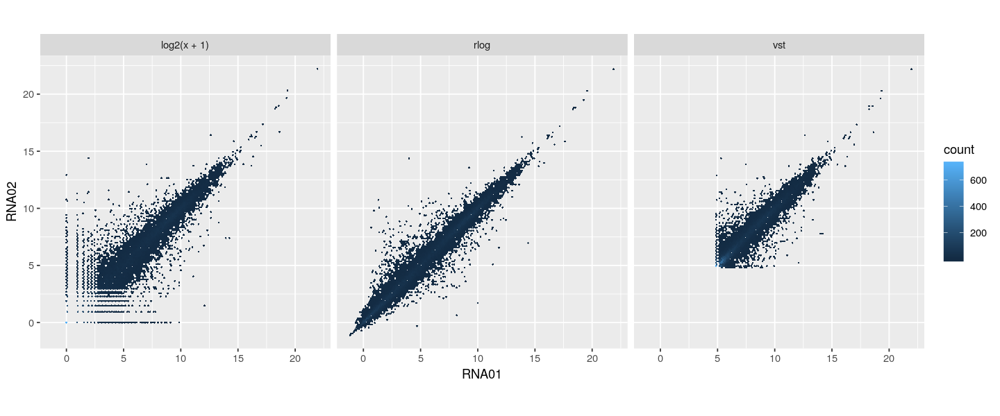

In [728]:
# Compare 2 samples expression after normalization
# scatterplots using the log2 transform of normalized counts (left)
# using the VST (middle), and using the rlog (right)
df <- bind_rows(as_tibble(log2(counts(dds_salmon_names, 
                                          normalized=TRUE)[, 1:2]+1)) %>% mutate(transformation = "log2(x + 1)"),
                as_tibble(assay(vsd)[, 1:2]) %>% mutate(transformation = "vst"),
                as_tibble(assay(rld)[, 1:2]) %>% mutate(transformation = "rlog"))
options(repr.plot.width=12, repr.plot.height=5)
ggplot(df, aes(x = RNA01, y = RNA02)) + 
geom_hex(bins = 150) + 
coord_fixed() + 
facet_grid( . ~ transformation)
ggsave("DESEQ2_RES/DESEQ2_salmon_Norm_2samples_comp.png", width=12, height=5)
invisible(dev.off())

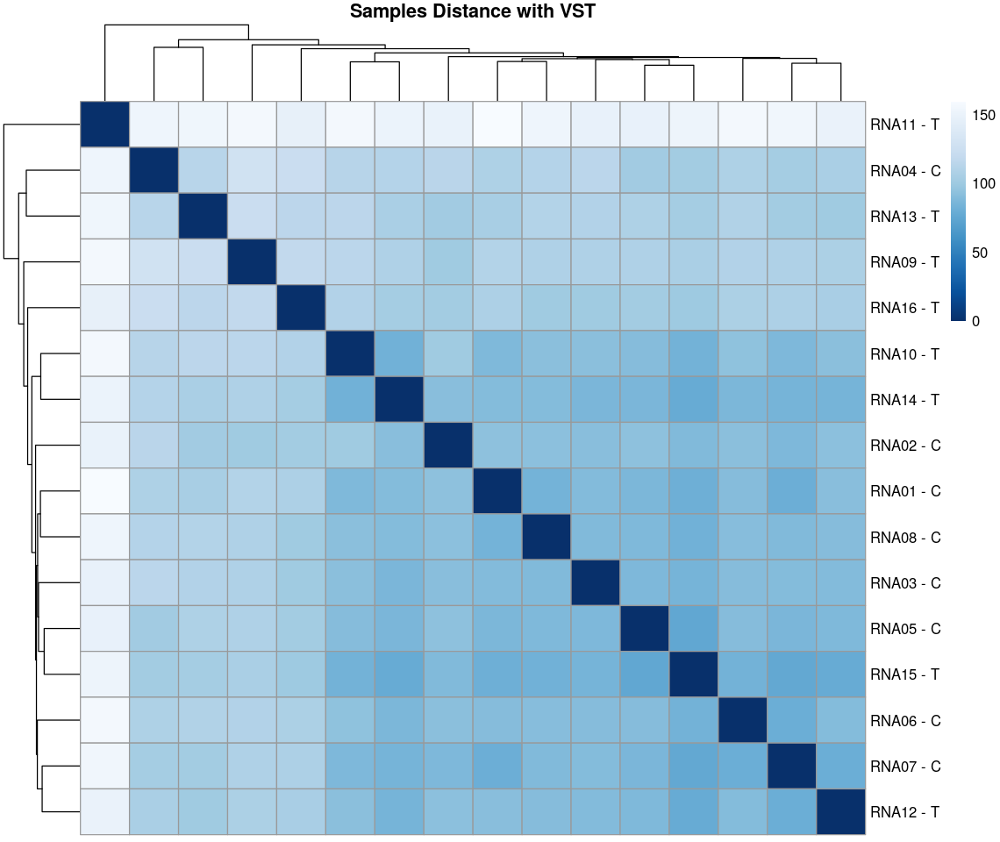

In [729]:
# assess overall similarity between samples
# Heatmap of sample-to-sample distances using the variance stabilizing transformed values
# dendrogram at the side shows the hierarchical clustering of the samples
sampleDists <- dist(t(assay(vsd)))
options(repr.plot.width=9.5, repr.plot.height=8)
sampleDistMatrix <- as.matrix(sampleDists)
rownames(sampleDistMatrix) <- paste(colnames(vsd), vsd$condition, sep = " - " )
colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette(rev(brewer.pal(9,"Blues")))(255)
pm = pheatmap(sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         col = colors, main="Samples Distance with VST")
save_pheatmap_png(pm, "DESEQ2_RES/DESEQ2_salmon_heatmap_sample_dist_VST.png")

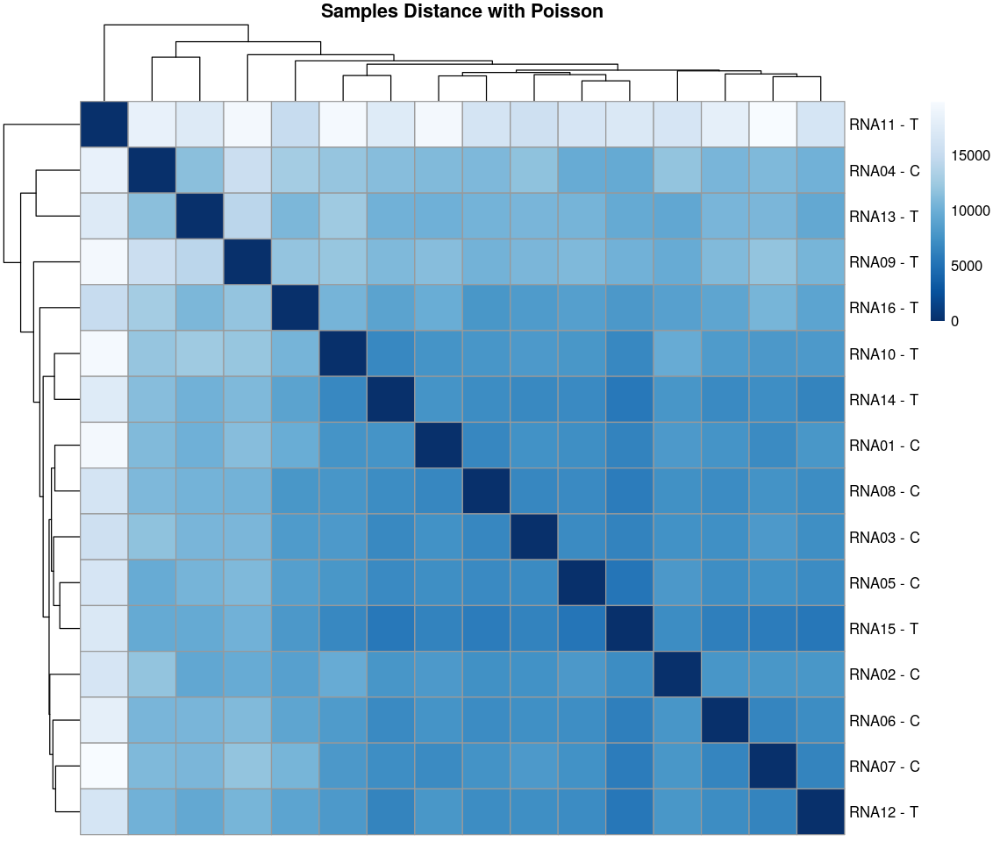

In [730]:
# calculating sample distances using the Poisson Distance
poisd <- PoissonDistance(t(counts(dds_salmon_names)))
options(repr.plot.width=9.5, repr.plot.height=8)
samplePoisDistMatrix <- as.matrix(poisd$dd)
rownames(samplePoisDistMatrix) <- paste(colnames(dds_salmon_names), dds_salmon_names$condition, sep=" - " )
colnames(samplePoisDistMatrix) <- NULL
pm = pheatmap(samplePoisDistMatrix,
         clustering_distance_rows = poisd$dd,
         clustering_distance_cols = poisd$dd,
         col = colors, main="Samples Distance with Poisson")
save_pheatmap_png(pm, "DESEQ2_RES/DESEQ2_salmon_heatmap_sample_dist_poisson.png")

#### PCA plot

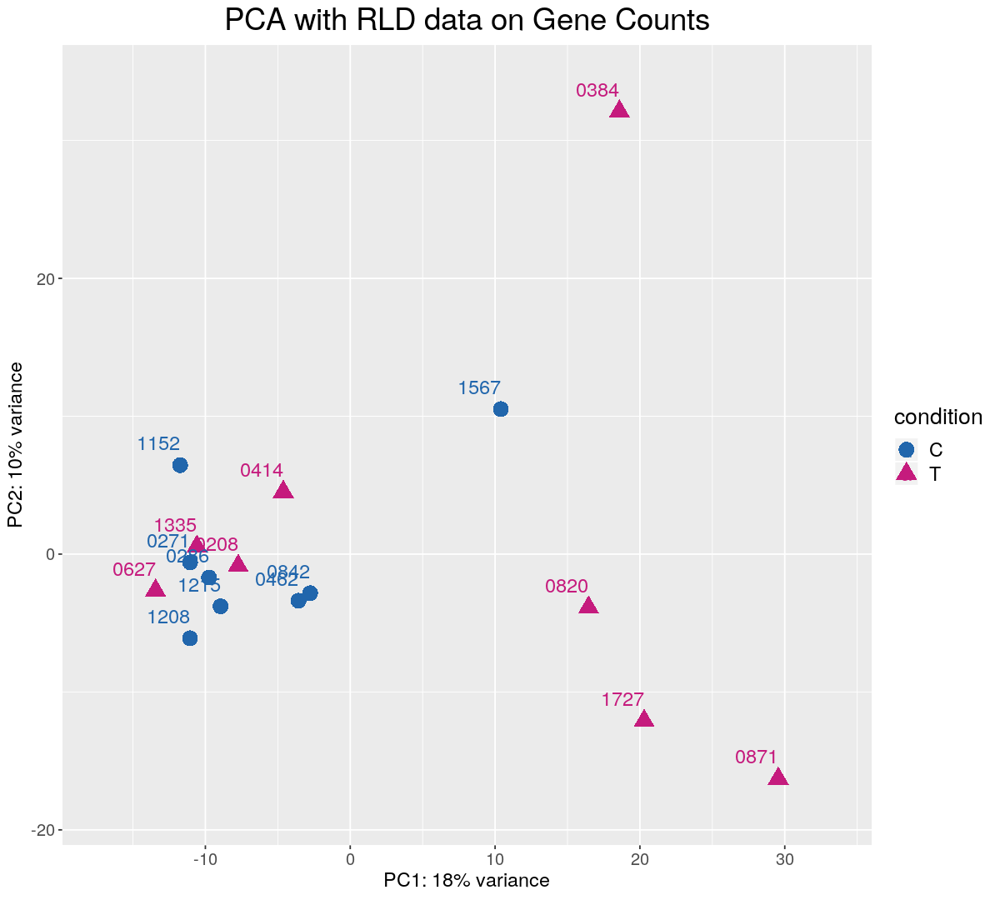

In [30]:
# PCA plot using the VST data
pcaData <- DESeq2::plotPCA(rld, intgroup = colnames(colData(vsd)[1]), returnData = TRUE)
percentVar <- round(100 * attr(pcaData, "percentVar"))
options(repr.plot.width=10, repr.plot.height=9)
ggplot(pcaData, aes(x = PC1, y = PC2, color=condition, shape=condition)) +
geom_point(size =5) +
geom_text(aes(label=name),hjust=1, vjust=-1, cex=5) +
xlab(paste0("PC1: ", percentVar[1], "% variance")) +
ylab(paste0("PC2: ", percentVar[2], "% variance")) +
scale_x_continuous(expand = c(0.15, 0)) + 
scale_y_continuous(expand = c(0.1, 0)) + 
ggtitle("PCA with RLD data on Gene Counts") + 
theme(plot.title = element_text(hjust = 0.5, size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      legend.text=element_text(size=14),
      legend.title=element_text(size=16),
      legend.position="right") + 
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]))
ggsave("DESEQ2_RES/DESEQ2_salmon_PCA_RLD_samples_genes.png", width=10, height=9)
invisible(dev.off())

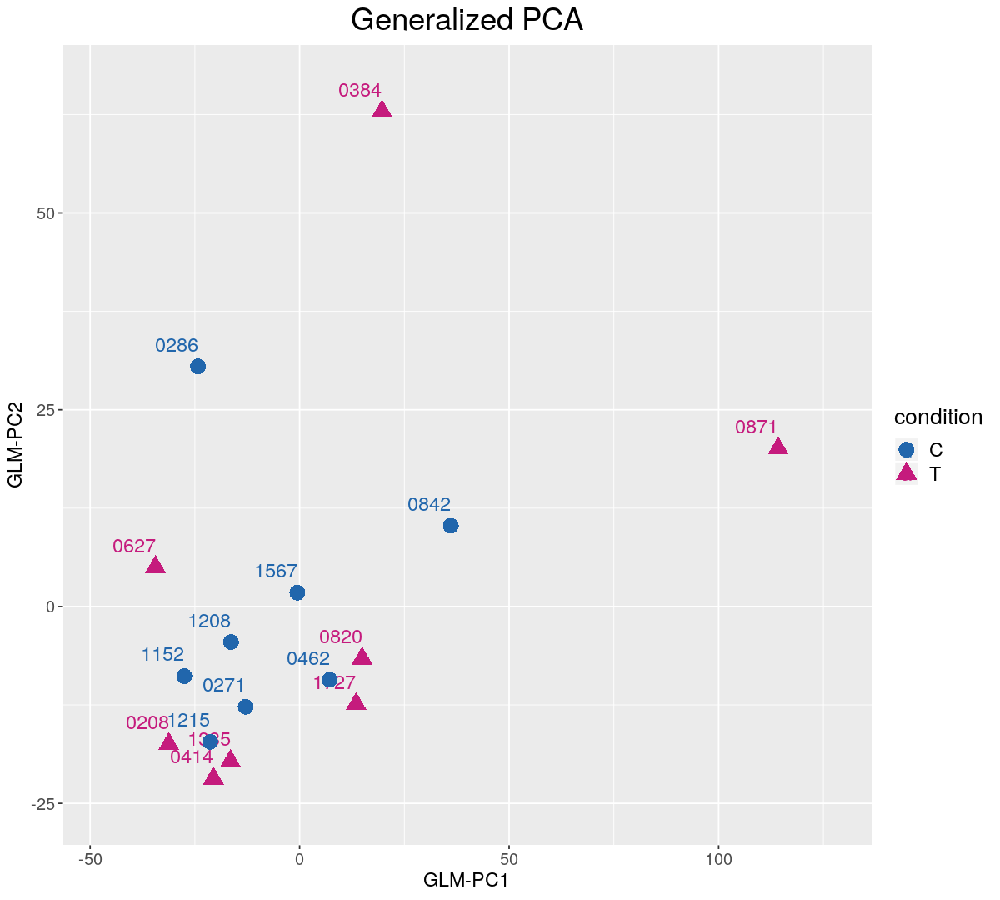

In [27]:
# MUST BE DONE WITH ACCESSION NUMBERS
# generalized principal component analysis (GLM-PCA)
# --> generalization of PCA to exponential family likelihoods
gpca <- glmpca(counts(dds_salmon), L=2)
gpca.dat <- gpca$factors
gpca.dat$samples <- colnames(dds_salmon)
gpca.dat$condition <- as.vector(dds_salmon$condition)
options(repr.plot.width=10, repr.plot.height=9)
ggplot(gpca.dat, aes(x = dim1, y = dim2,  color=condition, shape=condition)) +
geom_text(aes(label=samples),hjust=1, vjust=-1, cex=5, na.rm=TRUE) +
geom_point(size=5, na.rm=TRUE) + 
scale_x_continuous(expand = c(0.15, 0)) + 
scale_y_continuous(expand = c(0.1, 0)) + 
xlab("GLM-PC1") +
ylab("GLM-PC2") +
ggtitle("Generalized PCA") + 
theme(plot.title = element_text(hjust = 0.5, size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      legend.text=element_text(size=14),
      legend.title=element_text(size=16),
      legend.position="right") + 
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]))
ggsave("DESEQ2_RES/DESEQ2_salmon_GLM-PCA.png", width=10, height=9)
invisible(dev.off())

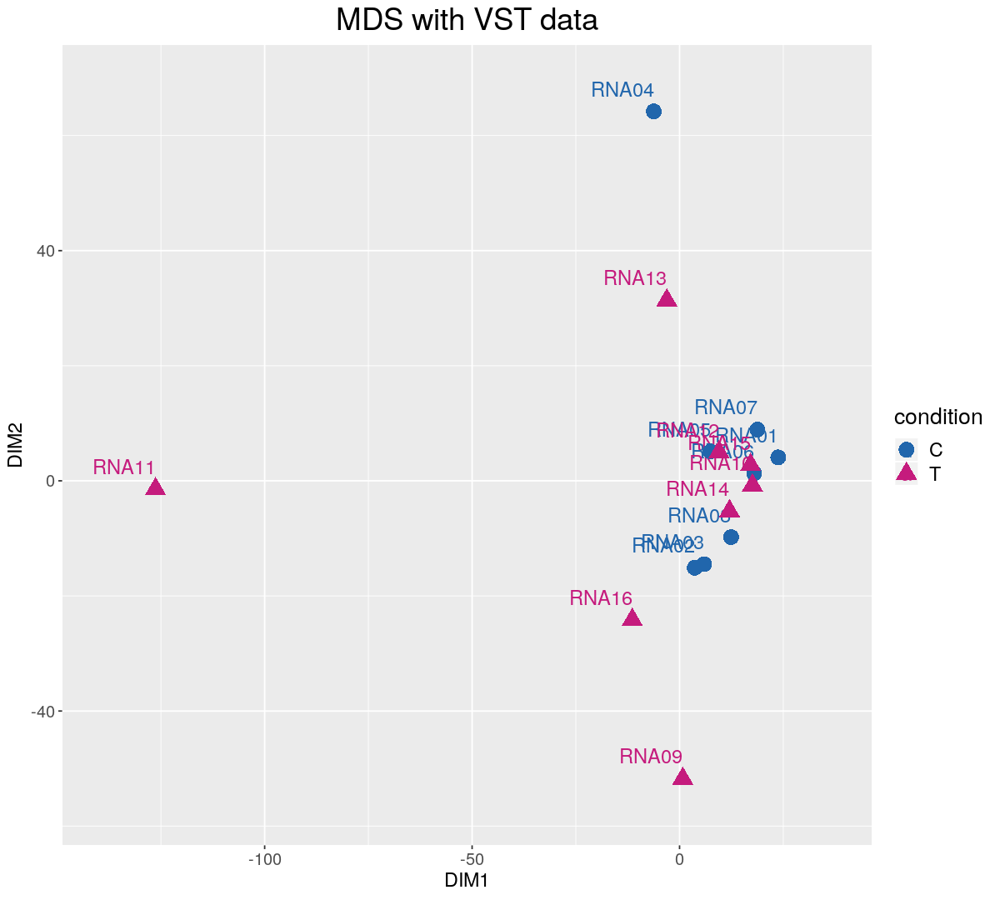

In [733]:
# multidimensional scaling (MDS) plot
options(repr.plot.width=10, repr.plot.height=9)
mds <- as.data.frame(colData(vsd)) %>% cbind(cmdscale(sampleDistMatrix))
mds$samples <- colnames(dds_salmon_names)
ggplot(mds, aes(x = `1`, y = `2`, color = condition, shape = condition)) +
geom_text(aes(label=samples),hjust=1, vjust=-1, cex=5, na.rm=TRUE) +
geom_point(size=5, na.rm=TRUE) +
xlab("DIM1") +
ylab("DIM2") +
scale_x_continuous(expand = c(0.15, 0)) + 
scale_y_continuous(expand = c(0.1, 0)) + 
ggtitle("MDS with VST data") + 
theme(plot.title = element_text(hjust = 0.5, size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      legend.text=element_text(size=14),
      legend.title=element_text(size=16),
      legend.position="right") + 
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]))
ggsave("DESEQ2_RES/DESEQ2_salmon_MDS_VST.png", width=10, height=9)
invisible(dev.off())

## Differential Expression Analysis

In [31]:
# lists the coefficients
resultsNames(dds_salmon_names)

[1] "Intercept"        "condition_T_vs_C"

In [29]:
# generate results on dataset with GENE_NAME as rownames
res_salmon_names <- DESeq2::results(dds_salmon_names, name="condition_T_vs_C")

In [30]:
head(rownames(res_salmon_names))

[1] "TSPAN6"   "DPM1"     "SCYL3"    "C1orf112" "FGR"      "CFH"

In [31]:
# generate results on dataset with GENE_ID as rownames
res_salmon <- DESeq2::results(dds_salmon, name="condition_T_vs_C")

In [35]:
summary(res_salmon_names)
summary <- capture.output(summary(res_salmon_names))
fileConn<-file("DESEQ2_RES/DESEQ2_salmon_resultsSummary.txt")
write(summary, fileConn)
close(fileConn)


out of 25079 with nonzero total read count
adjusted p-value < 0.1
LFC > 0 (up)       : 56, 0.22%
LFC < 0 (down)     : 19, 0.076%
outliers [1]       : 0, 0%
low counts [2]     : 2486, 9.9%
(mean count < 2)
[1] see 'cooksCutoff' argument of ?results
[2] see 'independentFiltering' argument of ?results



In [36]:
# check which variables and tests were used in results
mcols(res_salmon_names)$description

[1] "mean of normalized counts for all samples"
[2] "log2 fold change (MLE): condition T vs C" 
[3] "standard error: condition T vs C"         
[4] "Wald statistic: condition T vs C"         
[5] "Wald test p-value: condition T vs C"      
[6] "BH adjusted p-values"

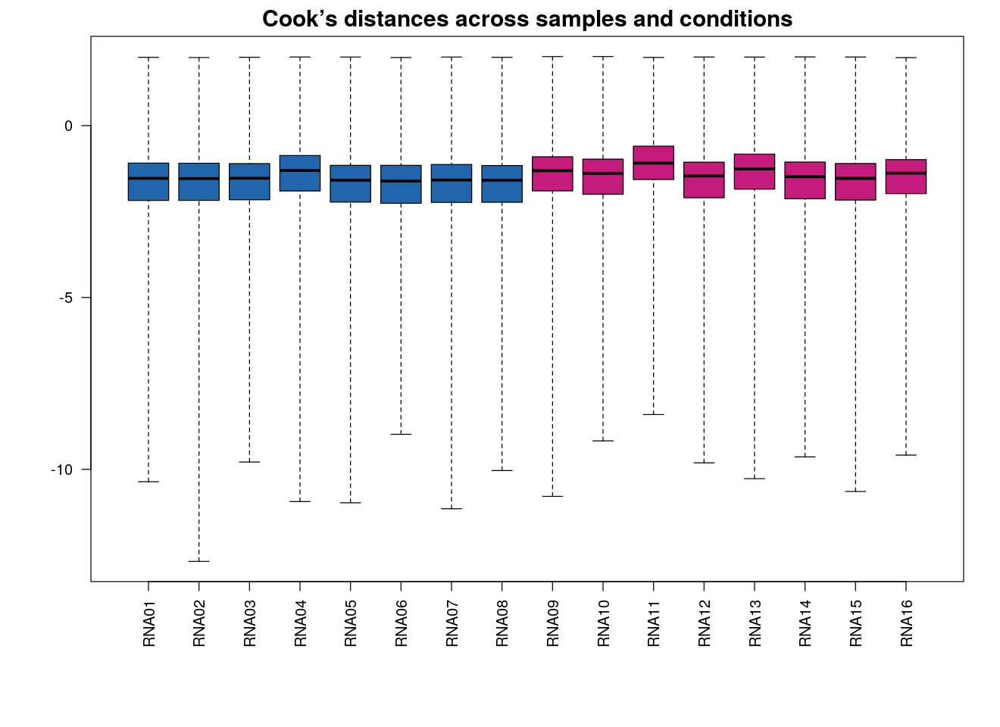

In [740]:
# boxplot of the Cook’s distances to see if one sample is consistently higher than others
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
options(repr.plot.width=11, repr.plot.height=8)
par(mar=c(8,5,2,2))
boxplot(log10(assays(dds_salmon_names)[["cooks"]]), 
        range=0, 
        las=2, 
        col=col,
        main="Cook’s distances across samples and conditions",
        cex.main=1.5)
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_cook_boxplot.png", width=640, height=480))

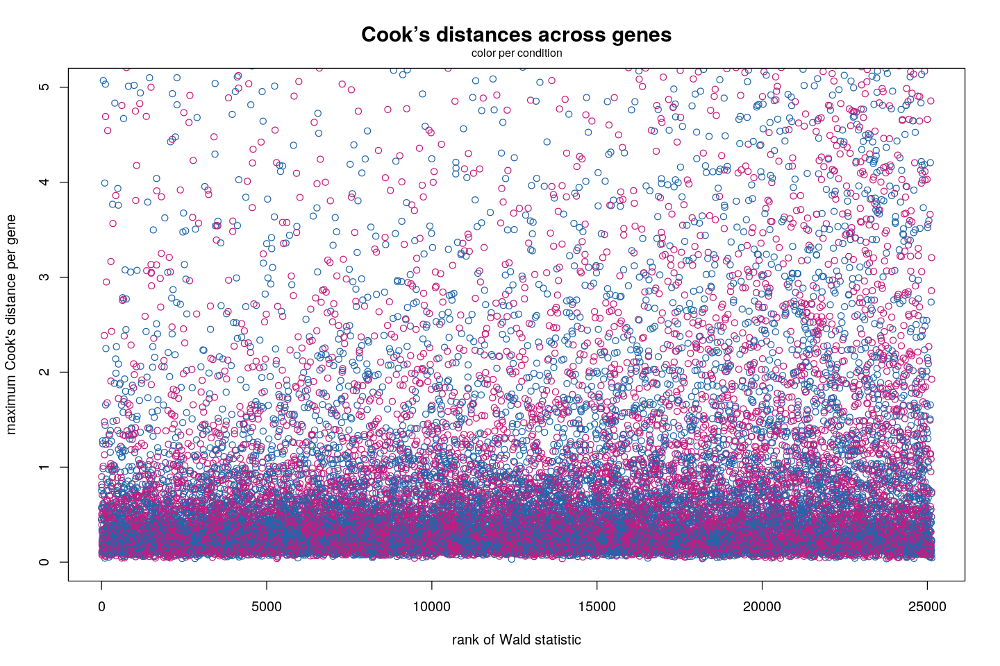

In [741]:
# Count outlier detection
# plot the maximum value of Cook’s distance for each row over the rank 
# of the test statistic to justify its use as a filtering criterion
col <- rep(c(brewer.pal(8, "RdBu")[8], 
             brewer.pal(8, "PiYG")[1]), 
             each = 8)
options(repr.plot.width=12, 
        repr.plot.height=8)
W <- res_salmon$stat
maxCooks <- apply(assays(dds_salmon)[["cooks"]],1,max)
idx <- !is.na(W)
plot(rank(W[idx]), 
     maxCooks[idx], 
     xlab="rank of Wald statistic", 
     ylab="maximum Cook's distance per gene",
     ylim=c(0,5), 
     cex=1, 
     col=col,
     main="Cook’s distances across genes",
     cex.main=1.5)
m <- ncol(dds_salmon)
p <- 3
abline(h=qf(.99, p, m - p))
subtitle ="color per condition"
mtext(line=0.5, adj=0.5, cex=0.8, subtitle)
invisible(dev.print(png, 
                    "DESEQ2_RES/DESEQ2_salmon_cook_dist.png", 
                    width=640, 
                    height=480))

In [37]:
# Genes with adjusted p-values less than 0.1
# padj: Benjamini-Hochberg (BH) adjustment
# if we consider a fraction of 10% false positives acceptable
# we can consider all genes with an adjusted p value below 10% (= 0.1) as significant
table(res_salmon_names$padj < 0.05)


FALSE  TRUE 
22593    55 

In [38]:
# subset the results table to these genes and then sort it by the log2 fold change estimate 
resSig <- subset(res_salmon_names, padj < 0.05)

In [39]:
# top DE genes
rownames(head(resSig[ order(resSig$pvalue), decreasing = FALSE]))

[1] "GNAZ"   "TRPM4"  "MTMR11" "TSHZ2"  "HGSNAT" "IGHG4"

In [40]:
# significant genes with the strongest down-regulation
rownames(head(resSig[order(resSig$log2FoldChange),]))

[1] "IGHV3-69-1" "IGHV3-21"   "IGHV3-48"   "TSHZ2"      "IGLV1-44"  
[6] "AC141586.4"

In [41]:
# most strongly up-regulated
rownames(head(resSig[order(resSig$log2FoldChange, decreasing = TRUE),]))

[1] "IGKV1D-39" "MTMR11"    "SHISA3"    "BTNL9"     "PTCH1"     "PTGFRN"

In [42]:
topGene <- rownames(dds_salmon_names)[which.min(res_salmon_names$padj)]

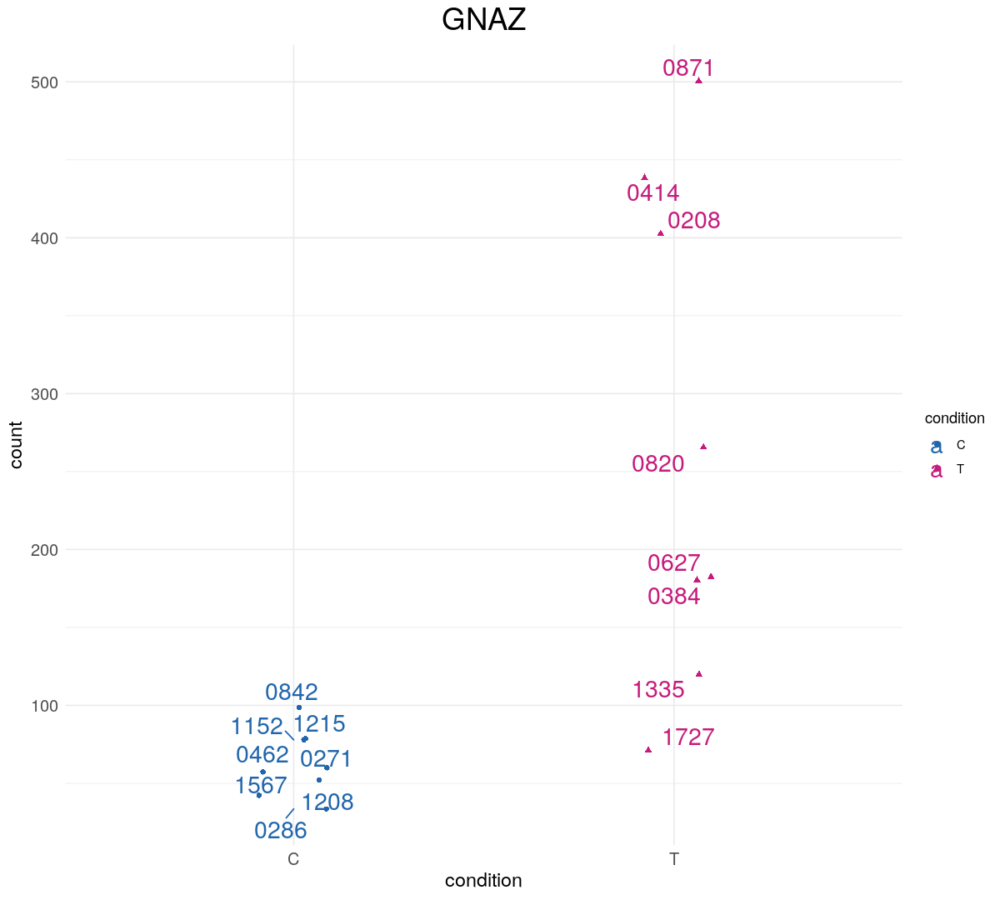

In [43]:
options(repr.plot.width=10, repr.plot.height=9)
d <- plotCounts(dds_salmon_names, 
                gene=topGene, 
                intgroup="condition", 
                returnData=TRUE)
ggplot(d, 
       aes(x = condition, 
           y = count, 
           shape = condition,
           colour = condition)) + 
theme_minimal() +
geom_point(position=position_jitter(w = 0.1,h = 0)) +
geom_text_repel(aes(label = rownames(d)), size=6) + 
ggtitle(topGene) +
theme(plot.title = element_text(hjust = 0.5, size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      #legend.text=element_text(size=14),
      #legend.title=element_text(size=16),
      ) +
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]))
ggsave("DESEQ2_RES/GNAZ.png", width=10, height=9)
invisible(dev.off())

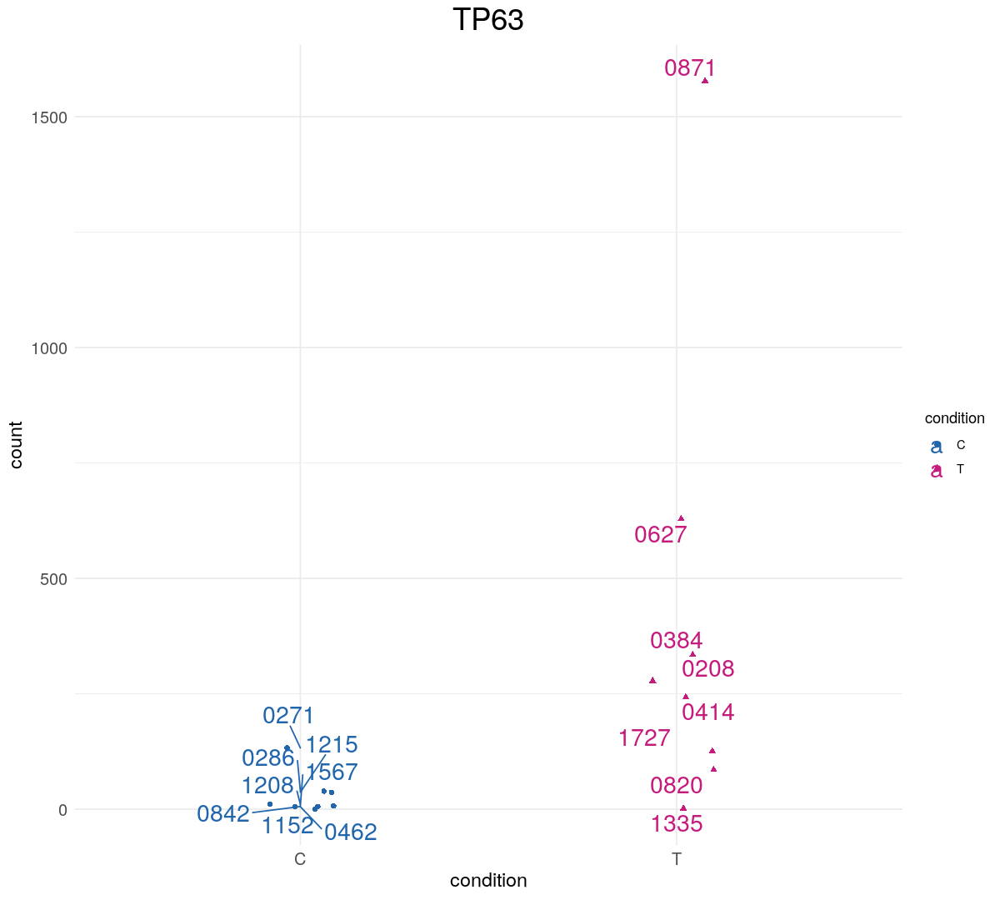

In [83]:
options(repr.plot.width=10, repr.plot.height=9)
d <- plotCounts(dds_salmon_names, 
                gene='TP63', 
                intgroup="condition", 
                returnData=TRUE)
ggplot(d, 
       aes(x = condition, 
           y = count, 
           shape = condition,
           colour = condition)) + 
theme_minimal() +
geom_point(position=position_jitter(w = 0.1,h = 0)) +
geom_text_repel(aes(label = rownames(d)), size=6) + 
ggtitle('TP63') +
theme(plot.title = element_text(hjust = 0.5, size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      #legend.text=element_text(size=14),
      #legend.title=element_text(size=16),
      ) +
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]))
ggsave("DESEQ2_RES/TP63.png", width=10, height=9)
invisible(dev.off())

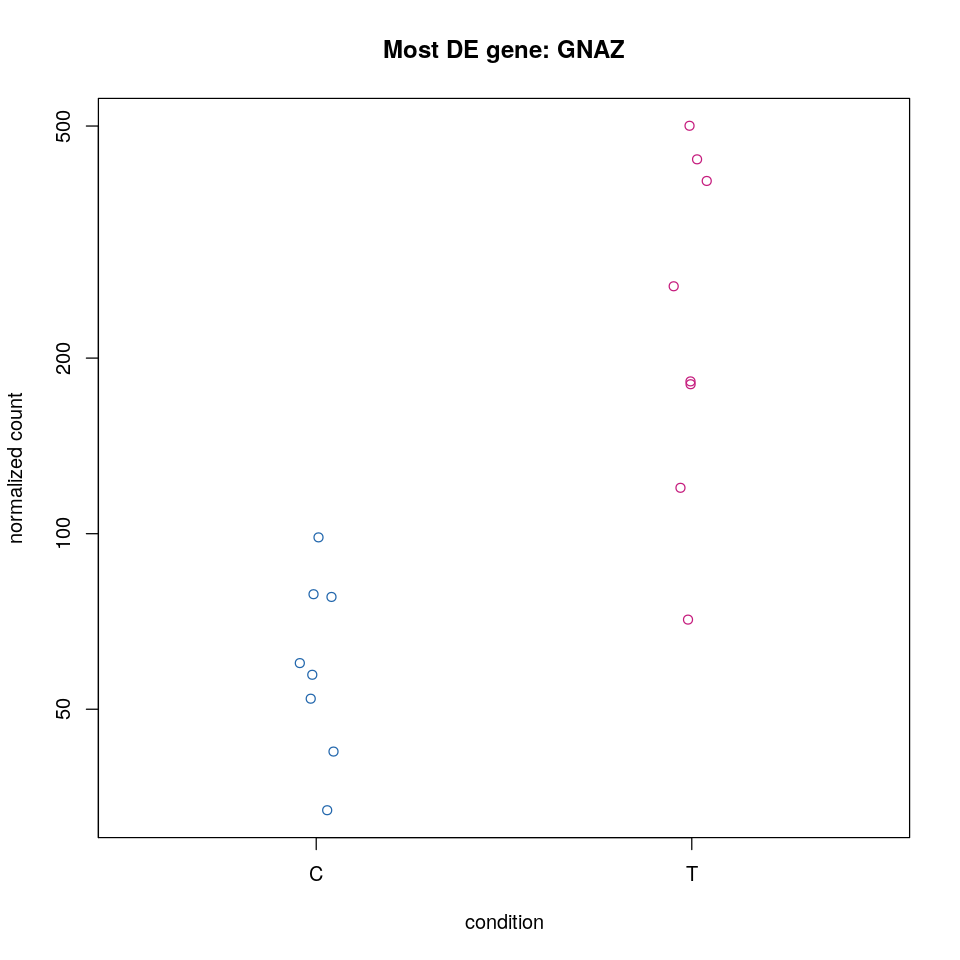

In [207]:
# retrieve the gene that has the lowest adjusted p value (= max differential expression)
# examine the counts of reads for this gene across the groups
col <- rep(c(brewer.pal(8, "RdBu")[8], 
             brewer.pal(8, "PiYG")[1]), 
             each = 8)
options(repr.plot.width=8, 
        repr.plot.height=8)
topGene <- rownames(dds_salmon_names)[which.min(res_salmon_names$padj)]
plotCounts(dds_salmon_names, 
           gene = topGene, 
           intgroup=c("condition"), 
           col=col,
           main=paste0("Most DE gene: ", 
                       topGene),
           xlab="condition")
invisible(dev.print(png, 
                    "DESEQ2_RES/DESEQ2_salmon_topDEGene_counts.png", 
                    width=480, 
                    height=480))

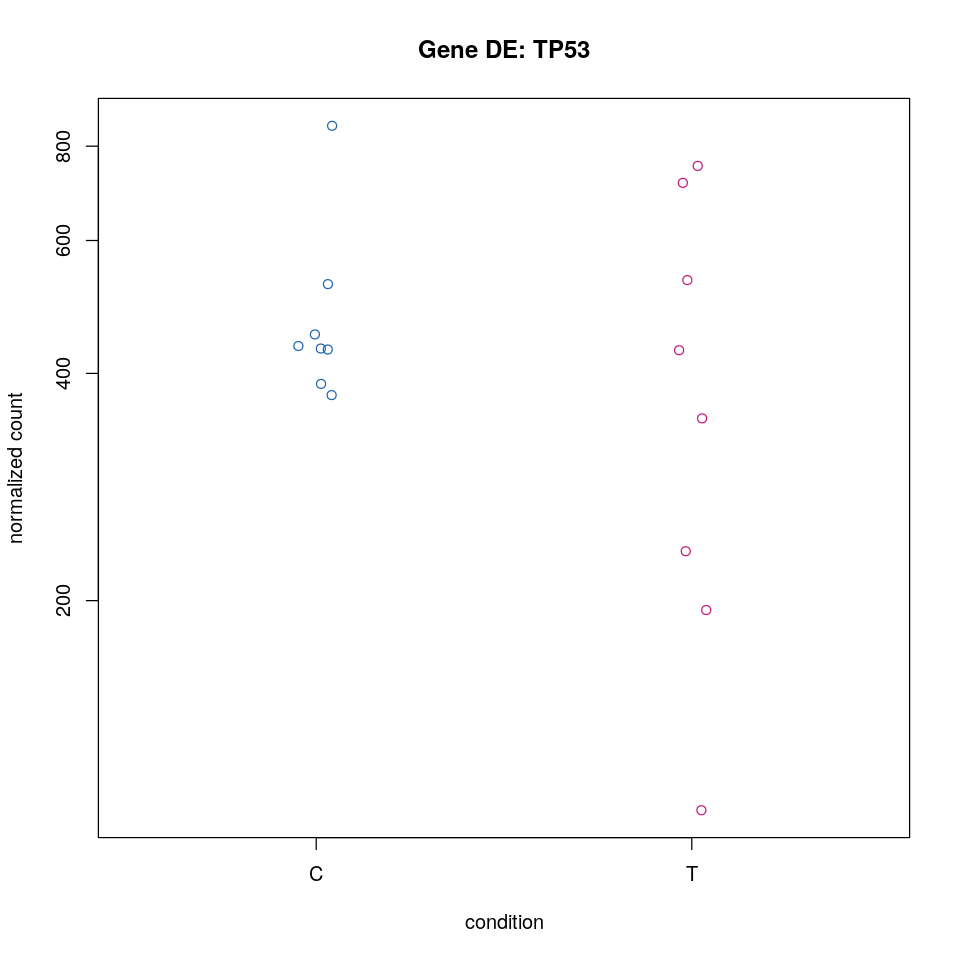

In [208]:
# examine the counts of reads for TP53 across the groups
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
options(repr.plot.width=8, repr.plot.height=8)
plotCounts(dds_salmon_names, 
           gene = "TP53", 
           intgroup=c("condition"), 
           col=col,
           main=paste0("Gene DE: ", "TP53"),
           xlab="condition")
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_TP53_counts.png", width=480, height=480))

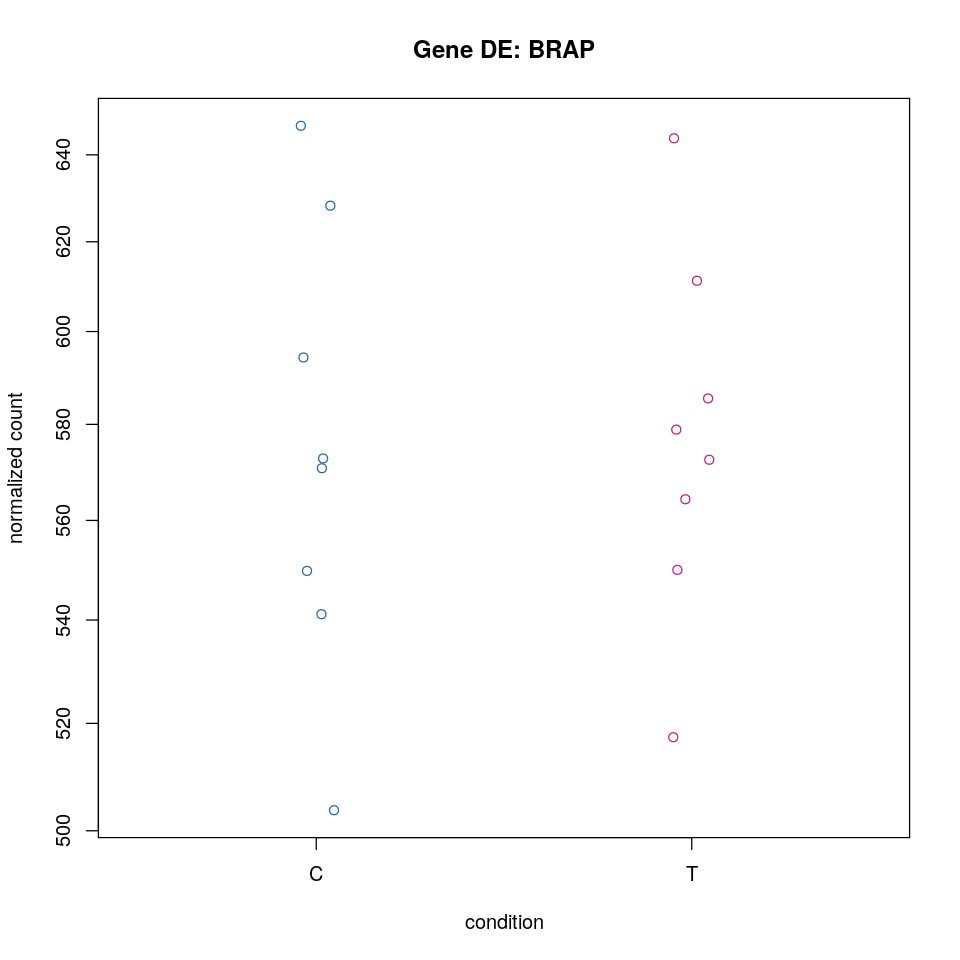

In [232]:
# examine the counts of reads for FLT3 across the groups
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
options(repr.plot.width=8, repr.plot.height=8)
plotCounts(dds_salmon_names, 
           gene = "BRAP", 
           intgroup=c("condition"), 
           col=col,
           main=paste0("Gene DE: ", "BRAP"),
           xlab="condition")
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_BRAP_counts.png", width=480, height=480))

In [32]:
# shrink log fold changes association with condition for genes
# APEGLM = Approximate Posterior Estimation for GLM coefficients
# GLM = Generalized Linear Model
# preserving signal strength while shrinking away noise
resApeglm_genes <- lfcShrink(dds_salmon_names, coef="condition_T_vs_C", type="apeglm")

using 'apeglm' for LFC shrinkage. If used in published research, please cite:
    Zhu, A., Ibrahim, J.G., Love, M.I. (2018) Heavy-tailed prior distributions for
    sequence count data: removing the noise and preserving large differences.
    Bioinformatics. https://doi.org/10.1093/bioinformatics/bty895



In [753]:
# NORMAL = original DESeq2 shrinkage estimator
resNorm_genes <- lfcShrink(dds_salmon_names, coef=2, type="normal")

using 'normal' for LFC shrinkage, the Normal prior from Love et al (2014).

Note that type='apeglm' and type='ashr' have shown to have less bias than type='normal'.
See ?lfcShrink for more details on shrinkage type, and the DESeq2 vignette.
Reference: https://doi.org/10.1093/bioinformatics/bty895



In [750]:
# ASHR = Adaptive Shrinkage (fitted mixture of normals prior)
resAsh_genes <- lfcShrink(dds_salmon_names, coef=2, type="ashr")

using 'ashr' for LFC shrinkage. If used in published research, please cite:
    Stephens, M. (2016) False discovery rates: a new deal. Biostatistics, 18:2.
    https://doi.org/10.1093/biostatistics/kxw041



In [210]:
topGene

[1] "GNAZ"

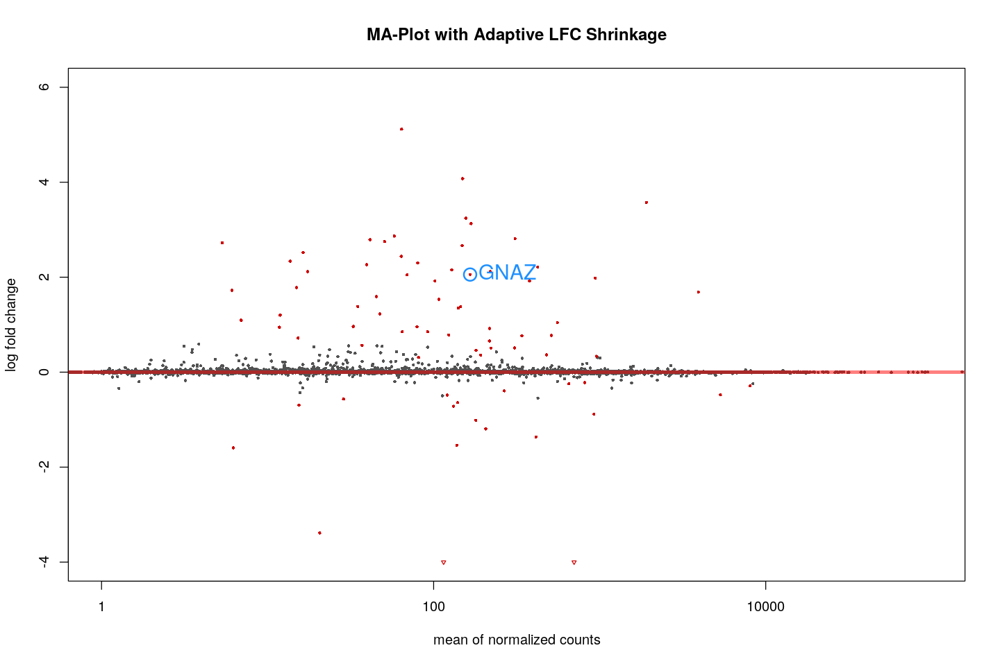

In [752]:
# MA plot
# M (log ratio) and A (mean average)
# scatter plot of log2 fold changes (y-axis) 
# versus the mean of normalized counts (x-axis)
# shows the log2 fold changes attributable to a given variable 
# over the mean of normalized counts for all samples
# --> how different samples are in terms of signal intensities
# + spot the most differentially expressed gene
options(repr.plot.width=12, repr.plot.height=8)
plotMA(resAsh_genes, 
       xlim=xlim, 
       ylim=ylim, 
       cex=0.5, 
       main="MA-Plot with Adaptive LFC Shrinkage")
with(resAsh_genes[topGene, ], {
  points(baseMean, 
         log2FoldChange, 
         col="dodgerblue", 
         cex=2, 
         lwd=2)
  text(baseMean, 
       log2FoldChange, 
       topGene, 
       pos=4, 
       col="dodgerblue", 
       cex=1.5)
})
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_MAplot.png", width=720, height=480))

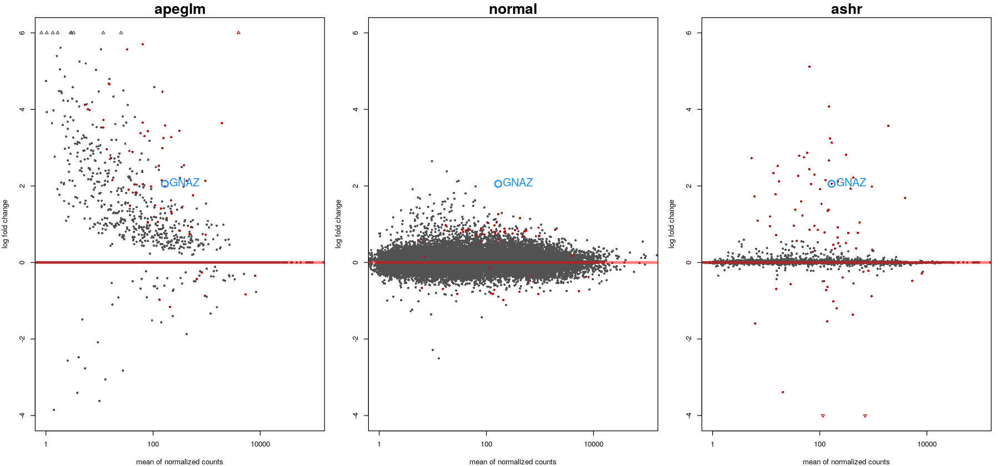

In [754]:
# plot comparison of shrinkage algorithms
options(repr.plot.width=15, repr.plot.height=7)
par(mfrow=c(1,3), mar=c(4,4,2,1))
xlim <- c(1,1e5); ylim <- c(-4,6)
plotMA(resApeglm_genes, xlim=xlim, ylim=ylim, main="apeglm", cex=0.7, cex.main=2)
with(resAsh_genes[topGene, ], {
  points(baseMean, 
         log2FoldChange, 
         col="dodgerblue", 
         cex=2, 
         lwd=2)
  text(baseMean, 
       log2FoldChange, 
       topGene, 
       pos=4, 
       col="dodgerblue", 
       cex=1.5)
})
plotMA(resNorm_genes, xlim=xlim, ylim=ylim, main="normal", cex=0.7, cex.main=2)
with(resNorm_genes[topGene, ], {
  points(baseMean, 
         log2FoldChange, 
         col="dodgerblue", 
         cex=2, 
         lwd=2)
  text(baseMean, 
       log2FoldChange, 
       topGene, 
       pos=4, 
       col="dodgerblue", 
       cex=1.5)
})
plotMA(resAsh_genes, xlim=xlim, ylim=ylim, main="ashr", cex=0.7, cex.main=2)
with(resAsh_genes[topGene, ], {
  points(baseMean, 
         log2FoldChange, 
         col="dodgerblue", 
         cex=2, 
         lwd=2)
  text(baseMean, 
       log2FoldChange, 
       topGene, 
       pos=4, 
       col="dodgerblue", 
       cex=1.5)
})
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_shrinkage_algorithms.png", width=920, height=480))

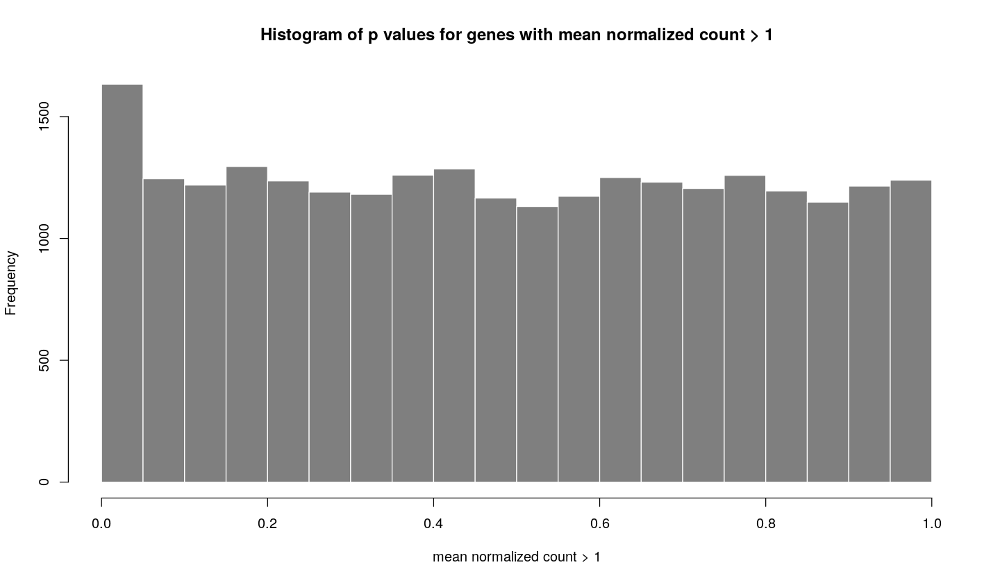

In [755]:
# histogram of the p values
options(repr.plot.width=12, repr.plot.height=7)
hist(res_salmon$pvalue[res_salmon$baseMean > 1], 
     breaks = 0:20/20, 
     col = "grey50", 
     border = "white",
     main="Histogram of p values for genes with mean normalized count > 1",
     xlab='mean normalized count > 1')
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_hist_Pvalues.png", width=720, height=480))

In [233]:
# most DE genes from VST data
rownames(vsd[head(order(rowVars(assay(vsd)), decreasing = TRUE), 20)])

[1] "IGKV1-5"    "IGHV1-69D"  "IGKV1D-39"  "FAM30A"     "DDX3Y"     
 [6] "AD000090.1" "KDM5D"      "PPP1R9A"    "IGKC"       "IGKV2-30"  
[11] "UTY"        "RPS4Y1"     "XIST"       "TXLNGY"     "IGHV3-21"  
[16] "U2"         "IGHV3-48"   "ZNF595"     "USP9Y"      "FOSB"

In [234]:
# top DE gene
rownames(dds_salmon_names)[which.min(res_salmon_names$padj)]

[1] "GNAZ"

In [235]:
rownames(dds_salmon_names)[head(which(res_salmon_names$padj < 0.05),decreasing = FALSE, 20)]

[1] "TMEM159"  "MTMR11"   "FHL1"     "ADAM28"   "TP63"     "TUBE1"   
 [7] "TLR8"     "DGKH"     "ABCA2"    "CYTH1"    "NAGLU"    "CNTNAP1" 
[13] "VDR"      "AICDA"    "CDKN2C"   "SERPINB6" "GNAZ"     "CDHR3"   
[19] "TRPM4"    "SORT1"

In [56]:
# subset of the 20 most highly variable genes from VST data
#topVarGenes <- head(order(rowVars(assay(vsd)), decreasing = FALSE), 20)
topVarGenes <- head(which(res_salmon_names$padj < 0.05),decreasing = FALSE, 55)
mat  <- assay(vsd)[topVarGenes,]
mat  <- mat - rowMeans(mat)
mat

,0286,1567,0842,1208,0271,1215,1152,0462,0384,0627,0871,0414,0820,0208,1335,1727
TMEM159,0.71284361,0.095518221,0.224454697,1.04603887,0.06933914,0.459229484,0.40790580,0.3604177925,-1.12300429,0.043764047,-0.61330516,-0.369797881,-0.493593788,-0.32189326,-0.710926710,0.21300942
MTMR11,-1.00690870,-0.547892632,-0.377797016,-0.75604689,-0.53818487,-1.006908703,-1.00690870,-0.5804092749,-0.35670096,-0.761284139,3.55777070,2.384482350,1.767053012,-0.73529413,-0.375038015,0.34006797
FHL1,-0.77875970,-0.260605787,-0.162960396,-0.44492375,-1.30235458,-1.027649928,-0.99601654,-0.3619345754,2.58223705,-0.755733276,-0.40689764,0.470662620,1.765328365,-0.76149567,2.009390929,0.43171287
ADAM28,0.61934429,0.320402361,0.285424682,0.61730451,0.03466227,0.690848519,1.32765828,0.1950994076,-1.10039149,-0.667413665,-1.24298011,-0.342462487,0.035466858,0.11517557,0.149117062,-1.03725607
TP63,-0.58497333,-1.507235679,-1.575436246,-1.34711711,0.52694002,-0.632730851,-2.20454793,-1.6035431380,1.60574730,2.424218440,3.68173804,1.212404352,0.078065460,1.37766543,-1.920163396,0.46896863
TUBE1,0.09969945,-0.009977792,0.045250091,0.71477306,0.20255146,0.392506032,0.79653547,0.0690353352,-0.21939113,-0.080594574,-0.21100990,-0.455659640,-0.598787062,0.06959707,-0.260599181,-0.55392869
TLR8,-0.66956181,2.571274878,-0.470230200,-1.30910763,-0.59721149,-0.762149555,-1.09229086,-0.8826082055,0.46456011,-0.762486334,2.20211907,-0.916907986,-0.700438062,0.96922304,-0.618009098,2.57382414
DGKH,-2.09096124,-1.230631793,0.224731957,-1.75702718,0.46800223,-2.240019002,-2.01322193,-0.3742666998,2.12613778,0.363763976,1.03365976,2.589913843,1.857682860,1.79101144,-0.551490223,-0.19728577
ABCA2,-0.73260606,-0.554782567,0.058399069,-0.93477451,-1.35477420,-0.453007348,-0.78570860,-0.1620794682,0.97501369,-0.389488501,2.65003716,-1.334622908,1.579652342,-0.66701564,0.055024944,2.05073260
CYTH1,0.28999789,0.412498092,0.022302284,0.29438278,0.26465725,-0.005456947,0.05674482,0.2666353102,0.10160240,-0.399871649,-0.17519260,-0.445831946,-0.155860759,-0.34397543,-0.118665535,-0.06396595


In [57]:
df <- as.data.frame(colData(dds_salmon_names)['condition'])

In [200]:
breaksList = seq(-2, 3, by = 0.5)
breaksList

[1] -2.0 -1.5 -1.0 -0.5  0.0  0.5  1.0  1.5  2.0  2.5  3.0

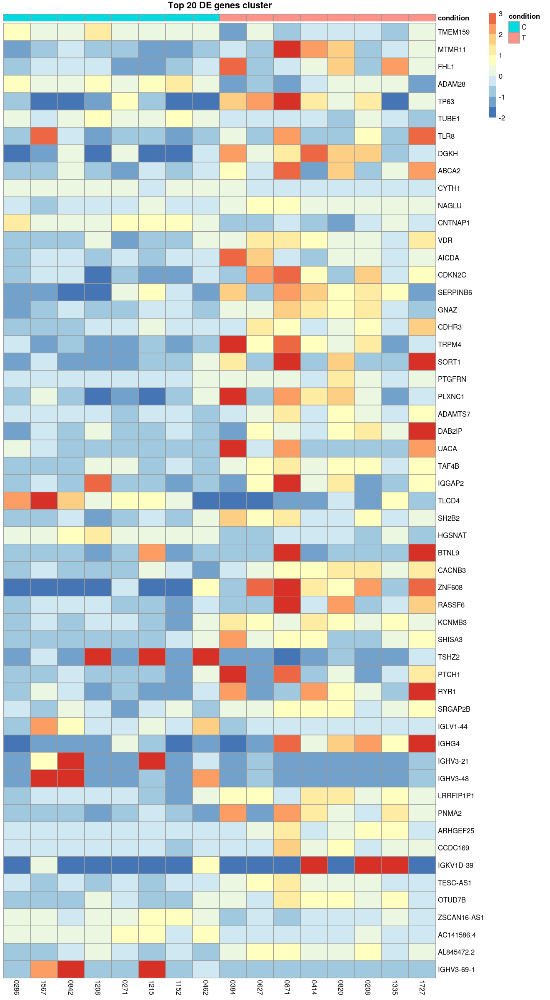

In [201]:
options(repr.plot.width=11, repr.plot.height=20)
pm = pheatmap(mat, 
              main="Top 20 DE genes cluster",
              color = colorRampPalette(rev(brewer.pal(n = 7, name = "RdYlBu")))(length(breaksList)), 
              breaks = breaksList, 
              cluster_rows=FALSE,
              cluster_cols=FALSE,
              annotation_col=df)
save_pheatmap_png(pm, 
                  "DESEQ2_RES/DESEQ2_TXIMETA_heatmap_topDEgene_FULL.png",
                  width=580, 
                  height=920)

## Exporting results

#### DESeq2 results

In [35]:
# add add gene_id and gene_name columns, reorder columns
res_salmon_names$gene_id = mcols(dds_salmon_names)$gene_id
res_salmon_names$gene_name = mcols(dds_salmon_names)$gene_name
col_order <- c('gene_id','gene_name', 'baseMean', 
               'log2FoldChange', 'lfcSE', 'stat', 'pvalue', 'padj')
invisible(res_salmon_names <- res_salmon_names[, col_order])
# subset results to chosen adjusted p-value threshold, reorder by increasing padj
res_salmon_names_sub <- subset(res_salmon_names, padj < 0.05)
res_salmon_names_sub_ord <- res_salmon_names_sub[ order(res_salmon_names_sub$padj, decreasing = FALSE), ]
# export DESeq2 processed results sorted by p-values
write.table(res_salmon_names_sub_ord, 
            file = "DESEQ2_RES/DESEQ2_salmon_results_SIG.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

#### APEGLM results

In [762]:
# add add gene_id and gene_name columns, reorder columns
resApeglm_genes$gene_id = mcols(dds_salmon_names)$gene_id
resApeglm_genes$gene_name = mcols(dds_salmon_names)$gene_name
col_order <- c('gene_id','gene_name', 'baseMean', 
               'log2FoldChange', 'lfcSE', 'pvalue', 'padj')
invisible(resApeglm_genes <- resApeglm_genes[, col_order])
# subset results to chosen adjusted p-value threshold, reorder by increasing padj
resApeglm_genes <- subset(resApeglm_genes, padj < 0.5)
resApeglm_genes <- resApeglm_genes[ order(resApeglm_genes$padj, decreasing = FALSE), ]
# export DESeq2 processed results sorted by p-values
write.table(resApeglm_genes, 
            file = "DESEQ2_RES/DESEQ2_salmon_results_APEGLM.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

#### Reporting with ReportingTools package

In [80]:
# must use the dataset with ACCESSION NUMBERS
des2Report <- HTMLReport(shortName = 'DESEQ2_salmon_ReportingTools',
                         title = 'RNA-seq analysis of differential expression with Salmon & DESeq2',
                         reportDirectory = "DESEQ2_RES/ReportingTools")
publish(dds_salmon,
        des2Report, 
        pvalueCutoff=0.1,
        annotation.db="org.Hs.eg.db",
        make.plots = TRUE,
        factor = colData(dds_salmon)$condition,
        keytype = "ENSEMBL",
        reportDir="DESEQ2_RES/ReportingTools")
finish(des2Report)

[1] "DESEQ2_RES/ReportingTools/DESEQ2_salmon_ReportingTools.html"

#### Reporting with regionReport package

In [641]:
# must use the dataset with genes SYMBOLS
suppressMessages(
reg2report <- DESeq2Report(dds_salmon_names,
                           project = "DESEQ2_salmon_regionReport", 
                           intgroup="condition",
                           outdir = 'DESEQ2_RES',
                           output='DESEQ2_salmon_regionReport',
                           device = "png", 
                           searchURL = "https://www.genecards.org/cgi-bin/carddisp.pl?gene="))

  |..                                                                                                            |   2%
   inline R code fragments

  |.....                                                                                                         |   4%
label: docSetup (with options) 
List of 3
 $ bootstrap.show.code   : logi FALSE
 $ dev                   : symbol device
 $ bootstrap.show.message: logi FALSE

  |.......                                                                                                       |   6%
  ordinary text without R code

  |.........                                                                                                     |   9%
label: setup (with options) 
List of 1
 $ bootstrap.show.message: logi FALSE

  |............                                                                                                  |  11%
  ordinary text without R code

  |..............                                                     

### Karyotype plot 

In [84]:
# retreive significantly differentially expressed genes
# works only with dataset with rownames as GENE_ID
sig <- res_salmon[which(res_salmon$padj < 0.05),]
length(rownames(sig))

[1] 55

In [96]:
# retrieve vector of sig genes from dataset with GENE_NAMES as rownames
sig_genes <- rownames(res_salmon_names[which(res_salmon_names$padj < 0.05),])

In [85]:
# find chromosomal locations for the genes
keys <- keys(org.Hs.eg.db, keytype = "ENSEMBL")
columns <-c ("CHR", "CHRLOC", "CHRLOCEND")
sel <- AnnotationDbi::select(org.Hs.eg.db, keys, columns, keytype="ENSEMBL")
sel2 <- sel[sel$ENSEMBL %in% rownames(sig),]
sel3 <- na.omit(sel2[!duplicated(sel2$ENSEMBL),])
sel3$strand <- ifelse(sel3$CHRLOC < "*", "-", "+")
sel3$start <- abs(sel3$CHRLOC)
sel3$end <- abs(sel3$CHRLOCEND)

'select()' returned 1:many mapping between keys and columns



In [106]:
id_list <- sel3$ENSEMBL

In [114]:
length(id_list)

[1] 45

In [112]:
# create a dataframe from both lists and export for Python processing with Pyensembl
tx_df = data.frame("GENE_ID" = id_list, stringsAsFactors = FALSE)
write.table(tx_df, 
            file = "SALMON_TEMP/Karyo_geneIDs.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [115]:
# back from Python
# structurue: ['GENE_ID', 'GENE_NAME']
ga_df <- read.table(file="SALMON_TEMP/Karyo_geneIDs_OK.txt", 
                        sep="\t", 
                        header=T, 
                        stringsAsFactors=F)

In [116]:
length(ga_df$GENE_NAME) == length(sel3$ENSEMBL)

[1] TRUE

In [117]:
sel3$SYMBOL <- ga_df$GENE_NAME

In [110]:
# generate a GRanges object that contains the location of the differentially expressed genes
tt <- org.Hs.egCHRLENGTHS
read <- GRanges(seqnames=Rle(paste("chr", sel3$CHR, sep="")),
               ranges=IRanges(start=sel3$start, end=sel3$end),
               strand=Rle(sel3$strand))

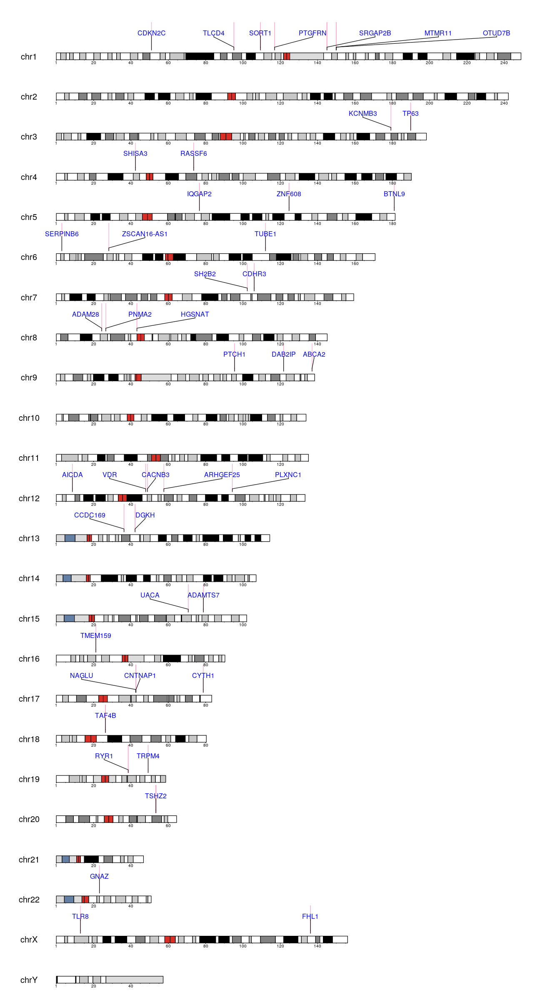

In [119]:
# produce the idiogram using a karyogram-specific layout
kp <- plotKaryotype(genome="hg38")
kpPlotRegions(kp, read, col="#FFAACC")
kpAddBaseNumbers(kp)
# cn_col <- ifelse(sample_cns$cn>2, "red", "blue")
kpPlotMarkers(kp, 
              data=read, 
              labels=sel3$SYMBOL, 
              label.color = 'blue',
              text.orientation = "horizontal", 
              r1=0.7, 
              cex=0.8, 
              marker.parts = c(0.2, 0.7, 0.1))
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_karyo_full.png", width=920, height=780))

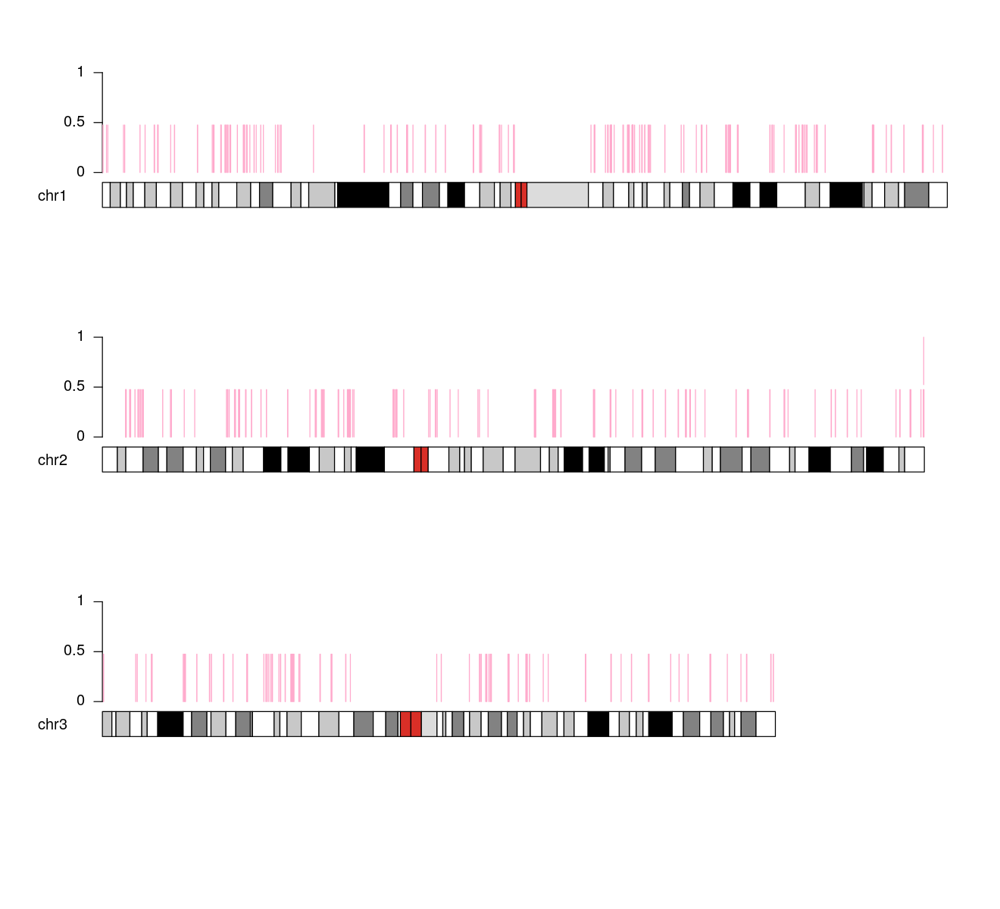

In [646]:
# chromosomes selection
kp <- plotKaryotype(genome="hg38", plot.type=2, chromosomes=c("chr1", "chr2", "chr3"))
kpAxis(kp)
kpPlotRegions(kp, read, col="#FFAACC")
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_karyo_select.png", width=920, height=780))

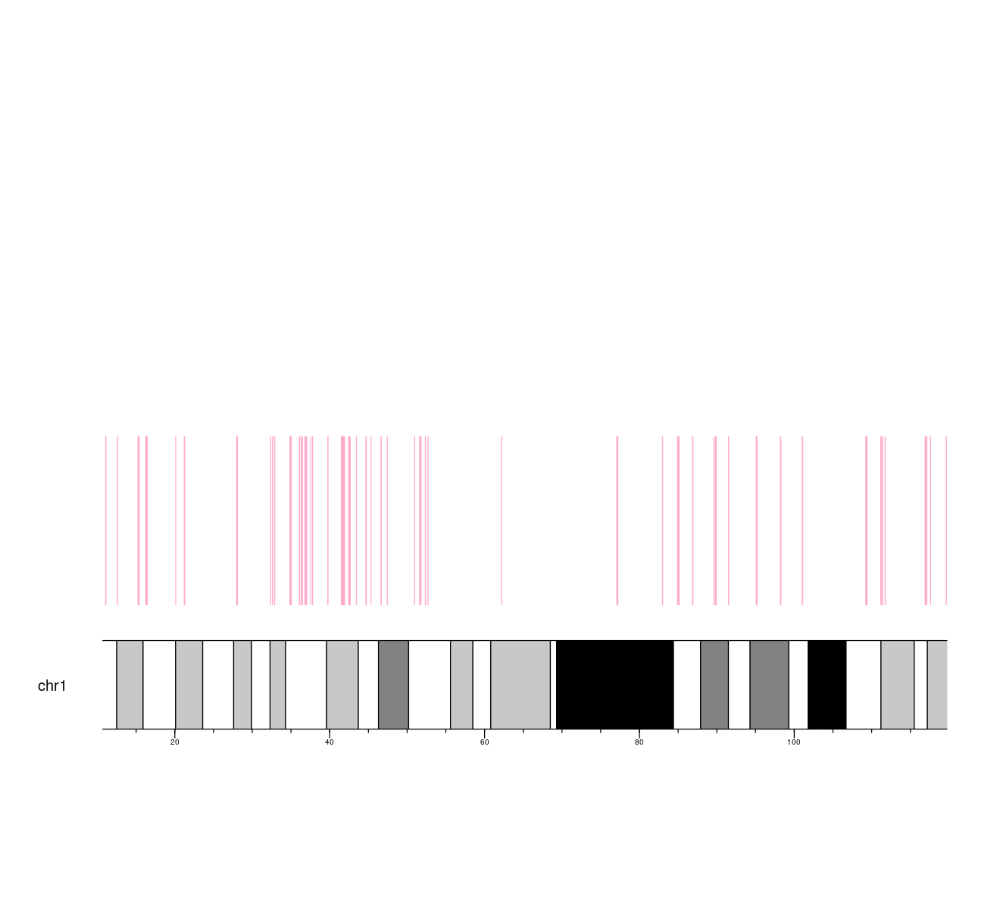

In [647]:
# Zoom on specific region
detail.region <- toGRanges(data.frame("chr1", 10644316, 119766509))
kp <- plotKaryotype(genome="hg38", chromosomes = "chr1", zoom=detail.region)
kpAddBaseNumbers(kp)
kpPlotRegions(kp, read, col="#FFAACC")
invisible(dev.print(png, "DESEQ2_RES/DESEQ2_salmon_karyo_zoom.png", width=920, height=780))

## Functional Analysis

In [33]:
head(res_salmon_names)

log2 fold change (MLE): condition T vs C 
Wald test p-value: condition T vs C 
DataFrame with 6 rows and 6 columns
                 baseMean     log2FoldChange             lfcSE
                <numeric>          <numeric>         <numeric>
TSPAN6   2.50374209030382  0.106263439749861 0.645951231594097
DPM1     254.801535805778   0.19029136358475 0.181003451879126
SCYL3    319.577673045603  0.165595088628197 0.182119507232078
C1orf112 242.344061300817   0.25920925065988 0.205840487417521
FGR      2932.20633325211 -0.215790243605175 0.303689676256859
CFH      2.39879872756564   2.53300381525146  1.43049488882645
                       stat             pvalue              padj
                  <numeric>          <numeric>         <numeric>
TSPAN6    0.164506907878511  0.869332109132646 0.994688480651133
DPM1       1.05131345070605    0.2931146514248  0.93210623777996
SCYL3     0.909266070093065  0.363209696111134 0.946170066044969
C1orf112   1.25927242940358  0.207931948071989 0.9032212

In [36]:
all_genes <- as.character(res_salmon_names$gene_name)
head(all_genes)

[1] "TSPAN6"   "DPM1"     "SCYL3"    "C1orf112" "FGR"      "CFH"

In [37]:
sig_genes <- as.character(res_salmon_names_sub$gene_name)
head(sig_genes)

[1] "TMEM159" "MTMR11"  "FHL1"    "ADAM28"  "TP63"    "TUBE1"

In [38]:
## Run GO enrichment analysis 
# BP = Biological Pathways
ego <- enrichGO(gene = sig_genes, 
                universe = all_genes,
                OrgDb = org.Hs.eg.db,
                keyType = 'SYMBOL', 
                ont = "BP", 
                pAdjustMethod = "BH", 
                qvalueCutoff = 0.05)

In [39]:
## Output results from GO analysis to a table
cluster_summary <- data.frame(ego)

In [154]:
write.table(cluster_summary, 
            file = "FUNCTIONAL_RES/clusterProfiler_BP.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

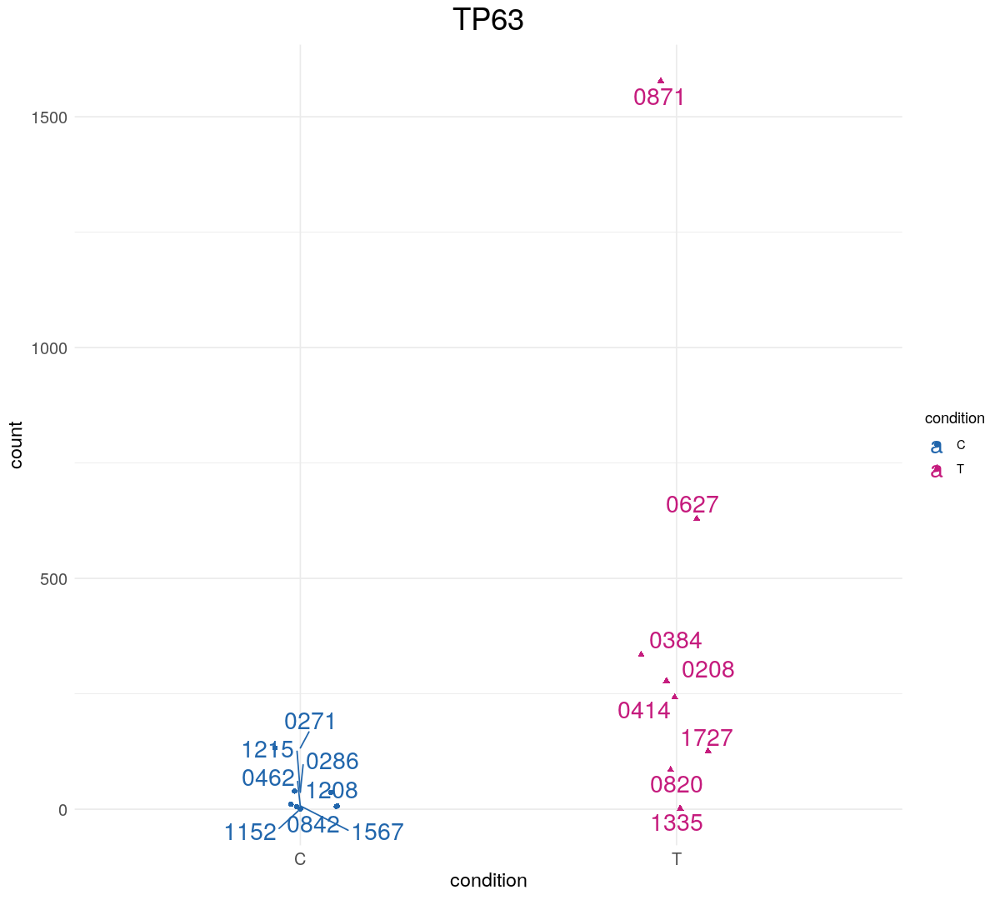

In [40]:
options(repr.plot.width=10, repr.plot.height=9)
d <- plotCounts(dds_salmon_names, 
                gene='TP63', 
                intgroup="condition", 
                returnData=TRUE)
ggplot(d, 
       aes(x = condition, 
           y = count, 
           shape = condition,
           colour = condition)) + 
theme_minimal() +
geom_point(position=position_jitter(w = 0.1,h = 0)) +
geom_text_repel(aes(label = rownames(d)), size=6) + 
ggtitle('TP63') +
theme(plot.title = element_text(hjust = 0.5, size=22), 
      axis.text=element_text(size=12),
      axis.title=element_text(size=14), 
      #legend.text=element_text(size=14),
      #legend.title=element_text(size=16),
      ) +
scale_colour_manual(values = c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]))
ggsave("DESEQ2_RES/TP63.png", width=10, height=9)
invisible(dev.off())

In [41]:
ego$geneID

[1] "TLR8/AICDA/IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"             
 [2] "TLR8/AICDA/IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"             
 [3] "TLR8/AICDA/TRPM4/IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"       
 [4] "TLR8/AICDA/TRPM4/IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"       
 [5] "TLR8/AICDA/TRPM4/IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39/OTUD7B"
 [6] "IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"                        
 [7] "IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"                        
 [8] "SH2B2/BTNL9/CACNB3/IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"     
 [9] "IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"                        
[10] "SH2B2/BTNL9/CACNB3/IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"     
[11] "CNTNAP1/TRPM4/CACNB3/KCNMB3/RYR1"                                  
[12] "IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"                        
[13] "TP63/VDR/PTCH1"                                                    
[14] "IGLV1-44/IGHG4/IGHV3-48/IGKV1D-39"                                 
[15] "IGLV1-44/IGHG4/IGHV3-48/IGKV1D-39"                                 
[16] "TP63/VDR/PTCH1"                                                    
[17] "CNTNAP1/TRPM4/CACNB3/KCNMB3"                                       
[18] "SH2B2/BTNL9/CACNB3/IGHG4/IGHV3-21/IGHV3-48"                        
[19] "IGLV1-44/IGHG4/IGHV3-48/IGKV1D-39"                                 
[20] "IGLV1-44/IGHG4/IGHV3-48/IGKV1D-39"                                 
[21] "IGLV1-44/IGHG4/IGHV3-21/IGHV3-48/IGKV1D-39"

wrong orderBy parameter; set to default `orderBy = "x"`



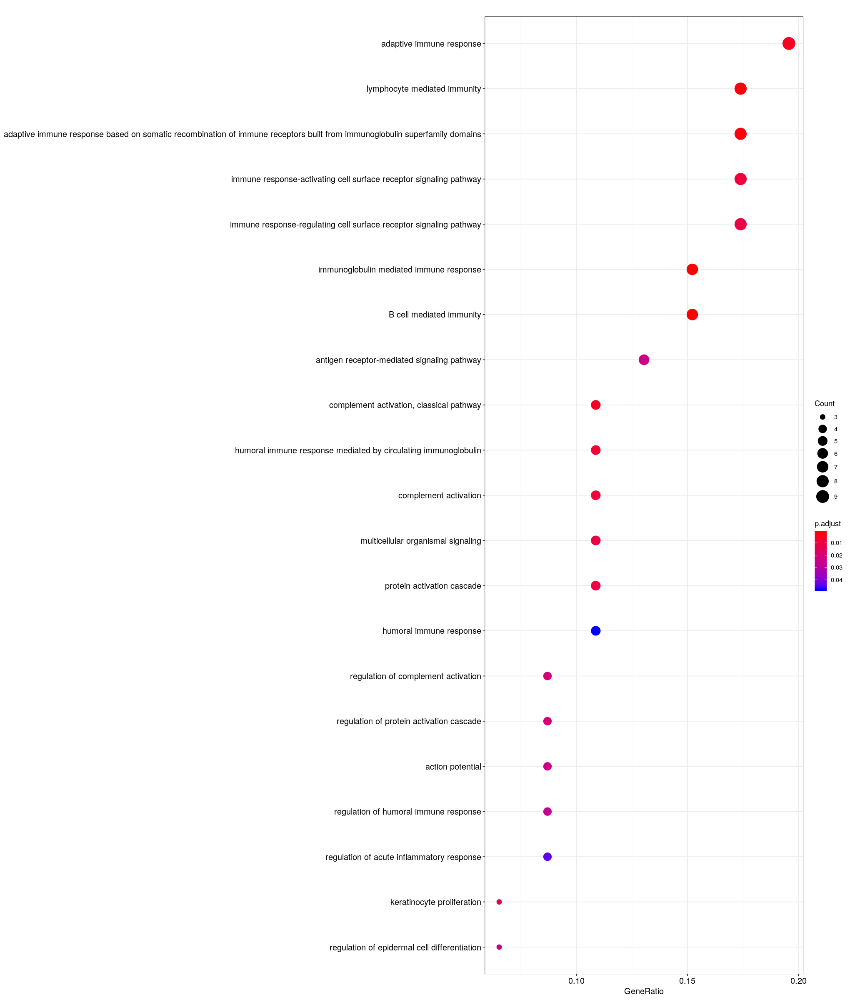

In [44]:
## Dotplot for enrichment result
# top 50 GO terms by gene ratio
# --> genes related to GO term / total number of sig genes
options(repr.plot.width=17, repr.plot.height=20)
dotplot(ego, showCategory=50)
invisible(dev.print(png, 
                    "FUNCTIONAL_RES/clusterProfiler_GO_assoc.png", 
                    width=980, 
                    height=680))

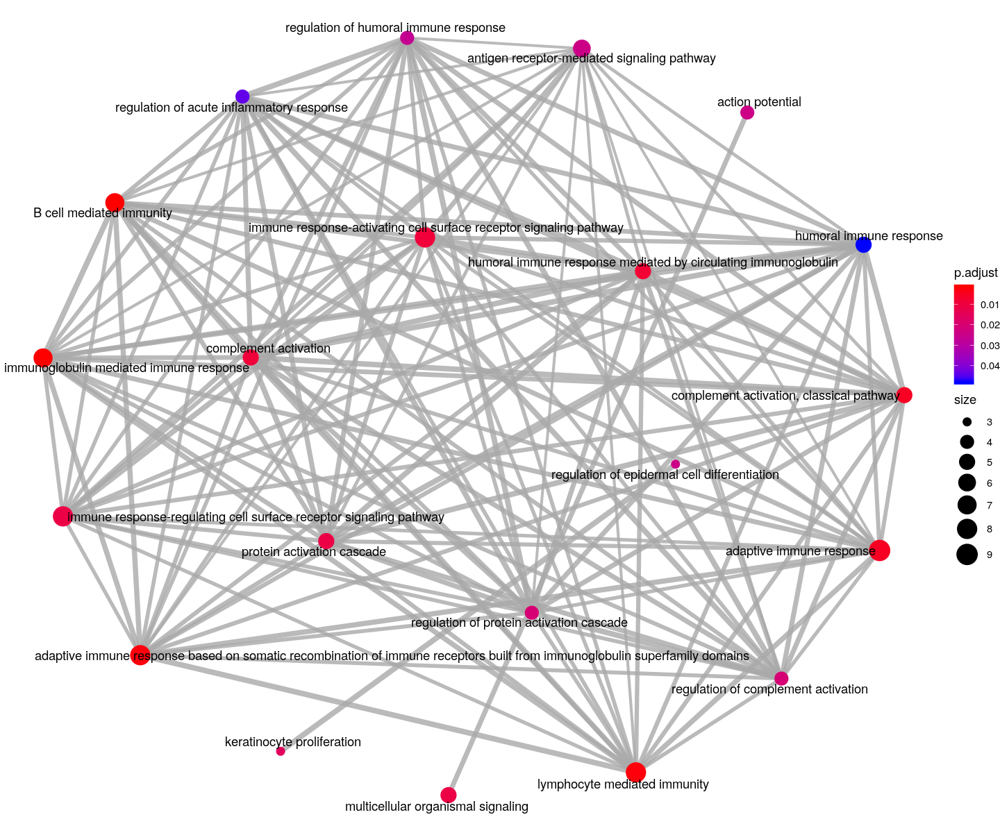

In [192]:
# Enrichment Map for enrichment result of over-representation test or gene set enrichment analysis
# relationship between the top 50 most significantly enriched GO terms (padj.)
# by grouping similar terms together
# color represents the p-values relative to the other displayed terms 
# --> brighter red is more significant 
# and the size of the terms represents the number of genes that are significant
options(repr.plot.width=12, repr.plot.height=10)
emapplot(ego, showCategory = 50)
invisible(dev.print(png, 
                    "FUNCTIONAL_RES/clusterProfiler_GO_enrich.png", 
                    width=820, 
                    height=780))

In [46]:
OE_foldchanges <- res_salmon_names_sub$log2FoldChange

In [47]:
OE_foldchanges

[1]  -1.1356515   6.1652720   3.8303785  -0.9876031   3.8070320  -0.7090457
 [7]   4.0603326   2.4221283   2.5273227  -0.3998717   0.5910785  -1.2646693
[13]   2.3651203   3.2291690   2.8962577   2.0743549   2.1188861   2.2236069
[19]   3.4755658   4.0329974   4.8110079   2.9422431   3.3981769   3.8491989
[25]   4.2300437   1.0617203   3.4044244  -2.5573861   1.5599227  -0.9450078
[31]   5.2850357   2.1447024   3.9150316   3.9761343   1.6526061   5.5139429
[37]  -6.7342609   4.9184701   3.3859053   0.9893293  -4.4249345   3.9325417
[43]  -8.3501001  -8.2761943   1.5846618   2.3129818   4.6724204   3.0942938
[49]   7.4504496   2.4218764   1.2249400  -0.8566477  -3.6863622   1.1769349
[55] -10.9628379

In [48]:
names(OE_foldchanges) <- res_salmon_names_sub$gene_name

In [224]:
## If some of the high fold changes are getting drowned out due to a large range
# we can set a maximum fold change value
OE_foldchanges <- ifelse(OE_foldchanges > 8, 8, OE_foldchanges)
OE_foldchanges <- ifelse(OE_foldchanges < -8, -8, OE_foldchanges)

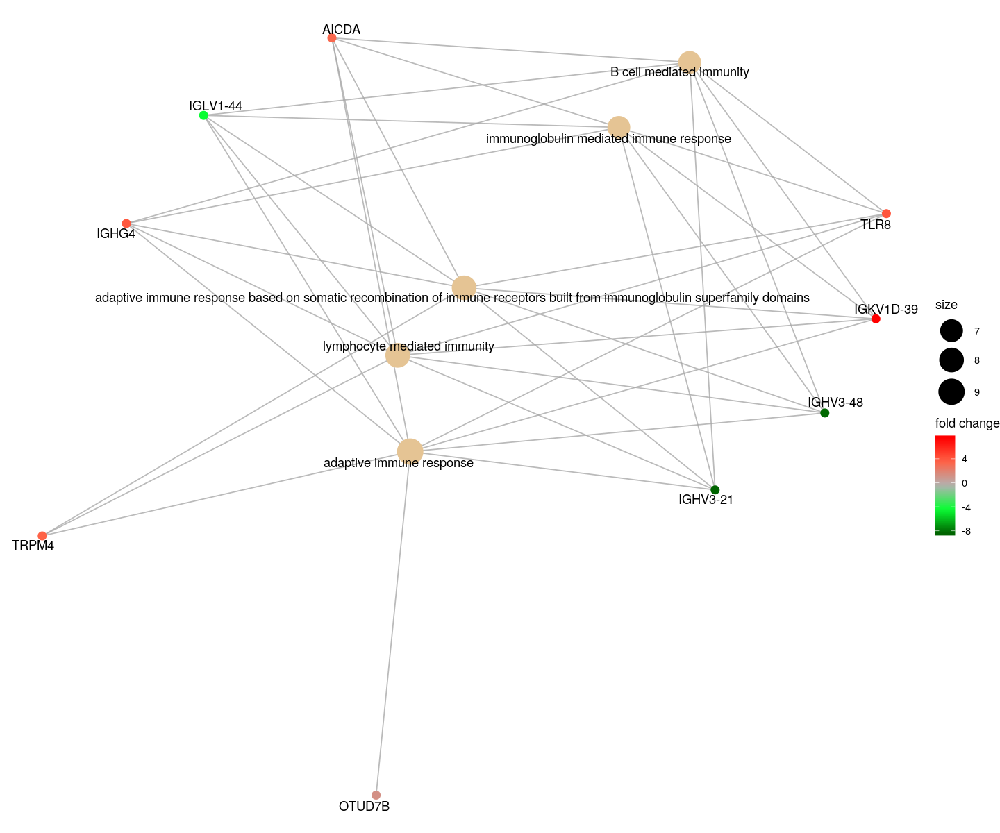

In [49]:
# category netplot
# relationships between the genes associated with the top five most significant GO terms 
# and the fold changes of the significant genes associated with these terms
options(repr.plot.width=12, repr.plot.height=10)
cnetplot(ego, 
         categorySize="pvalue", 
         showCategory = 5, 
         foldChange=OE_foldchanges, 
         vertex.label.font=6)
invisible(dev.print(png, 
                    "FUNCTIONAL_RES/clusterProfiler_GO_catnet.png", 
                    width=820, 
                    height=780))

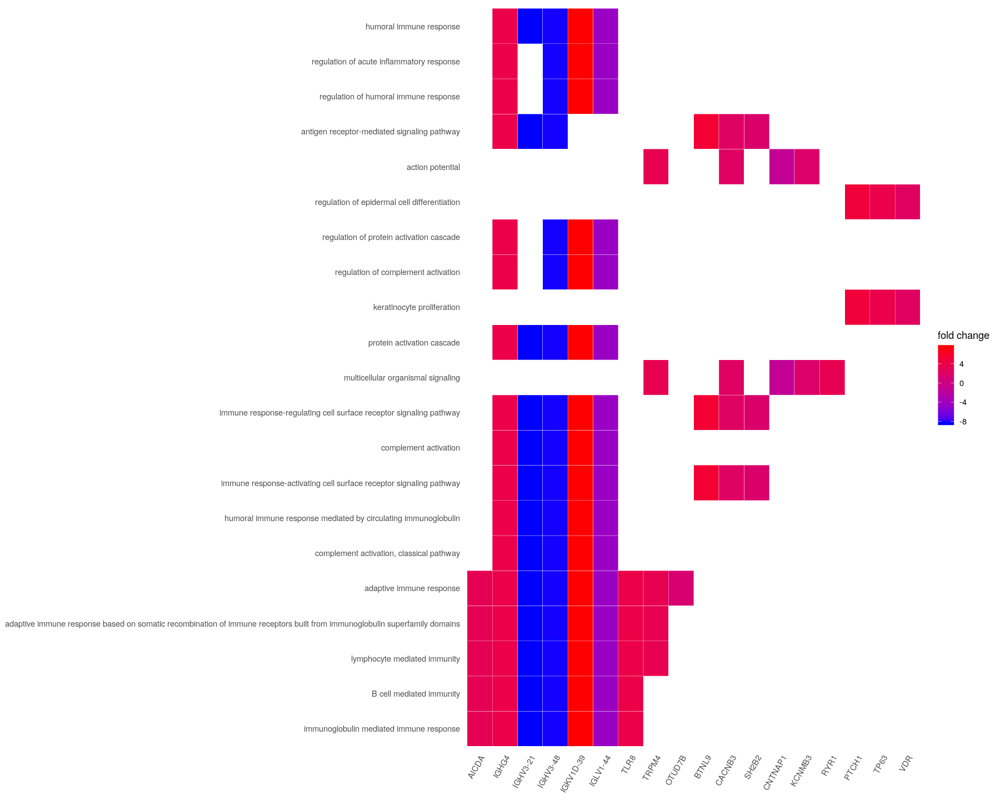

In [280]:
options(repr.plot.width=15, repr.plot.height=12)
heatplot(ego, showCategory = 50, foldChange = OE_foldchanges)
invisible(dev.print(png, 
                    "FUNCTIONAL_RES/clusterProfiler_GO_heat.png", 
                    width=780, 
                    height=580))

### GSEA analysis of KEGG gene sets,

In [50]:
hs <- org.Hs.eg.db

In [51]:
# add ENTREZ ID to full results sets
entrez <- select(hs, 
                 keys = res_salmon_names$gene_name,
                 columns = c("SYMBOL","ENTREZID","ENSEMBL"),
                 keytype = "SYMBOL",
                 multiVals="first")

'select()' returned many:many mapping between keys and columns



In [52]:
head(entrez)

SYMBOL,ENTREZID,ENSEMBL
<chr>,<chr>,<chr>
TSPAN6,7105,ENSG00000000003
DPM1,8813,ENSG00000000419
SCYL3,57147,ENSG00000000457
C1orf112,55732,ENSG00000000460
FGR,2268,ENSG00000000938
CFH,3075,ENSG00000000971


In [53]:
# remove duplicates from query dataframe
entrez <- entrez[!duplicated(entrez$SYMBOL),]

In [54]:
length(entrez$SYMBOL)

[1] 25017

In [55]:
# remove duplicates from results dataframe
res_salmon_names <- res_salmon_names[!duplicated(res_salmon_names$gene_name),]

In [56]:
length(res_salmon_names$gene_name)

[1] 25017

In [57]:
res_salmon_names$entrez_id <- entrez$ENTREZID

In [58]:
foldchanges <- res_salmon_names$log2FoldChange

In [59]:
names(foldchanges) <- res_salmon_names$entrez_id

In [60]:
## Sort fold changes in decreasing order
foldchanges <- sort(foldchanges, decreasing = TRUE)

In [61]:
head(foldchanges)

28893 100142659     27087     56654      <NA>      2904 
 7.450450  7.118628  6.849592  6.720249  6.474989  6.412977

In [62]:
## GSEA using gene sets from KEGG pathways
gseaKEGG <- gseKEGG(geneList = foldchanges, # ordered named vector of fold changes (Entrez IDs are the associated names)
              organism = "hsa", # supported organisms listed below
              nPerm = 1000, # default number permutations
              minGSSize = 20, # minimum gene set size (# genes in set) - change to test more sets or recover sets with fewer # genes
              pvalueCutoff = 0.5, # padj cutoff value
              verbose = FALSE)

In [64]:
## Extract the GSEA results
gseaKEGG_results <- gseaKEGG@result

In [65]:
gseaKEGG_results

,ID,Description,setSize,enrichmentScore,NES,pvalue,p.adjust,qvalues,rank,leading_edge,core_enrichment
,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<chr>,<chr>
hsa05200,hsa05200,Pathways in cancer,427,0.4429732,1.480864,0.001037344,0.02694639,0.02218133,3212,"tags=19%, list=13%, signal=17%",5727/10912/5155/2791/1950/1612/3458/8323/8324/9826/374654/1021/3595/3597/2254/4088/7475/2247/3082/7704/115/8313/1050/3673/3655/2785/10161/1441/367/9134/4041/2735/5578/4040/3685/3914/1164/7480/2034/3714/1488/7474/6934/29119/3596/7012/2322/4318/4855/8030/8321/7042/7422/3911/2941/5154/2784/7481/59345/5732/7015/2944/7849/3563/9817/3600/3572/7186/23566/9475/5296/1906/51561/4609/613/10683/2767/7483/3566/1871/5468/4792
hsa04060,hsa04060,Cytokine-cytokine receptor interaction,173,0.5513588,1.748893,0.001118568,0.02694639,0.02218133,3229,"tags=32%, list=13%, signal=28%",8807/944/8784/3579/5618/9235/3458/3595/3597/3553/9560/1524/6348/1442/3976/1441/6351/1435/7850/654/6349/729230/2660/656/58985/5473/27189/970/3554/608/3596/1443/7293/9173/130399/7042/56477/51330/8743/93/3563/83729/3600/23529/3572/51554/5008/92/2690/51561/2661/3566/9466/6352/1235
hsa05205,hsa05205,Proteoglycans in cancer,172,0.4962490,1.571279,0.001122334,0.02694639,0.02218133,3259,"tags=22%, list=13%, signal=19%",5727/3693/8323/8324/6385/5329/7074/7475/2247/3082/3673/1839/287/857/5578/288/3685/7480/2066/7474/7099/4318/8321/7042/10855/7422/3690/7481/7023/5600/7097/9475/5296/4609/7483/7448/2549
hsa04080,hsa04080,Neuroactive ligand-receptor interaction,150,0.5074755,1.585925,0.001145475,0.02694639,0.02218133,2815,"tags=24%, list=11%, signal=21%",2904/53637/5729/153/1511/5028/56288/5618/3001/7068/2914/1268/1442/10161/151/5739/8001/133/1138/6865/1141/1443/2696/7433/6019/5732/554/1145/1133/53829/23566/728/2570/117579/2690/1906
hsa05202,hsa05202,Transcriptional misregulation in cancer,140,0.5337327,1.658452,0.001153403,0.02694639,0.02218133,3324,"tags=22%, list=13%, signal=19%",10912/2115/1991/64919/4211/1031/8842/1668/4353/7704/1050/3002/3398/7850/4094/860/51274/4086/4005/2322/4318/5154/7849/1848/6929/597/2321/4609/5468/2313/171558
hsa05226,hsa05226,Gastric cancer,118,0.5179599,1.583163,0.001168224,0.02694639,0.02218133,4238,"tags=28%, list=17%, signal=23%",10912/1950/8323/8324/2254/4088/7475/2247/3082/8313/9134/4041/4040/7480/7474/6934/29119/7012/8321/7042/7481/7015/5296/4609/7483/1871/2549/1017/7482/898/5925/7976/6932
hsa04630,hsa04630,JAK-STAT signaling pathway,116,0.5406585,1.644996,0.001183432,0.02694639,0.02218133,3735,"tags=27%, list=15%, signal=23%",5155/2273/1950/9306/5618/3458/3595/3597/8835/1442/3976/1441/58985/3596/1443/5154/3563/3600/3572/5008/5296/2690/51561/4609/3566/9466/9021/3718/1154/8651/53342
hsa04660,hsa04660,T cell receptor signaling pathway,97,0.5814892,1.740924,0.001199041,0.02694639,0.02218133,3212,"tags=18%, list=13%, signal=15%",915/916/926/5588/9402/925/3458/919/56924/940/1326/27040/5600/5296/3702/917/4792
hsa04659,hsa04659,Th17 cell differentiation,95,0.5791844,1.726710,0.001207729,0.02694639,0.02218133,3735,"tags=24%, list=15%, signal=21%",915/916/5588/2625/3458/4088/3553/919/6095/3554/50943/27040/5600/3572/51561/3566/9466/917/4792/196/3718/5914/53342


In [66]:
write.table(gseaKEGG_results, 
            file = "FUNCTIONAL_RES/gseaKEGG_results.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

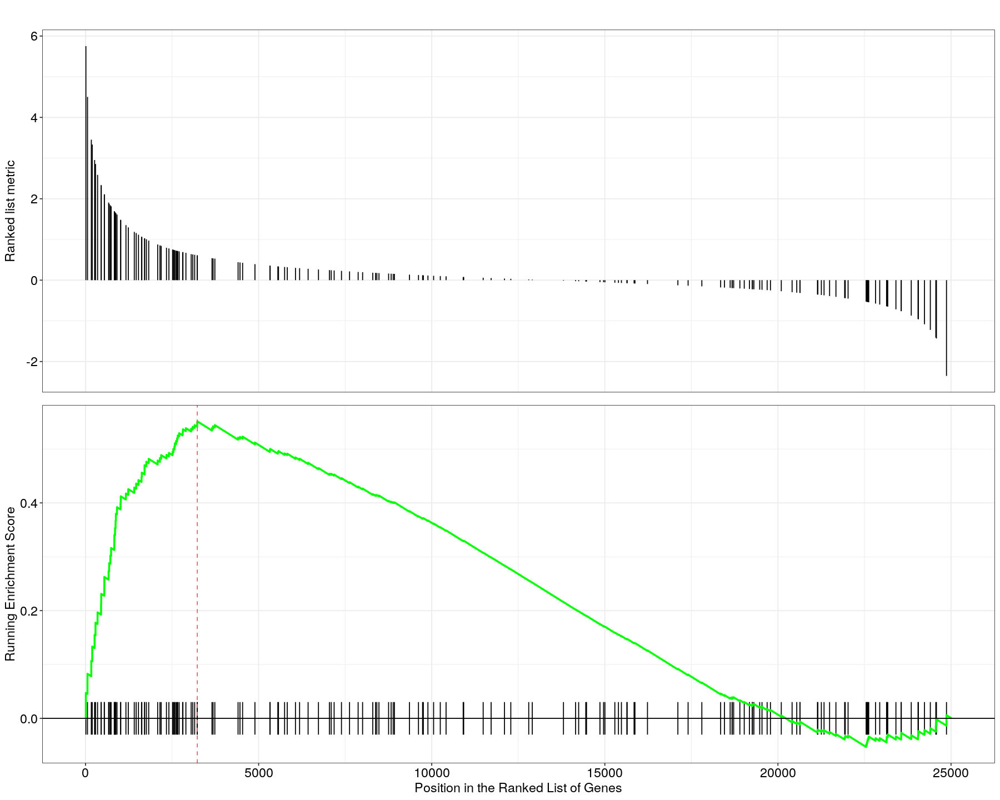

In [380]:
## Plot the GSEA plot for a single enriched pathway, `hsa03040`
gseaplot(gseaKEGG, geneSetID = 'hsa04060')

In [385]:
pathview(gene.data = foldchanges,
              pathway.id = "hsa05202",
              species = "hsa")

Info: Downloading xml files for hsa05202, 1/1 pathways..

Info: Downloading png files for hsa05202, 1/1 pathways..

'select()' returned 1:1 mapping between keys and columns

Info: Working in directory /mnt/nfs/shared/999993-Bioda/projects/kaja_transposons/RNA_SEQ/KPSP_MIX1+2

Info: Writing image file hsa05202.pathview.png



In [386]:
# GSEA using gene sets associated with BP Gene Ontology terms
gseaGO <- gseGO(geneList = foldchanges, 
                OrgDb = org.Hs.eg.db, 
                ont = 'BP', 
                nPerm = 1000, 
                minGSSize = 20, 
                pvalueCutoff = 0.05,
                verbose = FALSE) 

In [387]:
gseaGO

#
# Gene Set Enrichment Analysis
#
#...@organism 	 Homo sapiens 
#...@setType 	 BP 
#...@keytype 	 ENTREZID 
#...@geneList 	 Named num [1:25017] 7.45 7.12 6.85 6.72 6.47 ...
 - attr(*, "names")= chr [1:25017] "28893" "100142659" "27087" "56654" ...
#...nPerm 	 1000 
#...pvalues adjusted by 'BH' with cutoff <0.05 
#...674 enriched terms found
'data.frame':	674 obs. of  11 variables:
 $ ID             : chr  "GO:0071900" "GO:0010035" "GO:0045596" "GO:0071407" ...
 $ Description    : chr  "regulation of protein serine/threonine kinase activity" "response to inorganic substance" "negative regulation of cell differentiation" "cellular response to organic cyclic compound" ...
 $ setSize        : int  440 439 498 439 442 456 457 489 491 460 ...
 $ enrichmentScore: num  0.43 0.47 0.447 0.447 0.438 ...
 $ NES            : num  1.45 1.58 1.51 1.51 1.47 ...
 $ pvalue         : num  0.00103 0.00103 0.00103 0.00103 0.00103 ...
 $ p.adjust       : num  0.0209 0.0209 0.0209 0.0209 0.0209 ...
 $ qvalu

In [388]:
gseaGO_results <- gseaGO@result

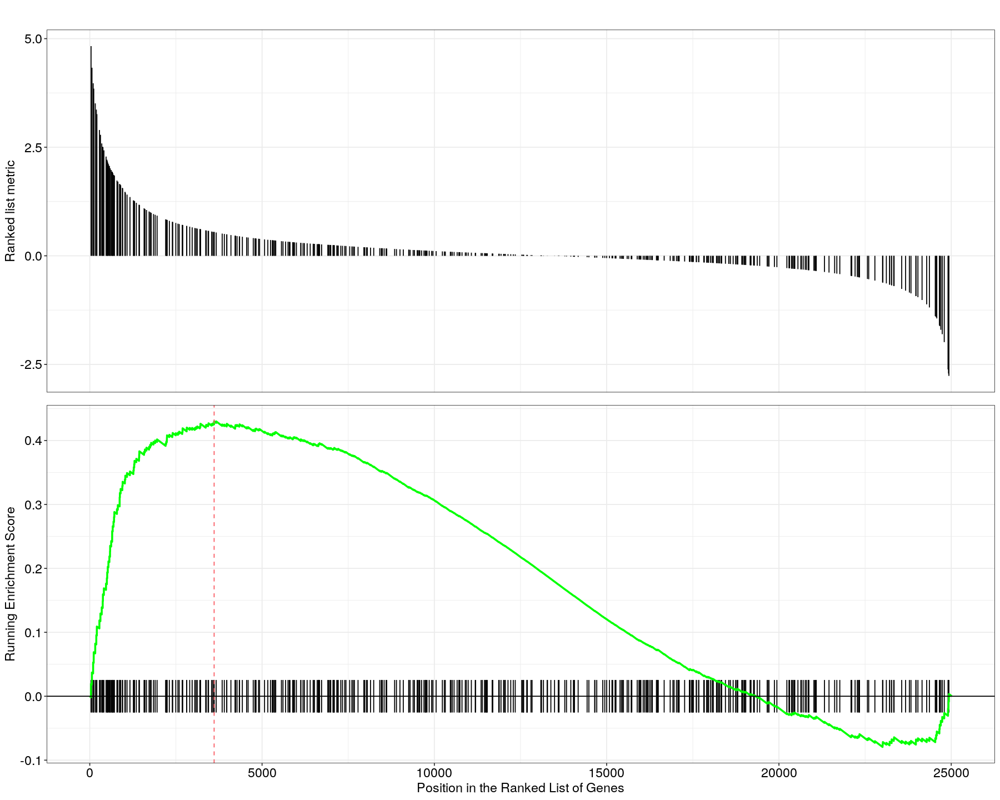

In [389]:
gseaplot(gseaGO, geneSetID = 'GO:0071900')

### SALMON import for LIMMA

In [336]:
# https://rpubs.com/pratap/424738

In [243]:
salmon_samples <- read.table(file.path("SALMON_IN", "salmon_samples.txt"), header = FALSE)
files <- file.path("SALMON_IN", paste0(salmon_samples$V1, "/",  "quant.sf"))
condition = factor(rep(c('C','T'), each = 8))
gtfPath = file.path("REF", "gencode.v32.annotation.gtf")
gtf_file = "REF/gencode.v32.annotation.gtf"
as.vector(salmon_samples$V1)

[1] "RNA01" "RNA02" "RNA03" "RNA04" "RNA05" "RNA06" "RNA07" "RNA08" "RNA09"
[10] "RNA10" "RNA11" "RNA12" "RNA13" "RNA14" "RNA15" "RNA16"

In [244]:
txdb <- makeTxDbFromGFF(file=gtf_file)

Import genomic features from the file as a GRanges object ... 
OK

Prepare the 'metadata' data frame ... 
OK

Make the TxDb object ... 
OK



In [245]:
# this input requires to leave the dots in IDs - don't process to remove them
k <- keys(txdb, keytype = "TXNAME")
tx2gene <- AnnotationDbi::select(txdb, keys = k, keytype = "TXNAME", columns = "GENEID")
head(tx2gene)

'select()' returned 1:1 mapping between keys and columns



TXNAME,GENEID
<chr>,<chr>
ENST00000456328.2,ENSG00000223972.5
ENST00000450305.2,ENSG00000223972.5
ENST00000473358.1,ENSG00000243485.5
ENST00000469289.1,ENSG00000243485.5
ENST00000607096.1,ENSG00000284332.1
ENST00000606857.1,ENSG00000268020.3


In [246]:
txi_lengthscaledTPMvalues = tximport::tximport(files,
                                               type = "salmon",
                                               txIn = TRUE, 
                                               countsFromAbundance = "lengthScaledTPM",
                                               tx2gene = tx2gene,
                                               dropInfReps = TRUE)

reading in files with read_tsv

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 


summarizing abundance

summarizing counts

summarizing length



In [247]:
summary(txi_lengthscaledTPMvalues)

                    Length Class  Mode     
abundance           962864 -none- numeric  
counts              962864 -none- numeric  
length              962864 -none- numeric  
countsFromAbundance      1 -none- character

In [248]:
names(txi_lengthscaledTPMvalues)

[1] "abundance"           "counts"              "length"             
[4] "countsFromAbundance"

In [249]:
head(txi_lengthscaledTPMvalues$counts)

ENSG00000000003.15,5.285883,1.068945,1.06216,6.205759,2.050466,1.010748,7.074189,0.0000,3.089825,2.543507,0.0000,1.848967,2.928855,3.94182,2.872112,2.82013
ENSG00000000005.6,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.0000,0.000000,0.000000,0.00000,0.000000,0.00000
ENSG00000000419.12,238.320678,257.777084,187.83639,369.616345,270.389137,197.245936,344.287369,208.9032,314.932951,333.770504,292.5198,223.154874,164.427294,244.47522,240.571588,222.25264
ENSG00000000457.14,264.119654,341.294429,300.09949,496.937183,306.697216,315.726678,423.289002,189.9704,536.101971,467.955580,268.2359,210.242295,266.472682,447.55511,283.292323,182.27777
ENSG00000000460.17,340.881259,217.630605,152.73921,196.177354,213.216550,209.247983,363.796769,226.3241,333.030713,397.423953,253.8296,149.680609,241.498870,333.41820,173.113331,160.90034
ENSG00000000938.13,2420.446396,3991.594598,1384.02419,3682.267503,5160.408297,3263.185586,4287.227211,3035.4546,6199.764414,2807.950375,1429.4508,1621.997699,1007.801714,2474.25882,3637.644113,2325.33467


In [250]:
condition = factor(rep(c('C','T'), each = 8))
dataLimma <- data.frame(names=paste0(c(as.vector(salmon_samples$V1))), 
                        condition=condition, 
                        stringsAsFactors=FALSE)
dataLimma

names,condition
<chr>,<fct>
RNA01,C
RNA02,C
RNA03,C
RNA04,C
RNA05,C
RNA06,C
RNA07,C
RNA08,C
RNA09,T


In [251]:
# rename dataset columns with sample names
colnames(txi_lengthscaledTPMvalues$counts) = as.vector(dataLimma$names)
colnames(txi_lengthscaledTPMvalues$abundance) = as.vector(dataLimma$names)
colnames(txi_lengthscaledTPMvalues$length) = as.vector(dataLimma$names)

In [252]:
# Creates DGEList object
dge = DGEList(counts = txi_lengthscaledTPMvalues$counts,
            lib.size = colSums(txi_lengthscaledTPMvalues$counts),
            norm.factors = calcNormFactors(txi_lengthscaledTPMvalues$counts),
            samples = dataLimma$names,
            group = dataLimma$condition,
            genes = NULL,
            remove.zeros = FALSE)
length(rownames(dge))

[1] 60179

### Rename columns and get Gene symbols

In [253]:
# remove the decimal
id_list = rownames(dge)
for (i in 1:length(id_list)) {
  id_list[i] <- vapply(strsplit(id_list[i], ".", fixed = TRUE), "[", "", 1)
}
rownames(dge) <- id_list
# remove duplicates
#dge <- dge[!duplicated(rownames(dge)),]
# add gene symbols
#dge = getMatrixWithSymbolsLimma(dge)
# convert factor to vector
#dge$genes$gene_id <- id_list
#dge$genes$gene_id <- as.character(dge$genes$gene_id)
#head(dge$genes$gene_id)

In [254]:
# design = table of samples corresponding to conditions
len_condition = 8
condition <- factor(c(rep("C", times=len_condition),c(rep("T", times=len_condition))))
design <- model.matrix(~0+condition)
colnames(design) <- c("C","T")
contrast <- makeContrasts(C,T,T-C, levels = design)

In [255]:
condition

[1] C C C C C C C C T T T T T T T T
Levels: C T

In [256]:
design

C,T
1,0
1,0
1,0
1,0
1,0
1,0
1,0
1,0
0,1
0,1


In [257]:
contrast

,C,T,T - C
C,1,0,-1
T,0,1,1


In [258]:
# counts are converted to logCPM values using edgeR
# --> damp down the variances of logarithms of low counts
cpm <- cpm(dge, prior.count=5)
lcpm <- cpm(dge, log=TRUE)

In [259]:
# calculate mean and median of library size
L <- mean(dge$samples$lib.size) * 1e-6
M <- median(dge$samples$lib.size) * 1e-6
c(L, M)

[1] 22.20852 21.23353

In [260]:
# number of genes that are not expressed or insiginificantly
table(rowSums(dge$counts==0)==length(colnames(dge)))


FALSE  TRUE 
35498 24681 

In [261]:
# edgeR filtering, keeping as many genes as possible with worthwhile counts
keep <- filterByExpr(dge, group=design)
dge <- dge[keep,]
dim(dge)

[1] 14239    16

In [262]:
id_list <- rownames(dge)

In [263]:
length(id_list)

[1] 14239

In [264]:
# export for Python processing with Pyensembl
id2genes_df <- data.frame("GENE_ID" = id_list, stringsAsFactors = FALSE)
write.table(id2genes_df, 
            file = "SALMON_TEMP/LIMMA_salmon_id2genes.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [265]:
# back from Python
id2genes_df <- read.table(file="SALMON_TEMP/LIMMA_salmon_id2genes_OK.txt", 
                        sep="\t", 
                        header=T, 
                        stringsAsFactors = FALSE)

In [266]:
# check if rownames and dataframe length match
length(id2genes_df$GENE_NAME) == length(rownames(dge))

[1] TRUE

In [267]:
gene_frame = data.frame(gene_id=id2genes_df$GENE_ID, gene_name=id2genes_df$GENE_NAME, stringsAsFactors = FALSE)
dge$genes <- gene_frame

In [268]:
head(dge)

An object of class "DGEList"
$counts
                    RNA01     RNA02     RNA03      RNA04     RNA05     RNA06
ENSG00000000419  238.3207  257.7771  187.8364  369.61635  270.3891  197.2459
ENSG00000000457  264.1197  341.2944  300.0995  496.93718  306.6972  315.7267
ENSG00000000460  340.8813  217.6306  152.7392  196.17735  213.2166  209.2480
ENSG00000000938 2420.4464 3991.5946 1384.0242 3682.26750 5160.4083 3263.1856
ENSG00000001036  160.5283  174.0010  208.0542   98.65004  195.8957  147.2698
ENSG00000001084 1884.8282 1240.4182 2276.5843 1296.23420 1836.7543  784.1057
                    RNA07     RNA08     RNA09     RNA10     RNA11     RNA12
ENSG00000000419  344.2874  208.9032  314.9330  333.7705  292.5198  223.1549
ENSG00000000457  423.2890  189.9704  536.1020  467.9556  268.2359  210.2423
ENSG00000000460  363.7968  226.3241  333.0307  397.4240  253.8296  149.6806
ENSG00000000938 4287.2272 3035.4546 6199.7644 2807.9504 1429.4508 1621.9977
ENSG00000001036  249.7059  144.0036  104.2084  345.3964  187.3355  225.2424
ENSG00000001084 1756.5106 1607.3731  673.5135 1919.6018  599.7020  801.6666
                    RNA13     RNA14      RNA15     RNA16
ENSG00000000419  164.4273  244.4752  240.57159  222.2526
ENSG00000000457  266.4727  447.5551  283.29232  182.2778
ENSG00000000460  241.4989  333.4182  173.11333  160.9003
ENSG00000000938 1007.8017 2474.2588 3637.64411 2325.3347
ENSG00000001036  108.3576  187.3891   97.99159  163.9580
ENSG00000001084  638.9397 1525.4426 1320.36068  933.2880

$samples
      group lib.size norm.factors samples
RNA01     C 21924905    1.0713111   RNA01
RNA02     C 23190072    0.9941123   RNA02
RNA03     C 24085839    0.8387798   RNA03
RNA04     C 24301919    1.0780769   RNA04
RNA05     C 20423190    1.0661737   RNA05
11 more rows ...

$genes
          gene_id gene_name
1 ENSG00000000419      DPM1
2 ENSG00000000457     SCYL3
3 ENSG00000000460  C1orf112
4 ENSG00000000938       FGR
5 ENSG00000001036     FUCA2
6 ENSG00000001084      GCLC

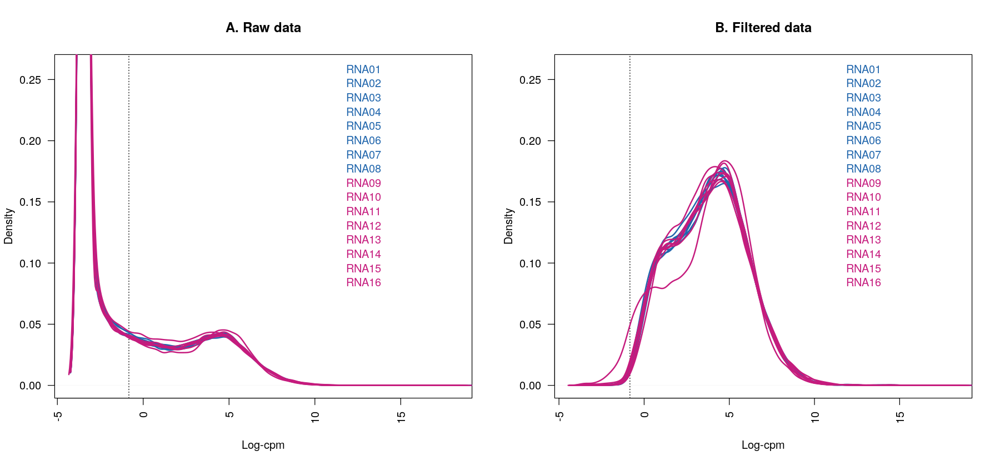

In [269]:
# density of log-CPM values for raw pre-filtered data (A) and post-filtered data (B) 
# Dotted vertical lines mark the log-CPM threshold
options(repr.plot.width=15, repr.plot.height=7)
lcpm.cutoff <- log2(10/M + 2/L)
samplenames <- colnames(dge)
nsamples <- ncol(dge)
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)
par(mfrow=c(1,2))

plot(density(lcpm[,1]), col=col[1], lwd=2, ylim=c(0,0.26), las=2, main="", xlab="")
title(main="A. Raw data", xlab="Log-cpm")
abline(v=lcpm.cutoff, lty=3)
for (i in 2:nsamples){
    den <- density(lcpm[,i])
    lines(den$x, den$y, col=col[i], lwd=2)
}
legend("topright", samplenames, text.col=col, bty="n")

lcpm <- cpm(dge, log=TRUE)
plot(density(lcpm[,1]), col=col[1], lwd=2, ylim=c(0,0.26), las=2, main="", xlab="")
title(main="B. Filtered data", xlab="Log-cpm")
abline(v=lcpm.cutoff, lty=3)
for (i in 2:nsamples){
    den <- density(lcpm[,i])
    lines(den$x, den$y, col=col[i], lwd=2)
}
legend("topright", samplenames, text.col=col, bty="n")
invisible(dev.print(png, "LIMMA_RES/LIMMA_salmon_rawVSedgeR.png", width=960, height=480))

In [270]:
# edgeR normalization
# option: "TMM","TMMwsp","RLE","upperquartile","none"
# RLE: relative log expression
# TMM: normalisation by trimmed mean of M-values
# scaling factors closer to 1 --> milder TMM-normalisation effect
dge <- calcNormFactors(dge, method = "TMM")
dge$samples$norm.factors

[1] 1.0629062 0.9911614 0.8434777 1.0664484 1.0976602 1.0941729 1.1545304
 [8] 0.9822921 0.9187418 1.1935142 0.5306728 1.1615602 0.9909310 1.1986888
[15] 1.1024453 0.8752875

In [272]:
# remove shifts in the group means associated with the grouping factor you provide
# per row of the matrix

dge_rm <- removeBatchEffect(dge, batch=condition)

ERROR: Error in getEAWP(object): data object isn't of a recognized data class


In [273]:
# duplicate dataset and adjust to see differences before/after normalization
dge2 <- dge
dge2$samples$norm.factors <- 1
dge2$counts[,1] <- ceiling(dge2$counts[,1]*0.05)
dge2$counts[,2] <- dge2$counts[,2]*5

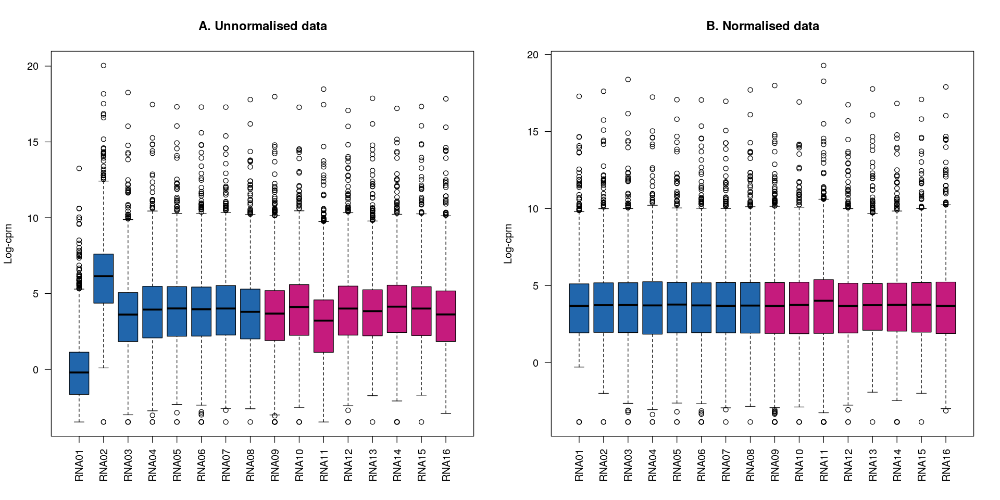

In [274]:
# expression distribution of samples for unnormalised and normalised data
#png("LIMMA_RES/ebseq_FCvsPFC_gene_expr.png")
options(repr.plot.width=16, repr.plot.height=8)
par(mfrow=c(1,2))
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)

lcpm <- cpm(dge2, log=TRUE)
boxplot(lcpm, las=2, col=col, main="")
title(main="A. Unnormalised data",ylab="Log-cpm")

dge2 <- calcNormFactors(dge2)
lcpm <- cpm(dge2, log=TRUE)
boxplot(lcpm, las=2, col=col, main="")
title(main="B. Normalised data",ylab="Log-cpm")

invisible(dev.print(png, "LIMMA_RES/LIMMA_salmon_rawVSnorm.png", width=960, height=480))

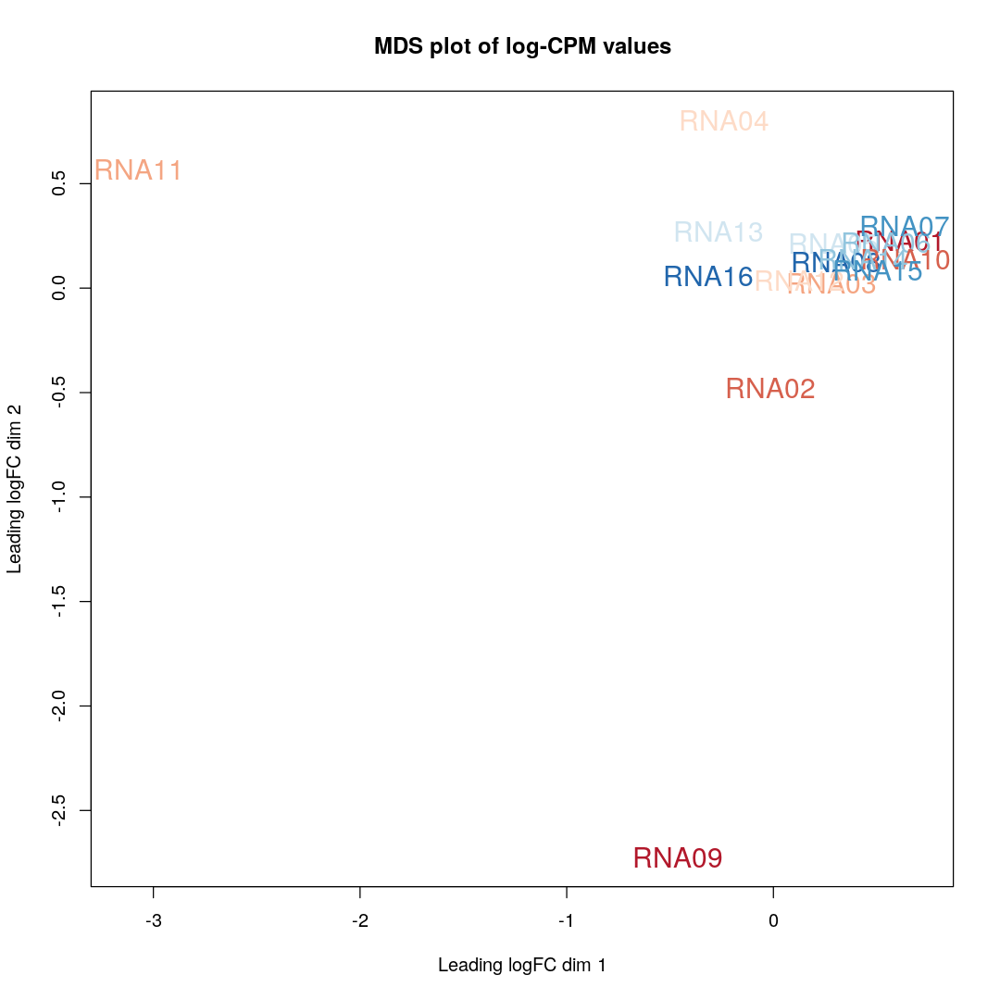

In [275]:
# LogCPM : log counts per million (expression level)
# LogFC : log fold-change (log difference between conditions)
# MDS plot of log-CPM values over dimensions 1 and 2 with samples coloured and labeled by sample
# MDS = multi-dimensional scaling
# dim1 : leading-fold-change that best separates samples and explains the largest proportion of variation in the data
options(repr.plot.width=9, repr.plot.height=9)
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)

lcpm <- cpm(dge, log=TRUE)

col.group <- design
col.group <- as.character(col.group)
plotMDS(lcpm, labels=rownames(dge$samples), col=brewer.pal(n=8, name = "RdBu"), cex=1.5)
title(main="MDS plot of log-CPM values")
invisible(dev.print(png, "LIMMA_RES/LIMMA_salmon_MDS_log-CPM.png", width=480, height=480))

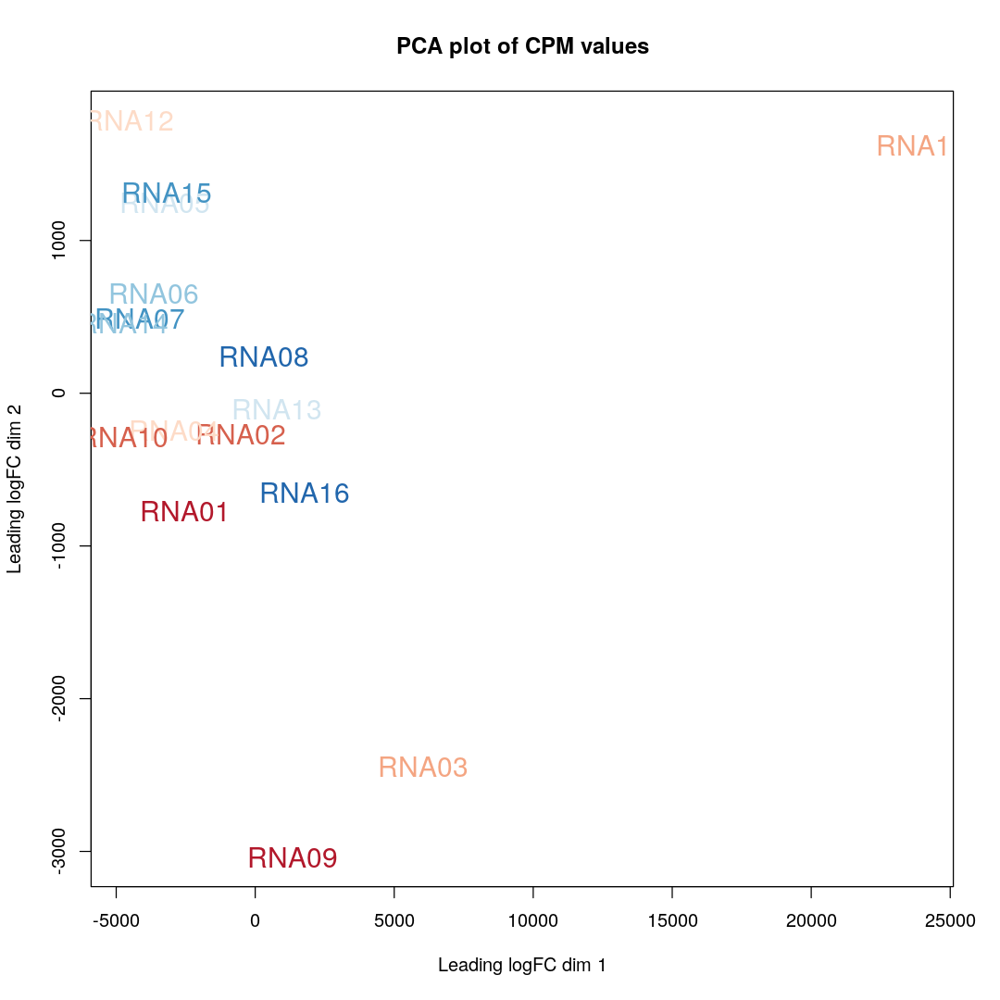

In [276]:
# PCA plot with CPM values over dimensions 1 and 2 with samples coloured and labeled by sample
options(repr.plot.width=9, repr.plot.height=9)
col <- rep(c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "PiYG")[1]), each = 8)

cpm <- cpm(dge)

col.group <- design
col.group <- as.character(col.group)
plotMDS(cpm, 
        labels=rownames(dge$samples), 
        col=brewer.pal(n=8, name = "RdBu"), 
        cex=1.5,
        #xlim=c(-6000,10000),
        #ylim=c(-3500,2000)
       )
title(main="PCA plot of CPM values")
invisible(dev.print(png, "LIMMA_RES/LIMMA_salmon_PCA_CPM.png", width=480, height=480))

## B) Differential Expression Analysis

In [595]:
# for RNA-seq count data, the variance is not independent of the mean,
# this is true of raw counts or when transformed to log-CPM values
# --> voom converts raw counts to log-CPM values by automatically extracting library sizes 
# and normalisation factors.
# the voom-plot provides a visual check on the level of filtering performed upstream.

#### VOOM transformation

In [596]:
# 1) counts are transformed to log2 counts per million reads (CPM)
# 2) linear model is fitted to the log2 CPM for each gene, residuals are calculated
# 3) smoothed curve is fitted to the sqrt(residual standard deviation) by average expression
# 4) moothed curve is used to obtain weights for each gene and sample
# --> problem if the curve points downward in extremes
# --> should be open "U" shape

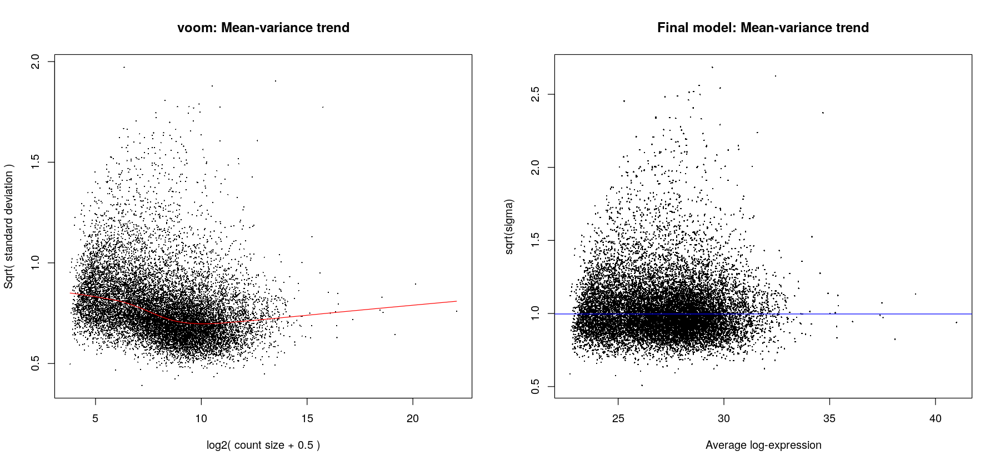

In [277]:
# Means (x-axis) and variances (y-axis) of each gene are plotted to show the dependence
# before voom is applied to the data (left panel) 
# and how the trend is removed after voom precision weights are applied to the data
# LEFT: residual variances from fitting linear models to log-CPM transformed data
# RIGHT: log2 residual standard deviations against mean log-CPM values
options(repr.plot.width=15, repr.plot.height=7)
par(mfrow=c(1,2))
v <- voom(dge, design, plot=TRUE, lib.size=TRUE)
# lmFit fits a linear model using weighted least squares for each gene
vfit <- lmFit(v)
# contrast between conditions (log fold-changes)
vfit <- contrasts.fit(vfit, contrasts=contrast)
# Empirical Bayes smoothing of standard errors
# shrinks standard errors that are much larger or smaller 
# than those from other genes towards the average standard error
efit <- eBayes(vfit)
plotSA(efit, main="Final model: Mean-variance trend")
invisible(dev.print(png, "LIMMA_RES/LIMMA_salmon_voom.png", width=960, height=480))

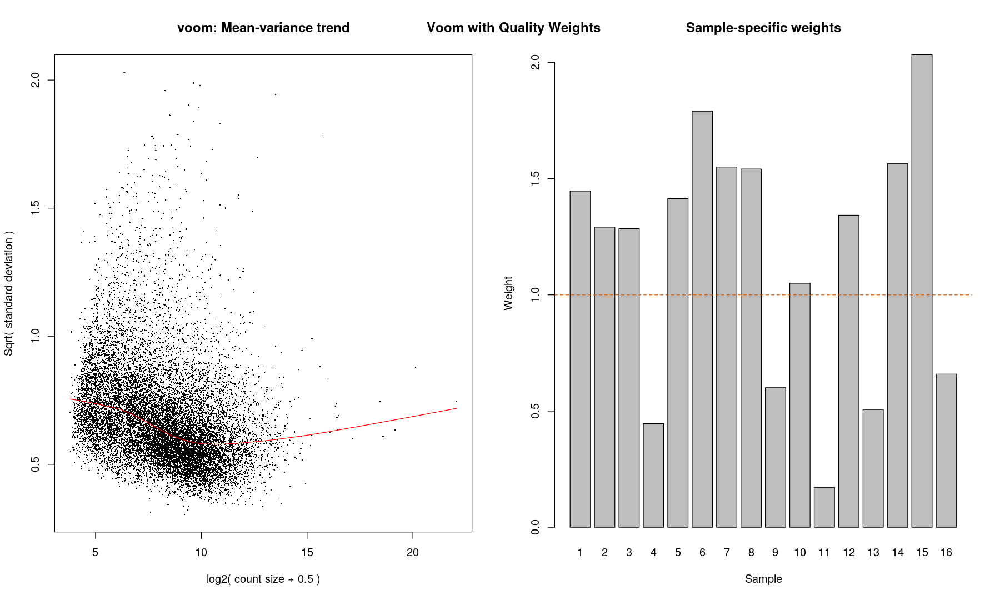

In [278]:
# Voom with Quality weights
options(repr.plot.width=15, repr.plot.height=9)
vv <- voomWithQualityWeights(dge, design, plot = TRUE)
title(main="Voom with Quality Weights")
invisible(dev.print(png, 
                    "LIMMA_RES/LIMMA_salmon_voomQualityWeights.png", 
                    width=960, 
                    height=480))

In [279]:
# After fitting a linear model, the standard errors are moderated 
# using a simple empirical Bayes model
# --> top DE genes
treat_efit <- treat(vfit,lfc=0.1)
top_treat_efit <- topTreat(treat_efit,coef=3, sort.by = "P", n = Inf)
head(top_treat_efit)

,gene_id,gene_name,logFC,AveExpr,t,P.Value,adj.P.Val
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000108797,ENSG00000108797,CNTNAP1,-1.519692,26.43317,-5.417020,0.00001505154,0.2143189
ENSG00000165102,ENSG00000165102,HGSNAT,-1.119124,28.68835,-4.497888,0.00012082237,0.7196694
ENSG00000152767,ENSG00000152767,FARP1,2.328435,27.99908,4.338178,0.00021815640,0.7196694
ENSG00000110324,ENSG00000110324,IL10RA,-1.272084,31.80798,-4.193255,0.00025980958,0.7196694
ENSG00000011638,ENSG00000011638,TMEM159,-1.375007,25.79739,-4.119049,0.00031779383,0.7196694
ENSG00000128266,ENSG00000128266,GNAZ,1.753272,25.79765,4.127264,0.00033469490,0.7196694


In [280]:
# Export results
write.table(top_treat_efit, 
            file = "LIMMA_RES/LIMMA_salmon_results_topTreat_efit.txt", 
            row.names = F, 
            sep = "\t", 
            quote = F)

In [281]:
head(efit$genes$gene_name)

[1] "DPM1"     "SCYL3"    "C1orf112" "FGR"      "FUCA2"    "GCLC"

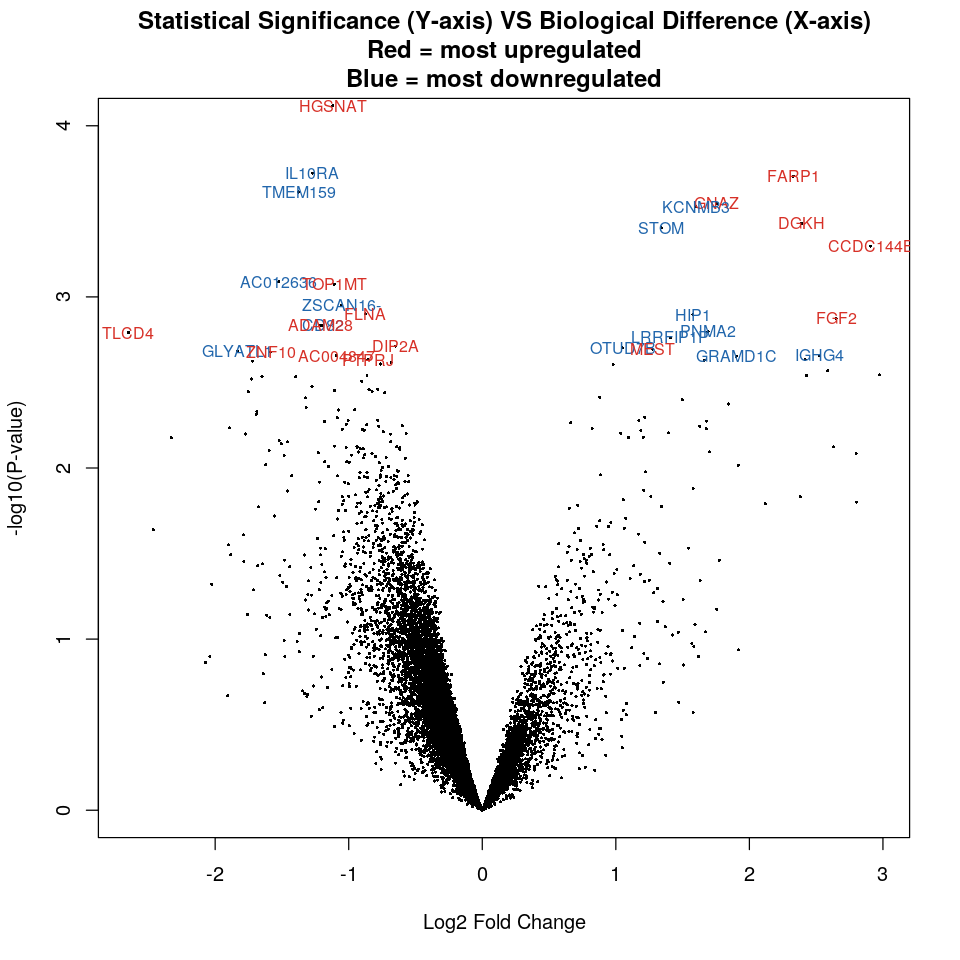

In [282]:
# Volcano plot
# simultaneously assess the P values (statistical significance) 
# and log ratios (biological difference) of differential expression
options(repr.plot.width=8, repr.plot.height=8)
volcanoplot(efit, 
            coef=3, 
            highlight=30, 
            names = efit$genes$gene_name, 
            main = "Statistical Significance (Y-axis) VS Biological Difference (X-axis)\nRed = most upregulated\nBlue = most downregulated",
            hl.col= c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "RdYlBu")[1]),
            ylim=c(0,4))
invisible(dev.print(png, "LIMMA_RES/LIMMA_salmon_volcano.png", width=480, height=480))

In [283]:
# decideTest: classify a series of related t-statistics as up, down or not significant
dt <- decideTests(efit,method="hierarchical",lfc=log2(1.5),adjust.method="fdr")
summary_test <- capture.output(summary(dt[,3]))
fileConn<-file("LIMMA_RES/LIMMA_salmon_resultsSummary_decideTest.txt")
writeLines(summary_test, fileConn)
close(fileConn)
summary(dt[,3])

       T - C
Down     405
NotSig 13739
Up        95

In [284]:
write.fit(efit, 
          dt, 
          file="LIMMA_RES/LIMMA_salmon_results_EFIT.txt", 
          sep="\t", 
          row.names=TRUE)

In [285]:
# top differentially expressed genes
de_genes <- which(dt[,3]!=0)
head(treat_efit$genes$gene_name[de_genes], n=20)

[1] "GCLC"    "CD38"    "ACSM3"   "MAP3K14" "KDM7A"   "ELAC2"   "LUC7L"  
 [8] "CEP68"   "ZBTB32"  "TMEM159" "ALOX5"   "EHD3"    "PGM3"    "CD6"    
[15] "PLEKHB1" "CCDC28A" "AGPAT4"  "ADAM28"  "ARAP2"   "WWC3"

In [286]:
# top downregulated genes
down_genes <- which(dt[,3]==-1)
head(treat_efit$genes$gene_name[down_genes], n=20)

[1] "GCLC"    "ACSM3"   "MAP3K14" "KDM7A"   "ELAC2"   "LUC7L"   "CEP68"  
 [8] "ZBTB32"  "TMEM159" "ALOX5"   "EHD3"    "PGM3"    "CD6"     "PLEKHB1"
[15] "CCDC28A" "AGPAT4"  "ADAM28"  "ANAPC4"  "KCNH2"   "CYFIP2"

In [287]:
# top upregulated genes
up_genes <- which(dt[,3]==1)
head(treat_efit$genes$gene_name[up_genes], n=20)

[1] "CD38"    "ARAP2"   "WWC3"    "BCAT1"   "MYLK"    "TTC38"   "FMO4"   
 [8] "MAP2"    "DLG3"    "ULK2"    "BCORL1"  "GNPNAT1" "CEP128"  "FAM83D" 
[15] "DGKH"    "MEST"    "ABCA2"   "CCDC6"   "SOBP"    "BMP8B"

In [288]:
# top DE genes
# AveExpr: Average expression across all samples, in log2 CPM
# F: logFC divided by its standard error
# P.Value: Raw p-value (based on F) from test that logFC differs from 0
# adj.P.Val: Benjamini-Hochberg false discovery rate adjusted p-value
# --> Gene X has different expression in C and T...
# --> topTable generates a table of differentially expressed probesets
table_efit <- topTable(efit, coef=3, sort.by = "P", n = Inf)
head(table_efit, 20)

,gene_id,gene_name,logFC,AveExpr,t,P.Value,adj.P.Val,B
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000108797,ENSG00000108797,CNTNAP1,-1.5196915,26.43317,-5.798584,0.00001076781,0.1533229,-3.120362
ENSG00000165102,ENSG00000165102,HGSNAT,-1.1191243,28.68835,-4.939236,0.00007641440,0.5440323,-2.952991
ENSG00000110324,ENSG00000110324,IL10RA,-1.2720843,31.80798,-4.551016,0.00018891822,0.6042239,-3.212338
ENSG00000152767,ENSG00000152767,FARP1,2.3284349,27.99908,4.532851,0.00019713027,0.6042239,-3.230279
ENSG00000011638,ENSG00000011638,TMEM159,-1.3750071,25.79739,-4.442110,0.00024386753,0.6042239,-3.582335
ENSG00000128266,ENSG00000128266,GNAZ,1.7532720,25.79765,4.376906,0.00028420229,0.6042239,-3.594836
ENSG00000171121,ENSG00000171121,KCNMB3,1.5991673,25.32999,4.358093,0.00029704103,0.6042239,-3.660681
ENSG00000102780,ENSG00000102780,DGKH,2.3930610,27.90285,4.263231,0.00037121893,0.6221625,-3.345273
ENSG00000148175,ENSG00000148175,STOM,1.3402703,26.08262,4.238710,0.00039324831,0.6221625,-3.595893


In [289]:
# how many DE genes with P.Val < 0.1
length(which(table_efit$P.Val < 0.1))

[1] 1472

In [290]:
write.table(table_efit, 
          file="LIMMA_RES/LIMMA_salmon_results_topTable_efit.txt", 
          sep="\t", 
          row.names=F)

In [291]:
# adding the status to genes
efit$genes$Status <- dt[,3]

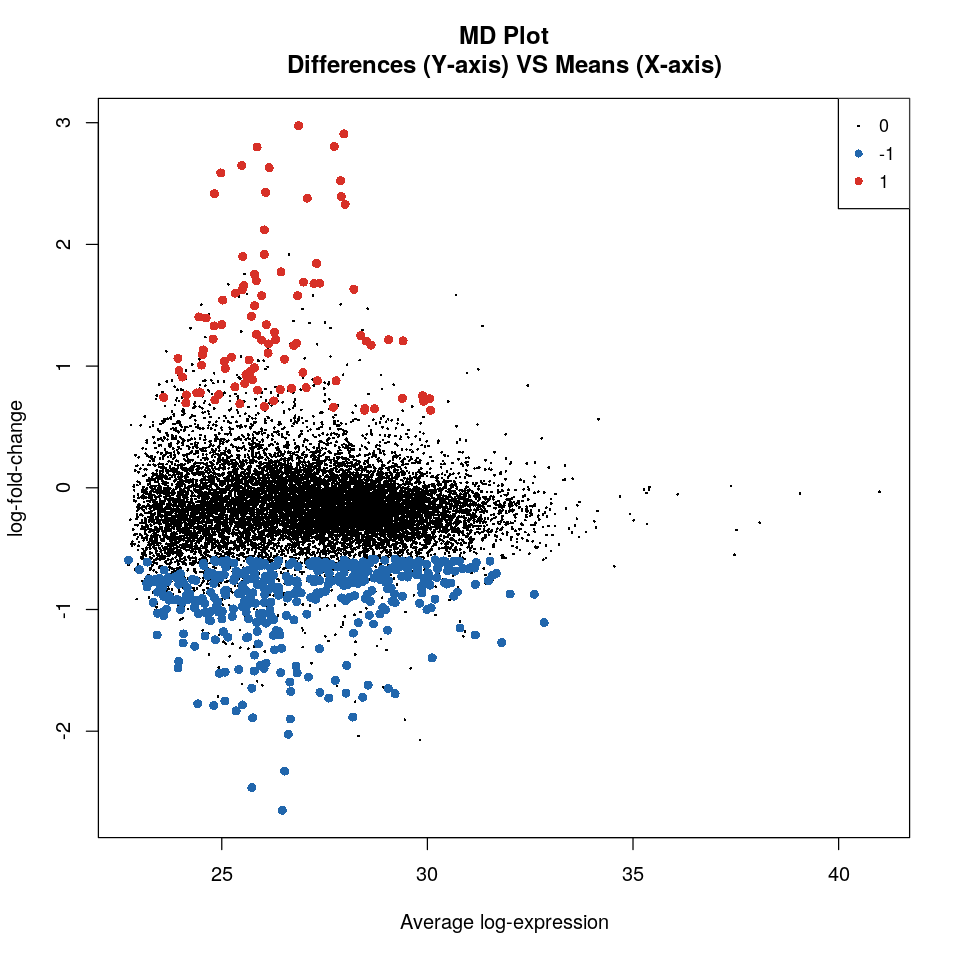

In [292]:
# Mean-difference plot
# log fold changes (differences) versus average log values (means)
options(repr.plot.width=8, repr.plot.height=8)
plotMD(efit,coef=3, 
       status=efit$genes$Status,
       main="MD Plot\nDifferences (Y-axis) VS Means (X-axis)", 
       hl.col= c(brewer.pal(8, "RdBu")[8], brewer.pal(8, "RdYlBu")[1]),
        values=c(-1,1))
invisible(dev.print(png, "LIMMA_RES/LIMMA_salmon_MD_plot.png", width=480, height=480))

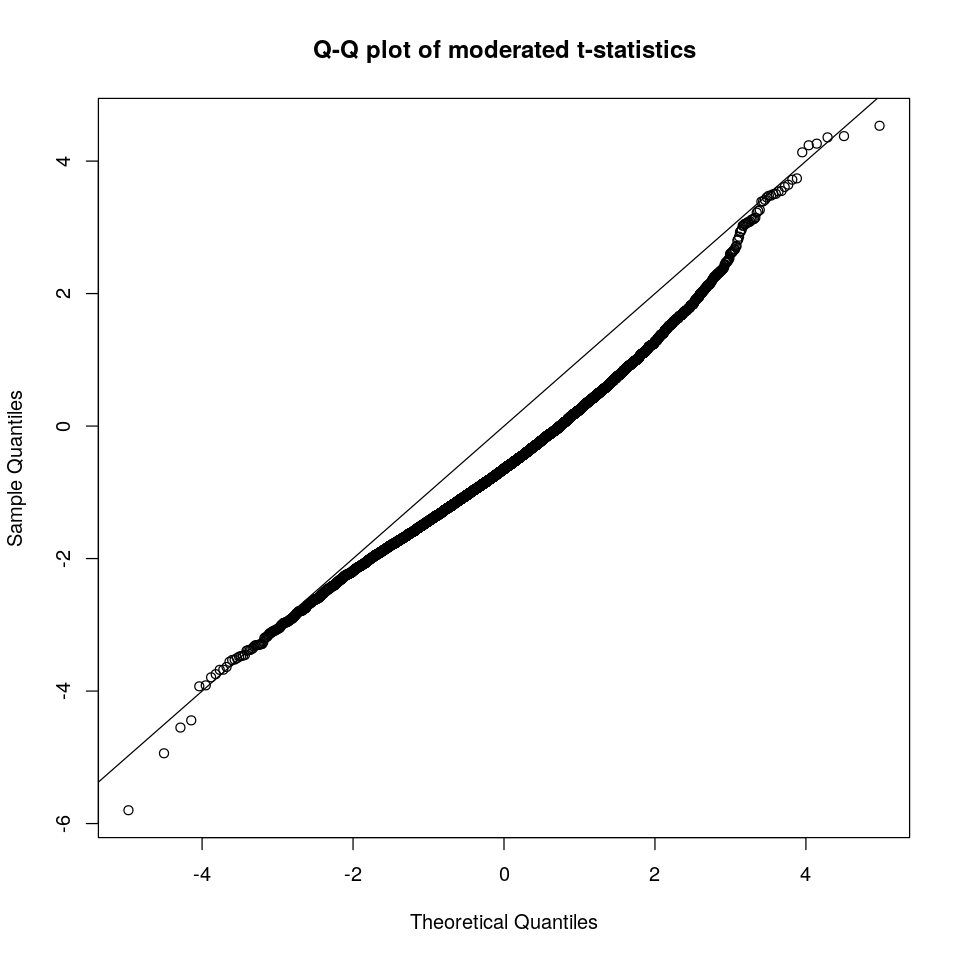

In [293]:
# Q-Q plot of moderated t-statistics
# Plots the quantiles of a data sample against 
# the theoretical quantiles of a Student's t distribution
qqt(efit$t[,3],df=efit$df.residual+efit$df.prior, main ="Q-Q plot of moderated t-statistics")
abline(0,1)
invisible(dev.print(png, "LIMMA_RES/LIMMA_salmon_QQ_plot.png", width=480, height=480))